# <CENTER> **Regression task: MolPredict. Exploring Chemistry**

#### **Постановка задачи:**

На основании предоставленных данных от химиков необходимо построить прогноз, позволяющий подобрать наиболее эффективное сочетание параметров для создания лекарственных препаратов.

Для этого требуется:

Проанализировать текущие параметры с использованием различных методов.
Научиться предсказывать их эффективность.
Как и в любой задаче машинного обучения, здесь нет однозначного ответа на вопрос, какая модель обеспечит наилучший результат. Поэтому необходимо протестировать различные подходы, проанализировать возможные результаты, сравнить качество построенных моделей и сделать обоснованные выводы.

Необходимо создать несколько максимально эффективных моделей регрессии для решения следующих задач:

* Регрессия для $IC50$;

* Регрессия для $CC50$;

* Регрессия для $SI$.

---


#### **Основные цели:**

* Произвести итоговый отбор признаков; 

* Построить несколько моделей и выбрать из них ту, которая показывает наилучший результат по заданной метрике.

---


#### **Этапы работы над проектом:**

Проект будет состоять из трёх частей:

`1.` *Отбор признаков*;

`2.` *Machine Learning*;

`3.` *Вывод*.

---

**Импортируем необходимые библиотеки:**

In [1]:
# Для работы с данными
import numpy as np
import pandas as pd
import category_encoders as ce
from imblearn import over_sampling
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import pipeline
from sklearn import preprocessing
from sklearn import base
import transformers
from transformers import MolecularProperties, FunctionalGroups, TopologicalDescriptors, Transformations, FeatureSelector
from scipy import stats
import joblib


# Для построения графиков
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import plotly.graph_objects as go
from plotly import subplots
from plotly import colors
from plotly.figure_factory import create_distplot
import plotly.figure_factory as ff
import plotly.io as pio
from statsmodels.graphics.gofplots import qqplot
import shap


# Для работы с моделями
from sklearn import pipeline
from sklearn import linear_model
from sklearn import svm
from sklearn import ensemble
from sklearn import neural_network
from xgboost import XGBRegressor
import optuna
from sklearn import metrics


# Для сохранения результатов
import joblib

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


**Загрузка данных:**

In [2]:
# Загружаем 'DataFrame'
molecule_data = pd.read_csv('data/molecule_processed_df.csv')

# Создаём копию оригинального 'DataFrame'
molecule_df = molecule_data.copy()

**Выведем информацию по таблицам.**

Создаём функцию:

In [3]:
# Создадим функцию для вывода информации по датасету
def check_data_inf(data, data_name = None, length1 = None, length2 = None):
    
    # Выводим размеры таблицы
    print()
    print(f'Данные таблицы "{data_name}" имеют следующую размерность:\n')
    print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(data.shape[0], data.shape[1]))
    print('-' * length1)

    # Выведем таблицу
    display(data)
    print('-' * length2)

Выводим результат:

In [4]:
# Выводим информацию по полученным таблицам при помощи функции 'check_data_inf'
check_data_inf(
    data = molecule_df.head(),
    data_name = 'molecule_df',
    length1 = 40,
    length2 = 150
)


Данные таблицы "molecule_df" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 223.
----------------------------------------


,Unnamed: 0.1,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,...,fr_unbrch_alkane,fr_urea,SI_category,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence,"log_IC50, mM","log_CC50, mM",log_SI
0,0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,...,3,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы,1.979535,5.173221,3.371597
1,1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,...,3,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы,0.572014,1.856738,2.079442
2,2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,...,3,0,низкий,Без амидной группы,Без группы,Без группы,Без группы,5.415250,5.088474,0.542324
3,3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,...,4,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы,0.995333,4.690023,4.162553
4,4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,...,0,0,умеренный,Без амидной группы,Без группы,Без группы,Без группы,4.683348,4.943576,0.832909


------------------------------------------------------------------------------------------------------------------------------------------------------


**Подсчитаем количество типов данных по признакам.**

Создаём функцию для подсчёта:

In [5]:
# Создаём функцию для рассчёта количества типов по признакам
def check_features_dtypes(data, data_name = None, length1 = None, length2 = None):
    
    # Подсчет количества признаков типа 'object', 'int64' и 'float64'      
    object_columns_count = data.select_dtypes(include = ['object']).shape[1]
    int64_columns_count = data.select_dtypes(include = ['int64']).shape[1]
    float64_columns_count = data.select_dtypes(include = ['float64']).shape[1]
    bool_columns_count = data.select_dtypes(include = ['bool']).shape[1]


    # Вывод результата
    print(f'В таблице "{data_name}" представлены признаки следующих типов:')
    print('-' * length1)
    print()

    print(f"Количество признаков типа 'object': {object_columns_count}")
    print(f"Количество признаков типа 'int64': {int64_columns_count}")
    print(f"Количество признаков типа 'float64': {float64_columns_count}")
    print(f"Количество признаков типа 'bool': {bool_columns_count}")
    print('-' * length2)

Выводим результат:

In [6]:
# Выводим данные таблицы 'molecule_df'
check_features_dtypes(
    data = molecule_df,
    data_name = 'molecule_df',
    length1 = 55,
    length2 = 40
)

В таблице "molecule_df" представлены признаки следующих типов:
-------------------------------------------------------

Количество признаков типа 'object': 5
Количество признаков типа 'int64': 108
Количество признаков типа 'float64': 110
Количество признаков типа 'bool': 0
----------------------------------------


**Определение метрик.**

Используем следующие метрики для оценки:

* **MSE (Mean Squared Error)**: Среднеквадратичная ошибка, основная метрика,

* **RMSE (Root Mean Squared Error)**: Корень из $MSE$,

* **MAE (Mean Absolute Error)**: Cреднее абсолютное отклонение между предсказанными значениями модели и фактическими значениями,

* **MAPE (Mean Absolute Percentage Error)**: Cредняя абсолютная процентная ошибка,

* **R² (коэффициент детерминации)**: Показывает, какую долю дисперсии объясняет модель ($0$–$1$, чем выше, тем лучше).

Создадим функцию для вычисления метрик:

In [7]:
# Создаём функцию 'print_metrics'       
def print_metrics(y_true, y_predict, model_name, decimal_places = 3):
    
    """
    Вычисляет и выводит метрики (MSE, RMSE, R², MAE, MAPE) для оценки модели.
    
    Параметры:
    - y_true: истинные значения (например, y_valid_log)
    - y_pred: предсказанные значения (например, y_lr_predict)
    - model_name: строка с названием модели (например, "LinearRegression")
    - decimal_places: количество знаков после запятой для форматирования (задаём по умолчанию 3)
    
    Возвращает:
    - Словарь с метриками (mse, rmse, r2, mae, mape)
    
    """
    
    # Вычисляем метрики
    mse_metric = metrics.mean_squared_error(y_true, y_predict)
    rmse_metric = np.sqrt(mse_metric)
    mae_metric = metrics.mean_absolute_error(y_true, y_predict)
    r2_metric = metrics.r2_score(y_true, y_predict)
    
    # Вычисляем MAPE с проверкой на нули в y_true
    y_true = np.array(y_true)
    y_predict = np.array(y_predict)
    non_zero_mask = y_true != 0
    
    if np.sum(non_zero_mask) > 0:
        mape_metric = np.mean(np.abs((y_true[non_zero_mask] - y_predict[non_zero_mask]) / y_true[non_zero_mask])) * 100
    else:
        mape_metric = np.nan
    
    
    
    # Выведем результат
    print(f'\n{model_name} (значения метрик):\n')
    print(f'Mean Squared Error: {mse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Root Mean Squared Error: {rmse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Error: {mae_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'R²: {r2_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Percentage Error: {mape_metric:.{decimal_places}f}%' if not np.isnan(mape_metric) else 'Mean Absolute Percentage Error: Not defined (due to zeros in y_true)')
    print('-' * 40)

=============================================================================================================================================

## <CENTER> **`1.` Machine Learning (IC50)**

На данном этапе мы построим несколько подходящих моделей регрессии для **IC50** и выберем наилучшую.

#### $1.1$

#### **Предобработка данных.**

Для начала предобработаем данные при помощи созданного ранее пайплайна.

Загружаем пайплайн:

In [8]:
# Загружаем пайплайн при помощи joblib
preprocessing_pipeline = joblib.load('data/preprocessing_pipeline.joblib')
print("Пайплайн загружен из 'preprocessing_pipeline.joblib'")

Пайплайн загружен из 'preprocessing_pipeline.joblib'


**Разделение данных.**

Разделим данные на тренировочную и тестовую выборки:

In [9]:
# Разделяем данные на матрицу наблюдений и вектор правильных ответов
X = molecule_df.drop(columns = ['IC50, mM', 'CC50, mM', 'SI', 'log_IC50, mM', 'log_CC50, mM', 'log_SI'])
y = molecule_df['log_IC50, mM']


# Разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    X, y,
    test_size = 0.2,
    random_state = 42
)


# Удаляем дублирующиеся столбцы
duplicated_features = ['Unnamed: 0', 'Unnamed: 0.1']
X_train.drop(columns = duplicated_features, axis = 1, inplace = True)
X_test.drop(columns = duplicated_features, axis = 1, inplace = True)


# Восстанавливаем индексы
X_train = X_train.reset_index(drop = True)
X_test = X_test.reset_index(drop = True)

Выводим информацию по тренировочной и тестовой выборкам:

In [11]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train.head(),
    data_name = 'X_train',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')



# Информация по тестовой выборке
check_data_inf(
    data = X_test.head(),
    data_name = 'X_test',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 215.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,SI_category,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence
0,5.856558,5.856558,0.246833,0.246833,0.701837,28.440000,334.463,308.255,334.204513,130,...,0,0,0,0,0,экстремально высокий,Без амидной группы,Без группы,С группой,Без группы
1,12.679078,12.679078,0.324537,-1.636782,0.687651,22.450000,266.252,256.172,266.057909,98,...,0,0,0,0,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы
2,11.753981,11.753981,0.034554,-0.365579,0.662186,35.958333,352.456,328.264,352.145678,132,...,0,0,1,0,0,очень высокий,С амидной группой,Без группы,Без группы,Без группы
3,6.821111,6.821111,0.213542,0.213542,0.738218,51.000000,207.361,182.161,207.198700,86,...,0,0,0,0,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы
4,13.242698,13.242698,0.045904,-0.236099,0.878757,27.954545,322.449,299.265,322.151513,120,...,1,0,0,0,0,экстремально высокий,Без амидной группы,Без группы,С группой,Без группы


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 215.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,SI_category,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence
0,11.443183,11.443183,0.096481,-1.486768,0.498725,12.812500,244.192,240.160,244.001474,84,...,0,0,0,0,0,низкий,Без амидной группы,Без группы,Без группы,Без группы
1,12.764026,12.764026,0.103258,-4.525895,0.345716,12.130435,345.325,334.237,345.067129,122,...,0,0,0,0,0,умеренный,Без амидной группы,Без группы,С группой,Без группы
2,10.748074,10.748074,0.007726,-0.824114,0.668512,39.761905,295.335,274.167,295.141973,116,...,0,0,0,0,0,умеренный,Без амидной группы,Без группы,Без группы,Без группы
3,12.465817,12.465817,0.263325,-2.956304,0.277881,25.781250,468.579,427.251,468.286542,182,...,0,0,0,1,0,высокий,Без амидной группы,Без группы,Без группы,Без группы
4,5.100343,5.100343,0.393133,0.393133,0.343756,40.866667,412.706,364.322,412.381750,170,...,0,0,0,5,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы


------------------------------------------------------------------------------------------------------------------------------------------------------


**Создание новых признаков.**

Обучаем внутренний пайплайн `feature_union` для создания новых признаков:

In [12]:
# Извлекаем 'FeatureUnion' из пайплайна и обучаем его
feature_union_step = preprocessing_pipeline.named_steps['feature_union']
feature_union_step.fit(X_train, y_train)

FeatureUnion(transformer_list=[('molecular_properties', MolecularProperties()),
                               ('functional_groups', FunctionalGroups()),
                               ('topological_descriptors',
                                TopologicalDescriptors()),
                               ('transformations', Transformations())])

Создаём новые признаки:

In [13]:
# Применим пайплайн к тренировочным и тестовым данным 
X_train_transformed = feature_union_step.transform(X_train)
X_test_transformed = feature_union_step.transform(X_test)


Данные таблицы "Molecular properties features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
------------------------------------------------------------




Данные таблицы "Functional groups features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 8.
----------------------------------------
------------------------------------------------------------------------------------------




Данные таблицы "Topological descriptors features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 4.
----------------------------------------
--------------------------------------------------------------------------------




Данные таблицы "Transformations features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
---------------------------------------------------

Из полученных массивов создаём **DataFrame**:

In [14]:
# Создадим массив в названиями созданных столбцов
feature_names = (
    ['MolWt_TPSA', 'MolWt_per_Heteroatoms', 'TPSA_per_MolLogP'] +
    
    ['total_functional_groups', 'fr_amide_plus_ester', 'fr_benzene_times_nitro', 
     'fr_Al_OH_per_benzene', 'fr_amide_presence', 'fr_aldehyde_presence', 
     'fr_aniline_presence', 'fr_amidine_presence'] +
    
    ['PEOE_VSA_total', 'SMR_VSA_ratio', 'Chi0_times_Kappa1', 'TPSA_times_FractionCSP3'] +
    ['log_MolWt', 'MolLogP_squared', 'NumRotatableBonds_squared']
)



# Преобразуем результат обратно в DataFrame 
X_train_transformed_df = pd.DataFrame(
    X_train_transformed,
    columns = feature_names,
    index = X_train.index
)

X_test_transformed_df = pd.DataFrame(
    X_test_transformed,
    columns = feature_names,
    index = X_test.index
)



# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_transformed_df,
    data_name = 'X_train_transformed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')



# Информация по тестовой выборке
check_data_inf(
    data = X_test_transformed_df,
    data_name = 'X_test_transformed_df',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_transformed_df" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 18.
----------------------------------------


,MolWt_TPSA,MolWt_per_Heteroatoms,TPSA_per_MolLogP,total_functional_groups,fr_amide_plus_ester,fr_benzene_times_nitro,fr_Al_OH_per_benzene,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,15923.78343,111.487295,7.961805,11.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,149.360916,4.119361e-01,285.915036,19.476818,5.815512,35.758008,9.0
1,14004.85520,66.562834,20.281317,16.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,113.994086,3.315551e+00,156.118042,6.575000,5.588192,6.726346,0.0
2,28714.59032,50.350785,21.342310,10.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,145.177915,1.445471e+11,303.433991,57.508235,5.867759,14.571779,9.0
3,5395.53322,207.358926,7.813345,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,93.234527,0.000000e+00,108.266752,26.020000,5.339272,11.090232,4.0
4,14558.57235,64.489671,10.204312,11.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,134.011377,9.496942e+10,250.321159,26.558824,5.779041,19.577085,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,12581.97432,108.483638,8.533840,9.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,144.185324,9.531400e+10,291.525205,20.250476,5.788283,20.522712,25.0
719,4433.90802,177.782111,2.420184,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,159.839111,4.736863e+10,339.742096,9.352500,5.876519,26.548256,9.0
720,29641.79000,59.641343,16.478671,19.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,177.698241,2.491679e+00,386.270326,12.347826,6.036653,18.564034,16.0
721,29560.74597,43.811174,20.366195,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,155.188097,1.603381e+00,396.808712,11.837368,5.979648,13.550497,16.0


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_transformed_df" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 18.
----------------------------------------


,MolWt_TPSA,MolWt_per_Heteroatoms,TPSA_per_MolLogP,total_functional_groups,fr_amide_plus_ester,fr_benzene_times_nitro,fr_Al_OH_per_benzene,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,33246.74080,22.199253,-88.305876,15.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,88.203045,9.132210e+10,122.868196,27.230000,5.502042,2.377147,4.0
1,22480.65750,34.532465,19.858459,21.0,0.0,0.0,0.000000e+00,0.0,0.0,1.0,0.0,132.969341,1.756166e+11,287.439094,10.015385,5.847378,10.746595,9.0
2,25322.02290,49.222418,26.751950,6.0,0.0,0.0,1.000000e+10,0.0,0.0,0.0,0.0,122.250891,1.918385e+11,220.886740,62.876000,5.691491,10.272025,4.0
3,41155.29357,52.064275,17.126867,13.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,192.683531,1.834941e+11,593.692975,76.373913,6.151837,26.298435,196.0
4,10202.09232,206.351968,3.128559,13.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,186.585749,0.000000e+00,487.189500,22.954286,6.025156,62.432122,81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,3623.07684,139.240608,14.702226,3.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,62.136250,0.000000e+00,47.513863,26.020000,4.943370,3.132192,1.0
177,24600.45960,57.231571,17.589778,17.0,0.0,0.0,0.000000e+00,0.0,0.0,1.0,0.0,150.262400,4.259017e-01,288.753005,7.164000,5.841775,16.587863,9.0
178,24069.54446,57.895570,17.494824,20.0,1.0,0.0,0.000000e+00,1.0,0.0,1.0,0.0,149.359937,2.426041e+00,283.546647,6.929000,5.853277,15.686352,36.0
179,28200.21244,60.739565,29.528716,13.0,0.0,0.0,2.000000e+00,0.0,0.0,0.0,0.0,153.603719,1.690608e+00,362.412095,46.428000,5.901097,6.867020,16.0


------------------------------------------------------------------------------------------------------------------------------------------------------


Объединим созданные признаки с основными:

In [15]:
# Объединяем признаки тренеровочной выборки
X_train_full = pd.concat(
    [X_train, X_train_transformed_df],
    axis = 1
)


# Объединяем признаки тестовой выборки
X_test_full = pd.concat(
    [X_test, X_test_transformed_df],
    axis = 1
)



# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_full,
    data_name = 'X_train_full',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')



# Информация по тестовой выборке
check_data_inf(
    data = X_test_full,
    data_name = 'X_test_full',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_full" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 233.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,5.856558,5.856558,0.246833,0.246833,0.701837,28.440000,334.463,308.255,334.204513,130,...,0.0,1.0,0.0,149.360916,4.119361e-01,285.915036,19.476818,5.815512,35.758008,9.0
1,12.679078,12.679078,0.324537,-1.636782,0.687651,22.450000,266.252,256.172,266.057909,98,...,0.0,0.0,0.0,113.994086,3.315551e+00,156.118042,6.575000,5.588192,6.726346,0.0
2,11.753981,11.753981,0.034554,-0.365579,0.662186,35.958333,352.456,328.264,352.145678,132,...,0.0,0.0,0.0,145.177915,1.445471e+11,303.433991,57.508235,5.867759,14.571779,9.0
3,6.821111,6.821111,0.213542,0.213542,0.738218,51.000000,207.361,182.161,207.198700,86,...,0.0,0.0,0.0,93.234527,0.000000e+00,108.266752,26.020000,5.339272,11.090232,4.0
4,13.242698,13.242698,0.045904,-0.236099,0.878757,27.954545,322.449,299.265,322.151513,120,...,0.0,1.0,0.0,134.011377,9.496942e+10,250.321159,26.558824,5.779041,19.577085,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,11.748658,11.748658,0.231039,-0.306910,0.453065,29.458333,325.452,298.236,325.204179,128,...,0.0,0.0,0.0,144.185324,9.531400e+10,291.525205,20.250476,5.788283,20.522712,25.0
719,5.583517,5.583517,0.363472,0.363472,0.743057,35.192308,355.566,318.270,355.287515,144,...,0.0,0.0,0.0,159.839111,4.736863e+10,339.742096,9.352500,5.876519,26.548256,9.0
720,12.383317,12.383317,0.146735,-0.678187,0.685037,21.100000,417.490,398.338,417.114712,150,...,0.0,0.0,0.0,177.698241,2.491679e+00,386.270326,12.347826,6.036653,18.564034,16.0
721,14.205155,14.205155,0.126096,-1.805806,0.496490,10.785714,394.301,381.197,394.066423,146,...,0.0,0.0,0.0,155.188097,1.603381e+00,396.808712,11.837368,5.979648,13.550497,16.0


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_full" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 233.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,11.443183,11.443183,0.096481,-1.486768,0.498725,12.812500,244.192,240.160,244.001474,84,...,0.0,0.0,0.0,88.203045,9.132210e+10,122.868196,27.230000,5.502042,2.377147,4.0
1,12.764026,12.764026,0.103258,-4.525895,0.345716,12.130435,345.325,334.237,345.067129,122,...,0.0,1.0,0.0,132.969341,1.756166e+11,287.439094,10.015385,5.847378,10.746595,9.0
2,10.748074,10.748074,0.007726,-0.824114,0.668512,39.761905,295.335,274.167,295.141973,116,...,0.0,0.0,0.0,122.250891,1.918385e+11,220.886740,62.876000,5.691491,10.272025,4.0
3,12.465817,12.465817,0.263325,-2.956304,0.277881,25.781250,468.579,427.251,468.286542,182,...,0.0,0.0,0.0,192.683531,1.834941e+11,593.692975,76.373913,6.151837,26.298435,196.0
4,5.100343,5.100343,0.393133,0.393133,0.343756,40.866667,412.706,364.322,412.381750,170,...,0.0,0.0,0.0,186.585749,0.000000e+00,487.189500,22.954286,6.025156,62.432122,81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,5.884213,5.884213,0.453981,0.453981,0.588383,48.000000,139.242,122.106,139.136100,58,...,0.0,0.0,0.0,62.136250,0.000000e+00,47.513863,26.020000,4.943370,3.132192,1.0
177,12.796013,12.796013,0.250728,-0.296951,0.728654,14.923077,343.390,326.254,343.143310,128,...,0.0,1.0,0.0,150.262400,4.259017e-01,288.753005,7.164000,5.841775,16.587863,9.0
178,12.310058,12.310058,0.239946,-0.337469,0.573075,10.769231,347.374,330.238,347.126991,130,...,0.0,1.0,0.0,149.359937,2.426041e+00,283.546647,6.929000,5.853277,15.686352,36.0
179,11.051605,11.051605,0.139362,-0.952221,0.800035,33.884615,364.438,336.214,364.188589,144,...,0.0,0.0,0.0,153.603719,1.690608e+00,362.412095,46.428000,5.901097,6.867020,16.0


------------------------------------------------------------------------------------------------------------------------------------------------------


Подсчитаем количество типов данных по признакам:

In [16]:
# Выводим данные таблицы 'X_train_full'
check_features_dtypes(
    data = X_train_full,
    data_name = 'X_train_full',
    length1 = 65,
    length2 = 40
)

В таблице "X_train_full" представлены признаки следующих типов:
-----------------------------------------------------------------

Количество признаков типа 'object': 5
Количество признаков типа 'int64': 106
Количество признаков типа 'float64': 122
Количество признаков типа 'bool': 0
----------------------------------------


В данных присутствуют признаки типа `object`, так как модели не работают с такими типами данных, избавимся от них:

In [17]:
# Создаём функцию для удалени признаков типа 'object'
def remove_non_numeric_columns(data):
    return data.select_dtypes(include = [np.number])


# Применяем полученную функцию к тренировочному и тестовому DataFrame
X_train_full = remove_non_numeric_columns(X_train_full)
X_test_full = remove_non_numeric_columns(X_test_full)




# Выводим данные таблицы 'X_train_full'
check_features_dtypes(
    data = X_train_full,
    data_name = 'X_train_full',
    length1 = 0,
    length2 = 65
)

print('\n\n')


# Выводим данные таблицы 'X_test_full'
check_features_dtypes(
    data = X_test_full,
    data_name = 'X_test_full',
    length1 = 0,
    length2 = 65
)

В таблице "X_train_full" представлены признаки следующих типов:


Количество признаков типа 'object': 0
Количество признаков типа 'int64': 106
Количество признаков типа 'float64': 122
Количество признаков типа 'bool': 0
-----------------------------------------------------------------



В таблице "X_test_full" представлены признаки следующих типов:


Количество признаков типа 'object': 0
Количество признаков типа 'int64': 106
Количество признаков типа 'float64': 122
Количество признаков типа 'bool': 0
-----------------------------------------------------------------


**Преобразовываем данные.**

Теперь избавимся от мультиколлинеарности и стандартизируем данные:

In [18]:
# Извлечение шагов
feature_selector = preprocessing_pipeline.named_steps['feature_selector']
S_scaler = preprocessing_pipeline.named_steps['S_scaler']


# Создание нового пайплайна с 'feature_selector' и 'S_scaler'
partial_pipeline = pipeline.Pipeline(
    [
        ('feature_selector', feature_selector),
        ('S_scaler', S_scaler)
    ]
)


# Обучаем созданный пайплайн на тренировочной выборке
partial_pipeline.fit(X_train_full, y_train)

Pipeline(steps=[('feature_selector', FeatureSelector()),
                ('S_scaler', StandardScaler())])

Преобразовываем тренировочную и тестовую выборки:

In [19]:
# Применим пайплайн к тренировочным и тестовым данным 
X_train_processed_full = partial_pipeline.transform(X_train_full)
X_test_processed_full = partial_pipeline.transform(X_test_full)


# Получаем список оставшихся признаков
fs_step = partial_pipeline.named_steps['feature_selector']
remaining_features = X_train_full.columns.difference(fs_step.to_drop_corr + fs_step.to_drop_var, sort = False)



# Преобразуем результат обратно в DataFrame 
X_train_processed_df = pd.DataFrame(
    X_train_processed_full,
    columns = remaining_features,
    index = X_train_full.index
)

X_test_processed_df = pd.DataFrame(
    X_test_processed_full,
    columns =remaining_features,
    index = X_test_full.index
)



# Выведем результаты
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_processed_df,
    data_name = 'X_train_processed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')



# Информация по тестовой выборке
check_data_inf(
    data = X_test_processed_df,
    data_name = 'X_test_processed_df',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_processed_df" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,-1.496602,0.422613,0.771519,0.579771,-0.081941,-0.172284,-0.720975,-0.482466,-0.231601,0.709602,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064531,-0.017568,-0.338656,-0.806000,-0.332149
1,0.527403,0.904784,-0.394927,0.514586,-0.554818,-0.694608,-0.970049,-0.465835,0.425592,0.670103,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064565,0.133615,-0.338656,-0.806000,-0.857136
2,0.252959,-0.894628,0.392277,0.397569,0.511590,-0.034503,1.347721,0.555049,-0.313054,0.077316,...,-0.174679,-0.210093,-0.266667,3.294307,-0.177731,-0.064578,0.146636,-0.338656,0.736551,1.215385
3,-1.210453,0.216033,0.750903,0.746949,1.699045,-1.145565,-0.554926,-0.589790,-0.967502,0.838770,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064458,-0.019390,-0.338656,-0.806000,-0.065901
4,0.694610,-0.824197,0.472459,1.392750,-0.120265,-0.264281,0.954612,0.555048,-0.403346,-0.483621,...,-0.174679,-0.210093,3.750000,-0.303554,-0.177731,-0.064567,0.009951,-0.338656,0.207477,-0.043975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,0.251380,0.324610,0.428609,-0.563375,-0.001549,-0.241286,0.655849,-0.479027,-0.231089,0.700544,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064533,-0.010548,-0.338656,0.211154,-0.300668
719,-1.577604,1.146384,0.843749,0.769183,0.451116,-0.010688,0.083725,-0.482669,-0.749877,0.230117,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064481,-0.085575,-0.338656,-0.300500,-0.744117
720,0.439661,-0.198519,0.198692,0.502574,-0.661393,0.463493,-0.416552,0.557248,0.434471,-0.335264,...,-0.174679,3.494726,-0.266667,-0.303554,-0.177731,-0.064571,0.086950,-0.338656,-0.806000,-0.622234
721,0.980138,-0.326590,-0.499596,-0.363831,-1.475648,0.285924,-0.703184,-0.304289,0.607120,-1.303146,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064583,0.134657,-0.338656,-0.806000,-0.643005


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_processed_df" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,0.160756,-0.510352,-0.302029,-0.353559,-1.315644,-0.863532,1.780140,0.559264,2.296748,-1.732256,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064599,-1.198955,-0.338656,0.168554,-0.016665
1,0.552605,-0.468304,-2.184035,-1.056662,-1.369489,-0.089109,0.528003,0.552297,1.154219,-0.893501,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064590,0.128426,-0.338656,1.068112,-0.717143
2,-0.045459,-1.061101,0.108325,0.426638,0.811860,-0.471906,1.224172,-0.471246,-0.265352,0.017607,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064578,0.213022,1.475033,1.241226,1.433804
3,0.464136,0.524951,-1.212053,-1.368374,-0.291834,0.854706,0.353155,0.492597,-0.231089,0.701536,...,-0.174679,-0.210093,-0.266667,-0.303554,0.788429,-0.064576,0.094904,-0.338656,1.152177,1.983047
4,-1.720945,1.330435,0.862116,-1.065667,0.899075,0.426860,-2.215418,-0.592477,-0.231368,0.760929,...,-0.174679,-0.210093,-0.266667,-0.303554,4.653068,-0.064459,-0.076881,-0.338656,-0.806000,-0.190647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,-1.488398,1.708016,0.899797,0.058433,1.462212,-1.667184,0.690443,-0.603011,0.127272,-0.483112,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064510,0.065149,-0.338656,-0.806000,-0.065901
177,0.562094,0.446785,0.434776,0.703003,-1.149026,-0.103926,-0.554926,-0.504065,0.884829,-1.319795,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064572,0.100585,-0.338656,-0.806000,-0.833169
178,0.417928,0.379878,0.409685,-0.011909,-1.476949,-0.073419,-0.395263,-0.482662,1.260989,-2.026415,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064572,0.099420,-0.338656,-0.806000,-0.842731
179,0.044589,-0.244271,0.028994,1.031010,0.347881,0.057249,-0.075938,-0.478956,-0.226828,0.099772,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064570,0.247098,-0.338656,-0.806000,0.764520


------------------------------------------------------------------------------------------------------------------------------------------------------


Создадим функцию для визуализации распределения:

In [20]:
# Создаём функцию 'features_distribution_plot()' для построения графика распределения признаков
def features_distribution_plot(data, title = None, figsize = None):
    
    
    # Создаём заголовок для графика
    print('График распределения признаков:')
    print('-' * 150)
    
    
    """
    Функция для построения графиков распределения признаков.
    
    Параметры:
    - data: pandas DataFrame с данными.
    - features: список признаков для анализа.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(figsize = figsize)

    # Построение плотностей распределения
    for column in data.columns:
    
        sns.kdeplot(
            data[column], 
            label = column, 
            ax = ax
        )



    # Настройка легенды: выносим за пределы графика
    plt.legend(
        bbox_to_anchor = (1.05, 1),
        loc = 'upper left',
        fontsize = 10
    )

    # Настройка графика
    plt.title(title, fontsize = 20)
    plt.xlabel('Значение', fontsize = 15)
    plt.ylabel('Плотность', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()  
    
    
    
    # Выводим график
    plt.show()
    print('-' * 150)

Строим графики для тренировочной и тестовой выборок:


График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


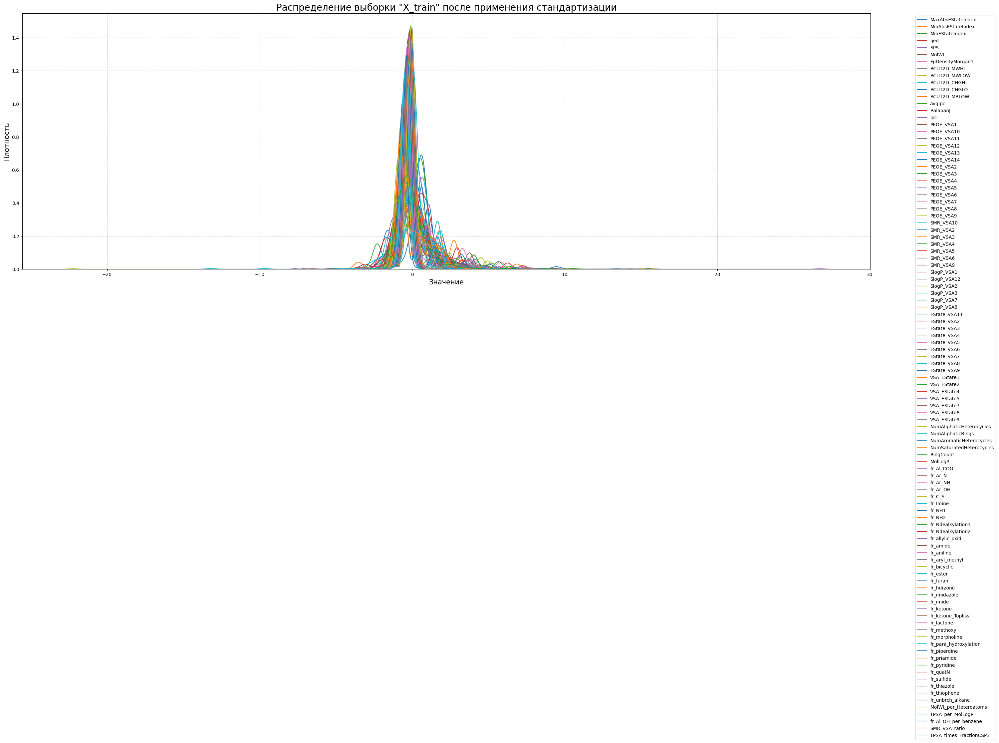

------------------------------------------------------------------------------------------------------------------------------------------------------



График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


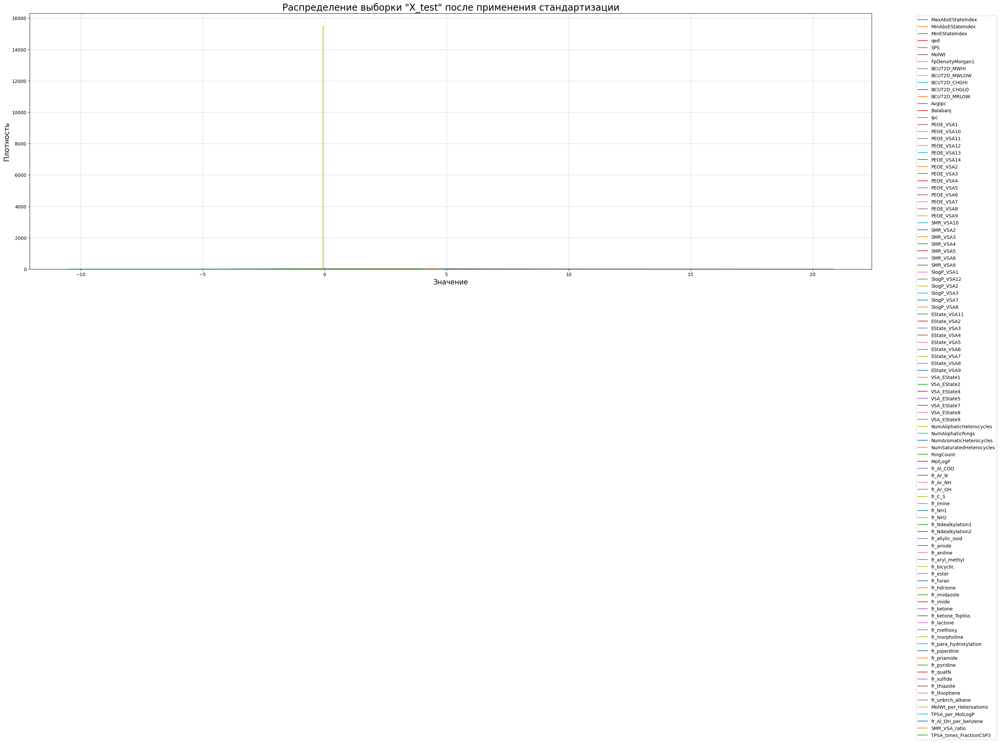

------------------------------------------------------------------------------------------------------------------------------------------------------


In [21]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_train
print()
features_distribution_plot(
    data = X_train_processed_df,
    title = 'Распределение выборки "X_train" после применения стандартизации',
    figsize = (30, 17)
)

# Добавляем отступ
print('\n\n')



# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_test
features_distribution_plot(
    data = X_test_processed_df,
    title = 'Распределение выборки "X_test" после применения стандартизации',
    figsize = (30, 17)
)

**Вывод:**

Судя по графику, после стандартизации признаки имеют нормальное распределение.

#### $1.2$

#### **Отбор самых информативных признаков.**

На данном этапе отберём только самые информативные признаки для дальнейшего решения задачи регрессии.

Производить отбор признаков будем в $4$ этапа:

1. Отберём $50$ признаков с помощью алгоритма **Mutual Information**,
2. Отберём $50$ признаков с помощью алгоритма **F-test**,
3. Отберём $50$ признаков из отобранных обоими алгоритмами,
4. Из оставшихся отберём $30$ признаков с помощью алгоритма **Lasso**.

--

**Первый этап:** Фильтрация с помощью `Mutual Information` для отбора первых $50$ признаков.

Для начала создадим функцию для визуализации важности признаков:

In [22]:
# Создаём 'bar_scores' столбчатую диаграмму важности признаков
def bar_scores(x, y, title1 = None, title2 = None, colors = None, x_title = None):
    
    # Задаём заголовок для графика
    print(title1)
    print('-' * 150)



    # Строим график
    fig = go.Figure()

    fig.add_trace(
        go.Bar(
            x = x,
            y = y,
            orientation = 'h',
        
            marker = dict(
                color = x,
                colorscale = colors,
                showscale = True
            ),
        
            text = x.round(3),
            textposition = 'auto'
        )
    )


    # Настраиваем оформление всей фигуры
    fig.update_layout(
        title = title2,
        xaxis_title = x_title,
        yaxis_title = 'Features',
        height = 700,
        width = 1200,
        template = 'plotly_white'
    )


    # Выводим график
    fig.show('png')
    print('-' * 150)

Производим фильтрацию с помощью `Mutual Information`:


Топ-50 признаков по "Mutual Information":

MolWt                      0.263859
BCUT2D_MRLOW               0.231595
BCUT2D_CHGLO               0.230381
BalabanJ                   0.223036
VSA_EState8                0.202762
MinEStateIndex             0.188813
AvgIpc                     0.179193
MaxAbsEStateIndex          0.173141
MolLogP                    0.172172
PEOE_VSA1                  0.169774
qed                        0.164883
VSA_EState7                0.163764
BCUT2D_MWLOW               0.159996
BCUT2D_CHGHI               0.159061
VSA_EState4                0.158704
SlogP_VSA2                 0.155305
SMR_VSA4                   0.148719
SMR_VSA5                   0.143898
EState_VSA8                0.141166
NumAliphaticRings          0.136116
PEOE_VSA6                  0.133168
SlogP_VSA1                 0.128361
PEOE_VSA7                  0.128189
EState_VSA2                0.126649
SlogP_VSA3                 0.124831
SMR_VSA6                   0.121699
VSA_EState5         

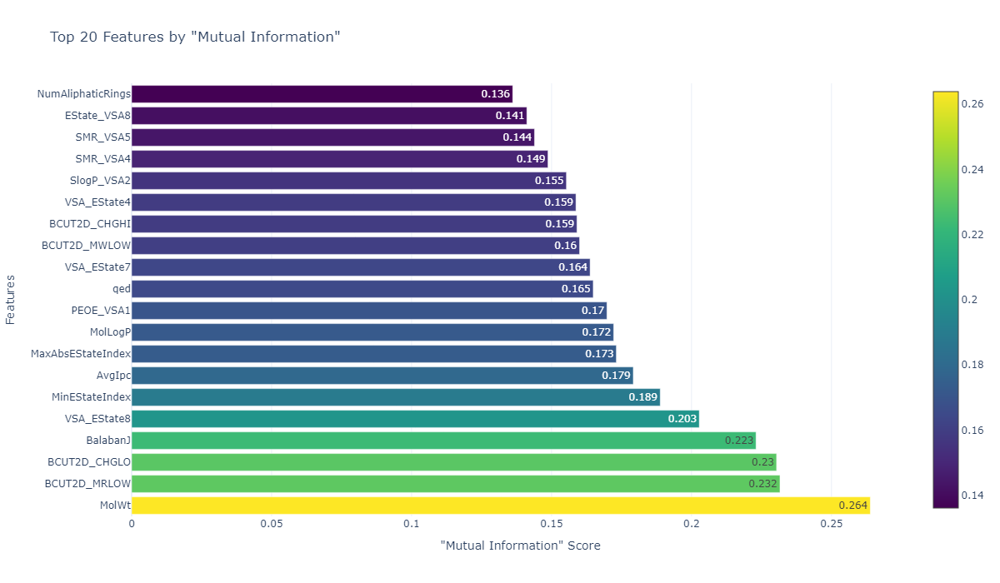

------------------------------------------------------------------------------------------------------------------------------------------------------


In [23]:
# Инициализируем класс 'SelectKBest' с алгоритмом 'mutual_info_regression'
mi_selector = feature_selection.SelectKBest(
    score_func = feature_selection.mutual_info_regression,
    k = 50
)

# Обучаем алгоритм
mi_selector.fit(X_train_processed_df, y_train)



# Из полученных результатов создадим столбец 'Series'          
mi_scores = pd.Series(
    mi_selector.scores_,
    index = X_train_processed_df.columns
).sort_values(ascending = False)



# Выделяем отобранные признаки
mi_selected_features = X_train_processed_df.columns[mi_selector.get_support()].tolist()

# Выводим результат
print(f'\nТоп-50 признаков по "Mutual Information":\n\n{mi_scores.head(50)}')
print('-' * 40)
print('\n\n')



# Посторим график оценки важности признаков при помощи функции 'bar_scores'
bar_scores(
    x = mi_scores.head(20).values,
    y = mi_scores.head(20).index,
    title1 = 'Столбчатая диаграмма отобранных признаков при помощи "Mutual Information"',
    title2 = 'Top 20 Features by "Mutual Information"',
    colors = 'Viridis',
    x_title = '"Mutual Information" Score'
)

**Второй этап:** Фильтрация признаков с помощью `F-теста` для отбора первых $50$ признаков:


Топ-50 признаков по "F-тесту"

NumSaturatedHeterocycles    63.499439
VSA_EState4                 57.480209
NumAliphaticHeterocycles    41.228948
PEOE_VSA7                   39.020895
fr_NH2                      36.012039
PEOE_VSA6                   31.365845
MinEStateIndex              30.837494
VSA_EState8                 30.783425
EState_VSA8                 30.332793
VSA_EState7                 30.257032
SMR_VSA4                    28.745647
VSA_EState1                 26.439574
EState_VSA5                 23.715476
SMR_VSA5                    22.848913
MolLogP                     20.361227
BCUT2D_MWLOW                19.286192
EState_VSA4                 18.070269
fr_C_S                      15.152422
PEOE_VSA4                   13.883261
FpDensityMorgan1            13.208926
qed                         13.010222
fr_Ndealkylation2           12.550854
NumAromaticHeterocycles     12.061025
fr_furan                    11.686032
fr_ketone_Topliss           11.370322
fr_ketone         

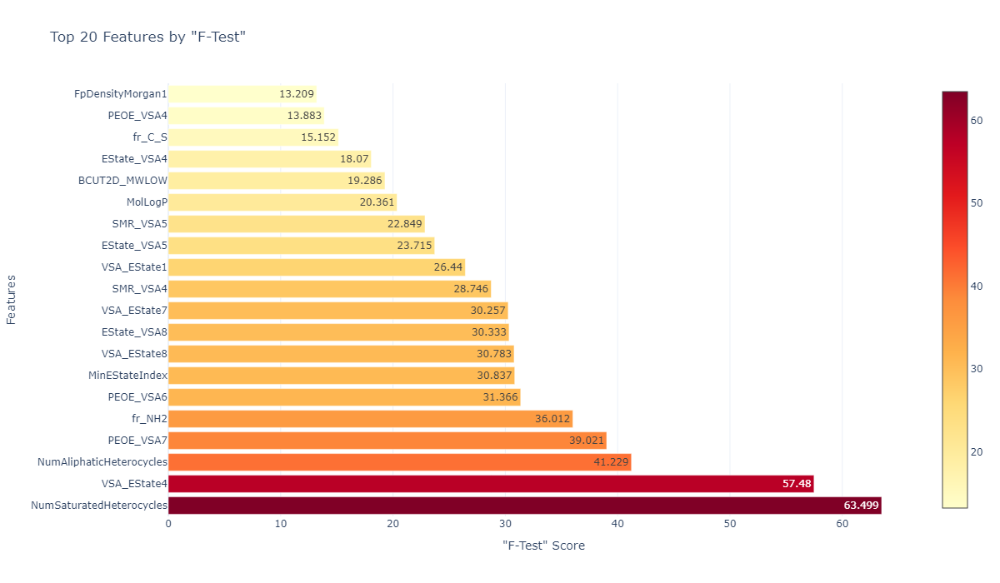

------------------------------------------------------------------------------------------------------------------------------------------------------


In [24]:
# Инициализируем класс 'SelectKBest' с алгоритмом 'f_regression'              
f_selector = feature_selection.SelectKBest(
    score_func = feature_selection.f_regression,
    k = 50
)

# Обучаем алгоритм
f_selector.fit(X_train_processed_df, y_train)



# Из полученных результатов создадим столбец 'Series'   
f_scores = pd.Series(
    f_selector.scores_,
    index = X_train_processed_df.columns
).sort_values(ascending = False)



# Выделяем отобранные признаки
f_selected_features = X_train_processed_df.columns[f_selector.get_support()].tolist()

# Выводим результат
print(f'\nТоп-50 признаков по "F-тесту"\n\n{f_scores.head(50)}')
print('-' * 40)
print('\n\n')



# Посторим график оценки важности признаков при помощи функции 'bar_scores'
bar_scores(
    x = f_scores.head(20).values,
    y = f_scores.head(20).index,
    title1 = 'Столбчатая диаграмма отобранных признаков при помощи "F-Теста"',
    title2 = 'Top 20 Features by "F-Test"',
    colors = 'YlOrRd',
    x_title = '"F-Test" Score'
)

**Третий этап:** Отбор лучших $50$ признаков из отобранных обоими алгоритмами:

In [25]:
# Пересечение признаков от "Mutual Information" и "F-теста"
common_features = list(set(mi_selected_features) & set(f_selected_features))

# Выводим результат
print(f'\nКоличество общих признаков ("Mutual Information" и "F-тест"): {len(common_features)}')
print('-' * 65)
print('\n\n')



# Если количество признаков меньше 50, дополняем из 'Mutual Information'
if len(common_features) < 50:
    additional_features = [feature for feature in mi_selected_features if feature not in common_features]
    common_features.extend(additional_features[:50 - len(common_features)])
    
# Выводим результат
print(f'Итоговые 50 признаков после фильтрации:\n\n{common_features}')
print('-' * 150)


Количество общих признаков ("Mutual Information" и "F-тест"): 25
-----------------------------------------------------------------



Итоговые 50 признаков после фильтрации:

['VSA_EState4', 'MinEStateIndex', 'BCUT2D_MRLOW', 'SMR_VSA5', 'EState_VSA2', 'VSA_EState1', 'fr_bicyclic', 'BCUT2D_CHGLO', 'MolWt', 'NumAliphaticRings', 'PEOE_VSA6', 'EState_VSA5', 'EState_VSA4', 'VSA_EState7', 'PEOE_VSA14', 'FpDensityMorgan1', 'EState_VSA8', 'BCUT2D_MWLOW', 'VSA_EState8', 'PEOE_VSA9', 'MaxAbsEStateIndex', 'SMR_VSA4', 'PEOE_VSA7', 'qed', 'MolLogP', 'SPS', 'BCUT2D_MWHI', 'BCUT2D_CHGHI', 'AvgIpc', 'BalabanJ', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA12', 'PEOE_VSA2', 'PEOE_VSA8', 'SMR_VSA10', 'SMR_VSA3', 'SMR_VSA6', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA3', 'EState_VSA3', 'EState_VSA6', 'EState_VSA9', 'VSA_EState2', 'VSA_EState5', 'RingCount', 'TPSA_per_MolLogP', 'SMR_VSA_ratio', 'TPSA_times_FractionCSP3']
--------------------------------------------------------------------------------------------------

Сохраняем отобранные признаки в выборках:

In [26]:
# Сокращаем признаки в тренировочной и тестовой выборках до 50 отобранных
X_train_filtered = X_train_processed_df[common_features]
X_test_filtered = X_test_processed_df[common_features]



# Выведем результаты
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_filtered,
    data_name = 'X_train_filtered',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_filtered,
    data_name = 'X_test_filtered',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_filtered" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 50.
----------------------------------------


,VSA_EState4,MinEStateIndex,BCUT2D_MRLOW,SMR_VSA5,EState_VSA2,VSA_EState1,fr_bicyclic,BCUT2D_CHGLO,MolWt,NumAliphaticRings,...,SlogP_VSA3,EState_VSA3,EState_VSA6,EState_VSA9,VSA_EState2,VSA_EState5,RingCount,TPSA_per_MolLogP,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,2.503470,0.771519,1.094114,-0.054649,-0.642902,-0.510177,0.329319,0.065107,-0.172284,-0.123882,...,-1.068602,-0.791905,-0.864386,0.703425,-0.731273,0.875327,0.180211,-0.017568,-0.806000,-0.332149
1,0.014302,-0.394927,-0.132690,-0.966737,-0.612792,-0.228040,1.013507,0.892106,-0.694608,-0.123882,...,0.254254,0.381094,1.790326,0.042850,0.683650,-0.723162,0.180211,0.133615,-0.806000,-0.857136
2,-0.834664,0.392277,-1.317070,0.752115,1.659867,-0.483553,-0.354869,-0.995268,-0.034503,-0.123882,...,0.129488,0.092873,0.083050,-0.479599,0.581600,0.320846,-0.452278,0.146636,0.736551,1.215385
3,1.851472,0.750903,-0.265867,0.756481,-0.632769,-0.823985,-1.039057,-1.885697,-1.145565,1.344428,...,-1.068602,-0.791905,-0.864386,-0.369657,-1.092745,1.075515,0.180211,-0.019390,-0.806000,-0.065901
4,-0.370231,0.472459,0.266289,0.149113,0.774582,-0.068435,-0.354869,-0.577835,-0.264281,-0.858037,...,-1.068602,-1.164993,-0.421934,-1.002048,-0.768015,-0.077143,-0.452278,0.009951,0.207477,-0.043975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,0.271046,0.428609,-0.295874,-0.054649,-0.154825,-0.542370,0.329319,0.062237,-0.241286,-0.123882,...,0.129488,0.114232,-0.421230,0.071034,0.099133,0.172446,-0.452278,-0.010548,0.211154,-0.300668
719,1.202870,0.843749,0.140106,0.983472,-1.085657,-0.524807,1.013507,-1.290042,-0.010688,0.610273,...,1.014571,-0.011078,-0.052843,-0.479599,-0.899965,0.530838,0.180211,-0.085575,-0.300500,-0.744117
720,0.280488,0.198692,-0.232253,-0.795632,0.319731,-0.541832,-0.354869,0.536522,0.463493,-0.123882,...,-0.465932,-0.722604,0.019495,0.083057,0.650119,0.166710,0.812701,0.086950,-0.806000,-0.622234
721,-1.533837,-0.499596,0.531099,-1.391050,-0.160658,2.477075,-0.354869,1.400336,0.285924,-1.592192,...,-0.473182,-0.350889,-0.864386,0.530036,0.705109,-2.182500,-0.452278,0.134657,-0.806000,-0.643005


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_filtered" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 50.
----------------------------------------


,VSA_EState4,MinEStateIndex,BCUT2D_MRLOW,SMR_VSA5,EState_VSA2,VSA_EState1,fr_bicyclic,BCUT2D_CHGLO,MolWt,NumAliphaticRings,...,SlogP_VSA3,EState_VSA3,EState_VSA6,EState_VSA9,VSA_EState2,VSA_EState5,RingCount,TPSA_per_MolLogP,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,-1.070186,-0.302029,-1.365982,-1.218918,-0.191636,-0.196948,-0.354869,2.808560,-0.863532,-1.592192,...,0.288896,-0.853886,-0.864386,-1.002048,0.680807,-0.355714,-1.084768,-1.198955,0.168554,-0.016665
1,0.072302,-2.184035,-0.312065,-0.953746,0.740576,1.861870,-1.039057,1.717081,-0.089109,-1.592192,...,-0.292246,-0.773137,-0.864386,0.345513,-1.092745,-0.134131,-1.084768,0.128426,1.068112,-0.717143
2,-1.001606,0.108325,-1.412236,0.523061,0.378423,-0.215910,-0.354869,-0.808107,-0.471906,-0.123882,...,-0.473182,0.082011,-0.421934,0.007587,-0.360243,0.318123,-0.452278,0.213022,1.241226,1.433804
3,0.251347,-1.212053,0.805772,1.275313,-0.642902,0.821808,0.329319,0.061560,0.854706,-0.123882,...,2.891055,2.355336,-0.864386,1.068921,-0.738469,0.292743,-0.452278,0.094904,1.152177,1.983047
4,0.932722,0.862116,1.093239,2.567789,-1.085657,-0.823985,1.697695,0.059434,0.426860,1.344428,...,-1.068602,0.327360,-0.031220,0.099219,-0.357125,0.653392,0.180211,-0.076881,-0.806000,-0.190647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,1.288017,0.899797,1.509991,-0.100876,-1.085657,-0.823985,0.329319,0.675382,-1.667184,-0.123882,...,-1.068602,-0.748715,-0.864386,-0.369657,-1.092745,1.076714,-1.084768,0.065149,-0.806000,-0.065901
177,1.781502,0.434776,0.691163,-0.928795,-0.135646,-0.754509,-0.354869,1.409520,-0.103926,-0.858037,...,-1.068602,0.021690,0.083050,-1.002048,0.152801,0.085952,0.180211,0.100585,-0.806000,-0.833169
178,-0.127502,0.409685,0.698000,-1.172573,-0.131675,-0.135080,-0.354869,1.493611,-0.073419,-1.592192,...,-0.245931,0.150979,0.020518,0.007587,0.121094,0.432689,0.180211,0.099420,-0.806000,-0.842731
179,-0.465348,0.028994,-0.587122,0.298145,-0.102694,0.380878,-0.354869,-0.836497,0.057249,-0.123882,...,-0.473182,0.908194,0.691279,1.087747,-1.092745,0.531638,-0.452278,0.247098,-0.806000,0.764520


------------------------------------------------------------------------------------------------------------------------------------------------------


**Четвёртый этап**: Применение `LASSO` для выбора $30$ признаков:


Топ-30 финальных признаков после "LASSO"

BCUT2D_CHGLO               0.369693
RingCount                  0.363390
PEOE_VSA12                 0.350917
EState_VSA4                0.343725
VSA_EState4                0.309532
SPS                        0.302785
VSA_EState5                0.295219
PEOE_VSA8                  0.260465
PEOE_VSA14                 0.258891
SMR_VSA4                   0.256637
SlogP_VSA1                 0.254742
PEOE_VSA7                  0.249875
PEOE_VSA9                  0.240992
EState_VSA5                0.240506
PEOE_VSA1                  0.218263
EState_VSA2                0.199830
SMR_VSA10                  0.189934
VSA_EState2                0.171082
VSA_EState8                0.152290
PEOE_VSA2                  0.149969
VSA_EState1                0.142065
EState_VSA9                0.130803
EState_VSA6                0.130794
qed                        0.124830
BCUT2D_MWLOW               0.123255
TPSA_times_FractionCSP3    0.114559
SlogP_VSA3           

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:486: UserWarning:

X has feature names, but SelectFromModel was fitted without feature names



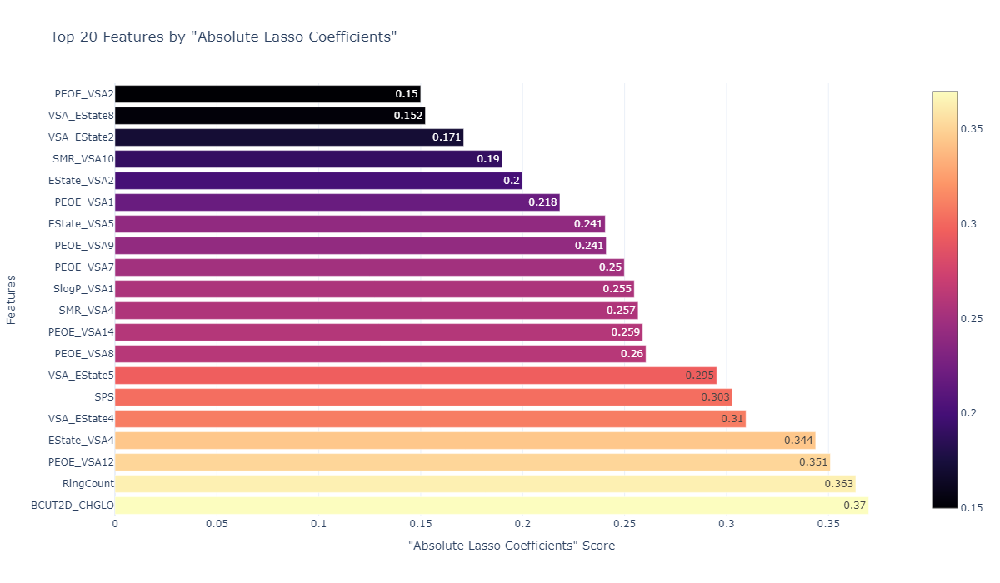

------------------------------------------------------------------------------------------------------------------------------------------------------


In [27]:
# Инициализируем класс 'Lasso'
lasso = linear_model.Lasso(
    alpha = 0.01,
    random_state = 42
)

# Обучаем алгоритм
lasso.fit(X_train_filtered, y_train)



# Из полученных результатов создадим столбец 'Series'  
lasso_scores = pd.Series(
    lasso.coef_,
    index = X_train_filtered.columns
).abs().sort_values(ascending = False)



# Выделяем 30 наиболее важных признаков
lasso_selector = feature_selection.SelectFromModel(
    lasso,
    prefit = True,
    max_features = 30
)



# Из отобранных 30 признаков формируем итоговый DataFrame
# после чего сохраним итоговые признаки в список
X_train_final = lasso_selector.transform(X_train_filtered)
final_features = X_train_filtered.columns[lasso_selector.get_support()].tolist()

# Преобразование X_train_final в DataFrame
X_train_final = pd.DataFrame(
    X_train_final, 
    columns = final_features,
    index = X_train.index
)

# Применение отобранных признаков к тестовой выборке
X_test_final = X_test_filtered[final_features]



# Выводим результат
print(f'\nТоп-30 финальных признаков после "LASSO"\n\n{lasso_scores.head(50)}')
print('-' * 40)
print('\n\n')



# Посторим график оценки важности признаков при помощи функции 'bar_scores'
bar_scores(
    x = lasso_scores.head(20).values,
    y = lasso_scores.head(20).index,
    title1 = 'Столбчатая диаграмма отобранных признаков при помощи "Lasso"',
    title2 = 'Top 20 Features by "Absolute Lasso Coefficients"',
    colors = 'Magma',
    x_title = '"Absolute Lasso Coefficients" Score'
)

Выведем информацию итоговых выборок:

In [28]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_final,
    data_name = 'X_train_final',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_final,
    data_name = 'X_test_final',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_final" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 30.
----------------------------------------


,VSA_EState4,BCUT2D_MRLOW,EState_VSA2,VSA_EState1,BCUT2D_CHGLO,EState_VSA5,EState_VSA4,PEOE_VSA14,BCUT2D_MWLOW,VSA_EState8,...,PEOE_VSA8,SMR_VSA10,SlogP_VSA1,SlogP_VSA3,EState_VSA6,EState_VSA9,VSA_EState2,VSA_EState5,RingCount,TPSA_times_FractionCSP3
0,2.503470,1.094114,-0.642902,-0.510177,0.065107,-0.034495,1.012479,-0.483436,-0.231601,0.340090,...,-0.021284,0.106999,0.660333,-1.068602,-0.864386,0.703425,-0.731273,0.875327,0.180211,-0.332149
1,0.014302,-0.132690,-0.612792,-0.228040,0.892106,-0.910332,-1.063253,1.176897,0.425592,-0.608620,...,-1.513317,-0.287725,-0.224524,0.254254,1.790326,0.042850,0.683650,-0.723162,0.180211,-0.857136
2,-0.834664,-1.317070,1.659867,-0.483553,-0.995268,-0.088791,0.237265,0.222856,-0.313054,0.101432,...,1.658586,0.488749,-0.135027,0.129488,0.083050,-0.479599,0.581600,0.320846,-0.452278,1.215385
3,1.851472,-0.265867,-0.632769,-0.823985,-1.885697,1.211398,-0.209812,-0.483436,-0.967502,-0.097231,...,-1.021808,-1.157446,-0.070691,-1.068602,-0.864386,-0.369657,-1.092745,1.075515,0.180211,-0.065901
4,-0.370231,0.266289,0.774582,-0.068435,-0.577835,0.197581,1.428540,-0.483436,-0.403346,0.375166,...,-0.932554,0.817315,-0.135027,-1.068602,-0.421934,-1.002048,-0.768015,-0.077143,-0.452278,-0.043975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,0.271046,-0.295874,-0.154825,-0.542370,0.062237,0.252332,-0.199418,0.359596,-0.231089,0.481124,...,0.013202,0.156622,-0.955548,0.129488,-0.421230,0.071034,0.099133,0.172446,-0.452278,-0.300668
719,1.202870,0.140106,-1.085657,-0.524807,-1.290042,1.176775,0.803055,-0.483436,-0.749877,1.736961,...,0.228973,-1.157446,-0.955548,1.014571,-0.052843,-0.479599,-0.899965,0.530838,0.180211,-0.744117
720,0.280488,-0.232253,0.319731,-0.541832,0.536522,-0.656068,1.329183,-0.483436,0.434471,-0.936206,...,-0.943551,1.757702,0.595997,-0.465932,0.019495,0.083057,0.650119,0.166710,0.812701,-0.622234
721,-1.533837,0.531099,-0.160658,2.477075,1.400336,0.620040,-0.954993,0.359596,0.607120,-0.936206,...,-1.019632,0.096054,1.344306,-0.473182,-0.864386,0.530036,0.705109,-2.182500,-0.452278,-0.643005


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_final" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 30.
----------------------------------------


,VSA_EState4,BCUT2D_MRLOW,EState_VSA2,VSA_EState1,BCUT2D_CHGLO,EState_VSA5,EState_VSA4,PEOE_VSA14,BCUT2D_MWLOW,VSA_EState8,...,PEOE_VSA8,SMR_VSA10,SlogP_VSA1,SlogP_VSA3,EState_VSA6,EState_VSA9,VSA_EState2,VSA_EState5,RingCount,TPSA_times_FractionCSP3
0,-1.070186,-1.365982,-0.191636,-0.196948,2.808560,-0.615020,-1.452750,1.123331,2.296748,-0.936206,...,-0.958198,0.499853,-0.097606,0.288896,-0.864386,-1.002048,0.680807,-0.355714,-1.084768,-0.016665
1,0.072302,-0.312065,0.740576,1.861870,1.717081,0.562000,-1.028044,0.388829,1.154219,-0.673554,...,-1.008634,0.968608,0.702317,-0.292246,-0.864386,0.345513,-1.092745,-0.134131,-1.084768,-0.717143
2,-1.001606,-1.412236,0.378423,-0.215910,-0.808107,-0.623961,-0.104185,0.347574,-0.265352,-0.224349,...,-0.418413,-0.722000,-0.955548,-0.473182,-0.421934,0.007587,-0.360243,0.318123,-0.452278,1.433804
3,0.251347,0.805772,-0.642902,0.821808,0.061560,-0.034495,0.708760,0.589297,-0.231089,1.559249,...,0.054797,-0.172658,-0.955548,2.891055,-0.864386,1.068921,-0.738469,0.292743,-0.452278,1.983047
4,0.932722,1.093239,-1.085657,-0.823985,0.059434,2.726919,0.292272,-0.483436,-0.231368,2.072285,...,1.622910,-0.312085,-0.955548,-1.068602,-0.031220,0.099219,-0.357125,0.653392,0.180211,-0.190647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,1.288017,1.509991,-1.085657,-0.823985,0.675382,0.302085,-0.209812,-0.483436,0.127272,-0.552634,...,-0.977181,-1.157446,-0.070691,-1.068602,-0.864386,-0.369657,-1.092745,1.076714,-1.084768,-0.065901
177,1.781502,0.691163,-0.135646,-0.754509,1.409520,-0.689321,-0.275581,0.350822,0.884829,-0.267836,...,-0.481319,0.976483,-0.118205,-1.068602,0.083050,-1.002048,0.152801,0.085952,0.180211,-0.833169
178,-0.127502,0.698000,-0.131675,-0.135080,1.493611,-0.614671,-0.277778,-0.483436,1.260989,-0.760104,...,-1.513317,0.536398,0.595997,-0.245931,0.020518,0.007587,0.121094,0.432689,0.180211,-0.842731
179,-0.465348,-0.587122,-0.102694,0.380878,-0.836497,-0.910332,-0.673080,-0.483436,-0.226828,-0.281073,...,-0.418413,-1.157446,1.237523,-0.473182,0.691279,1.087747,-1.092745,0.531638,-0.452278,0.764520


------------------------------------------------------------------------------------------------------------------------------------------------------


**Корреляционный анализ.** 

Создаём функцию для построения тепловой карты корреляции признаков:

In [29]:
# Создаём функцию 'heatmap_corr()' для построения тепловой карты корреляции
def heatmap_corr(data):
    
    # Вычисляем корреляционную матрицу
    correlation_matrix = data.corr()

    # Создаём заголовок для графика
    print('\nТепловая карта корреляции отобранных признаков:')
    print('-' * 150)



    # Создаём тепловую карту
    fig = go.Figure(data = go.Heatmap(
        z = correlation_matrix.values,
        x = correlation_matrix.columns,
        y = correlation_matrix.index,
        colorscale = 'RdBu',
        zmin = -1,
        zmax = 1,
        text = correlation_matrix.values.round(2),  
        texttemplate = "%{text}",  
        hoverinfo = 'z'
    ))



    # Настройка макета
    fig.update_layout(
        title = 'Значения корреляции отобранных признаков',
        width = 1200,
        height = 1200,
        title_x = 0.5,
        xaxis_tickangle = -45
    )

    # Отображение графика
    fig.show('png')
    print('-' * 150)

Проверим корреляцию отобранных признаков:


Тепловая карта корреляции отобранных признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


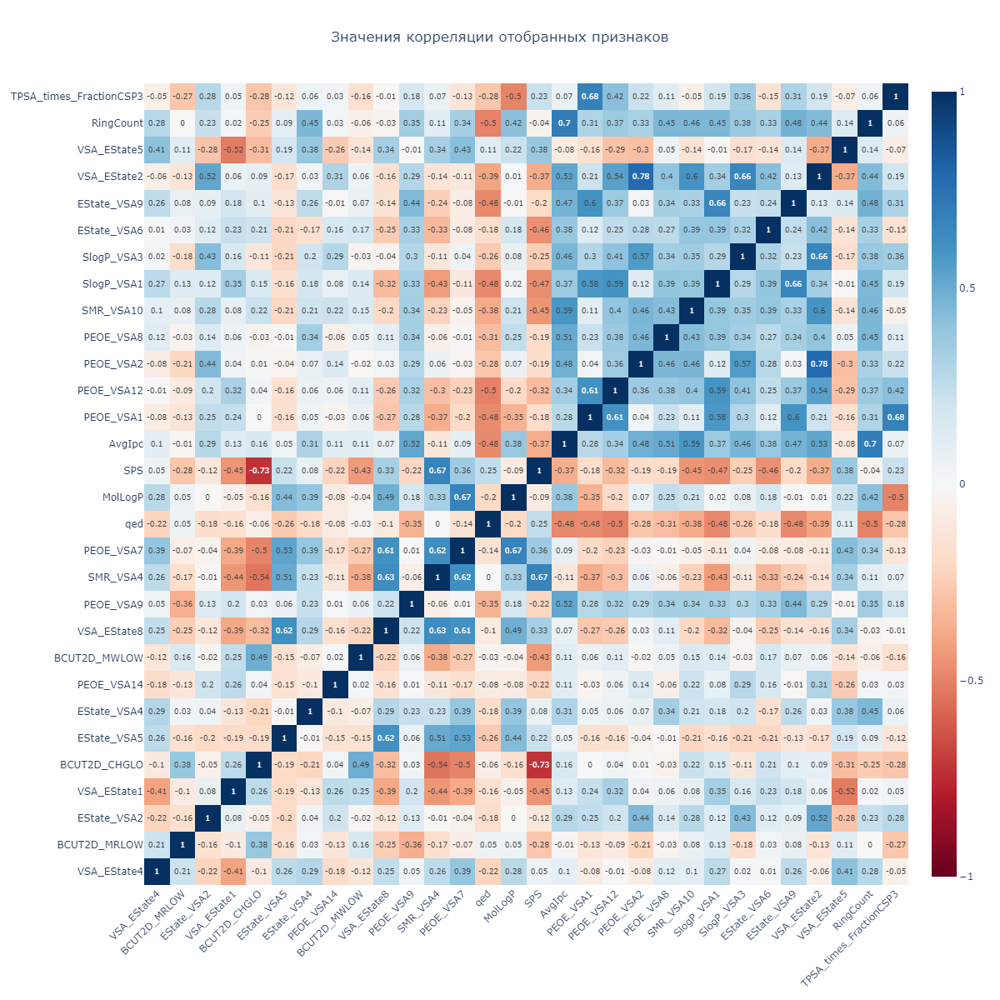

------------------------------------------------------------------------------------------------------------------------------------------------------


In [30]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(data = X_train_final)

**Вывод:**

Из полученной тепловой карты видно, что значения корреляций находятся в пределах $+-0.78$, следовательно высококоррелированные связи отсутствуют. Данные полностью готовы к использованию для обучения модели.

#### $1.3$

#### **Linear Regression (Линейная регрессия)**

Построим модель полиномиальной регрессии второй степени на обучающем наборе. Все параметры оставим по умолчанию:

In [31]:
# Создаём генератор полиномиальных признаков PolynomialFeatures() и обучим её
poly_features = preprocessing.PolynomialFeatures(
    degree = 2,
    include_bias = False
)

poly_features.fit(X_train_final)



# Генерируем полиномиальные признаки на тренировочной и тестовой наборках данных
X_train_poly = poly_features.transform(X_train_final)
X_test_poly = poly_features.transform(X_test_final)



# Создаём объект класса LinearRegression() и обучим её
LR_model_poly = linear_model.LinearRegression()
LR_model_poly.fit(X_train_poly, y_train)

# Делаем предсказания на тестовой выборке
y_lr_predict = LR_model_poly.predict(X_test_poly)



# Считаем метрики
print_metrics(y_test, y_lr_predict, 'LinearRegression')


LinearRegression (значения метрик):

Mean Squared Error: 48.894
-----------------------------------
Root Mean Squared Error: 6.992
-----------------------------------
Mean Absolute Error: 3.526
-----------------------------------
R²: -15.762
-----------------------------------
Mean Absolute Percentage Error: 126.344%
----------------------------------------


#### $1.4$

#### **Ridge (Полиномиальная регрессия)**

Построим модель полиномиальной регрессии второй степени с $L_2$-регуляризацией (регуляризацией Тихонова) на обучающем наборе. Коэффициент регуляризации вычислим с помощью `GridSearchCV()`, остальные параметры оставим по умолчанию:

In [32]:
# Создаём объекта класса линейной регрессии с L2-регуляризацией
LR_model_ridge = linear_model.Ridge()


# Определение пространства поиска гиперпараметров
param_grid = {
    'alpha': [0.1, 1.0, 10.0, 100.0]
}



# Выполнение перебора гиперпараметров с помощью GridSearchCV
grid_search = model_selection.GridSearchCV(
    estimator = LR_model_ridge,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)

# Обучаем модель 
grid_search.fit(X_train_poly, y_train)

# Сохраняем лучшие параметры
best_ridge_model = grid_search.best_estimator_

# Делаем предсказание для тестовой выборки
y_ridge_predict = best_ridge_model.predict(X_test_poly)



# Сохраним полученные гиперпараметры в переменной
best_ridge_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_ridge_parameters}')

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Наилучшие значения гиперпараметров: {'alpha': 100.0}


Считаем метрики:

In [33]:
# Применяем функцию 'print_metrics'            
print_metrics(y_test, y_ridge_predict, 'Ridge')


Ridge (значения метрик):

Mean Squared Error: 2.433
-----------------------------------
Root Mean Squared Error: 1.560
-----------------------------------
Mean Absolute Error: 1.207
-----------------------------------
R²: 0.166
-----------------------------------
Mean Absolute Percentage Error: 52.302%
----------------------------------------


#### $1.5$

#### **SVR — Support Vector Regression (Метод опорных векторов)**

Перед обучением организуем перебор при помощи **GridSearchCV()**:

In [34]:
# Создаем объект класса SVR()
SVR_model = svm.SVR()


# Определение параметров для поиска
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.01, 0.1, 0.5],
    'kernel': ['rbf', 'linear']
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = SVR_model,
    param_grid = param_grid,
    cv = 5,
    scoring = 'neg_mean_squared_error'
)



# Обучаем модель 
grid_search.fit(X_train_final, y_train)

# Сохраняем лучшие параметры
best_svr_model = grid_search.best_estimator_

# Делаем предсказание для тестовой выборки
y_svr_predict = best_svr_model.predict(X_test_final)



# Сохраним полученные гиперпараметры в переменной
best_svr_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_svr_parameters}')

Наилучшие значения гиперпараметров: {'C': 1, 'epsilon': 0.1, 'kernel': 'rbf'}


Считаем метрики:

In [35]:
# Применяем функцию 'print_metrics'            
print_metrics(y_test, y_svr_predict, 'SupportVectorRegression')


SupportVectorRegression (значения метрик):

Mean Squared Error: 2.310
-----------------------------------
Root Mean Squared Error: 1.520
-----------------------------------
Mean Absolute Error: 1.204
-----------------------------------
R²: 0.208
-----------------------------------
Mean Absolute Percentage Error: 52.610%
----------------------------------------


#### $1.6$

#### **Random Forest Regression (Случайный лес)**

Перед обучением организуем перебор при помощи **GridSearchCV()**:

In [36]:
# Создаем объект класса RandomForestRegressor()
RF_Regression = ensemble.RandomForestRegressor(random_state = 42)


# Определение параметров для поиска
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = RF_Regression,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)



# Обучаем модель 
grid_search.fit(X_train_final, y_train)

# Сохраняем лучшие параметры
best_model = grid_search.best_estimator_

# Делаем предсказание для тестовой выборки
y_rfr_predict = best_model.predict(X_test_final)



# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 3 folds for each of 360 candidates, totalling 1080 fits
Наилучшие значения гиперпараметров: {'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


Считаем метрики:

In [37]:
# Применяем функцию 'print_metrics'            
print_metrics(y_test, y_rfr_predict, 'RandomForestRegressor')


RandomForestRegressor (значения метрик):

Mean Squared Error: 1.984
-----------------------------------
Root Mean Squared Error: 1.409
-----------------------------------
Mean Absolute Error: 1.154
-----------------------------------
R²: 0.320
-----------------------------------
Mean Absolute Percentage Error: 45.325%
----------------------------------------


#### $1.7$

#### **XGBoost (Градиентный бустинг)**

Построим модель `XGBRegressor()` на тренировочной выборке.

Оптимизируем гиперпараметры при поиощи **Optuna**:

In [38]:
# Фиксируем значение random_state
random_state = 42



# Создаём функцию для оптимизации гиперпараметров
def objective_xgb(trial):
    
    # Задаем пространства поиска гиперпараметров
    params = {
        'booster': trial.suggest_categorical('booster', ['gbtree', 'gblinear', 'dart']),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log = True),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 15),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 500, 1000),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 1),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.4, 1.5),
        'objective': 'reg:squarederror',
        'verbosity': 0
    }
    
    
    # Cоздаем модель и обучаем её
    XGB_Regressor = XGBRegressor(**params)
    XGB_Regressor.fit(X_train_final, y_train)
    
    # Делаем предсказание для обучающей и валидационной выборок
    y_xgb_predict = XGB_Regressor.predict(X_test_final)
    
    # Рассчитываем метрику R²
    r2_metric = metrics.r2_score(y_test, y_xgb_predict)
    
    return r2_metric

Обучаем алгоритм `optuna`:

In [39]:
# Cоздаем объект исследования
study = optuna.create_study(
    study_name = 'XGBRegressor',
    direction = 'minimize'
)


# Ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(objective_xgb, n_trials = 100)

# Сохраним полученные гиперпараметры в переменной
best_parameters = study.best_params


# Выводим результаты на валидационной выборке
print('R² на валидационной выборке: {:.2f}'.format(study.best_value))
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

[I 2025-06-18 11:56:51,284] A new study created in memory with name: XGBRegressor
[I 2025-06-18 11:56:52,614] Trial 0 finished with value: 0.048953114324721714 and parameters: {'booster': 'gblinear', 'learning_rate': 0.2744046249130071, 'max_depth': 9, 'min_child_weight': 6, 'subsample': 0.6273683120337412, 'colsample_bytree': 0.7393959812556767, 'n_estimators': 881, 'reg_alpha': 0.05228177734943473, 'reg_lambda': 1.0748132334047424}. Best is trial 0 with value: 0.048953114324721714.
[I 2025-06-18 11:56:52,875] Trial 1 finished with value: -0.013610668682217497 and parameters: {'booster': 'gblinear', 'learning_rate': 0.1148824348882162, 'max_depth': 4, 'min_child_weight': 14, 'subsample': 0.6356311179009759, 'colsample_bytree': 0.6804265899055372, 'n_estimators': 779, 'reg_alpha': 0.391582445831983, 'reg_lambda': 0.7597323133466584}. Best is trial 1 with value: -0.013610668682217497.
[I 2025-06-18 11:56:53,768] Trial 2 finished with value: 0.18955095868143323 and parameters: {'booster'

R² на валидационной выборке: -0.02
Наилучшие значения гиперпараметров: {'booster': 'gblinear', 'learning_rate': 0.21926954934424148, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.8487669961299419, 'colsample_bytree': 0.8135375005234528, 'n_estimators': 713, 'reg_alpha': 0.7971033508712034, 'reg_lambda': 0.567616865590601}


Создадим функцию для построения визуализаций:

In [40]:
# Создаём функцию 'optuna_visualization' для визуализации результатов optuna
def optuna_visualization(fig, title1 = None, title2 = None, x_title = None, y_title = None, params = None):
    
    # Здадём заголовок для графика
    print()
    print(title1)
    print('-' * 150)
    print()
    
    
    # Построение графика
    fig = fig
    
    
    # Настройка параметров графика
    fig.update_layout(
        title = title2,
        xaxis_title = x_title,
        yaxis_title = y_title,
        width = 1500,
        height = 700,
        
        coloraxis_colorbar = dict(
            title = 'Objective Value (↓)',
            titleside = 'right'
        ),
        
        font = dict(size = 14)
    )
    
    
    # Отображаем график
    fig.show('png')
    print('-' * 150)
    print('\n\n')

Построим визуализации:


Точечная диаграмма зависимости целевой функции от итераций:
------------------------------------------------------------------------------------------------------------------------------------------------------



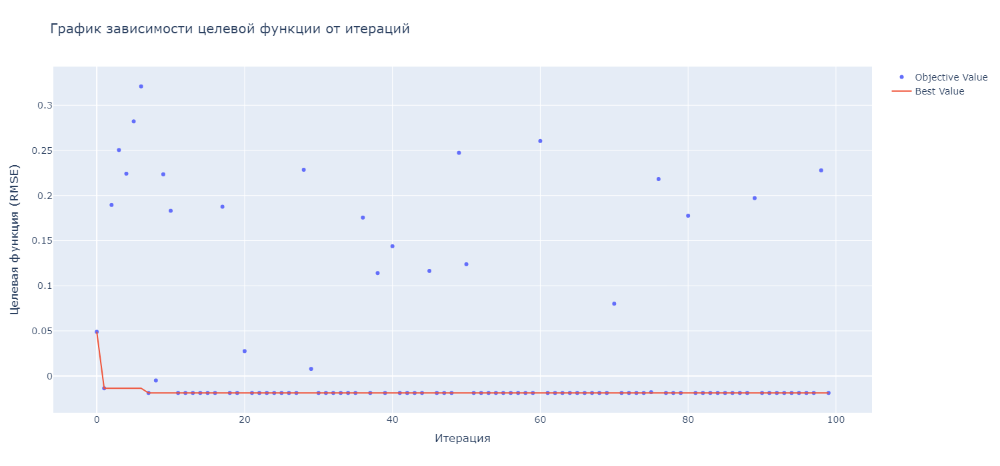

------------------------------------------------------------------------------------------------------------------------------------------------------




Столбчатая диаграмма важности гиперпараметров:
------------------------------------------------------------------------------------------------------------------------------------------------------



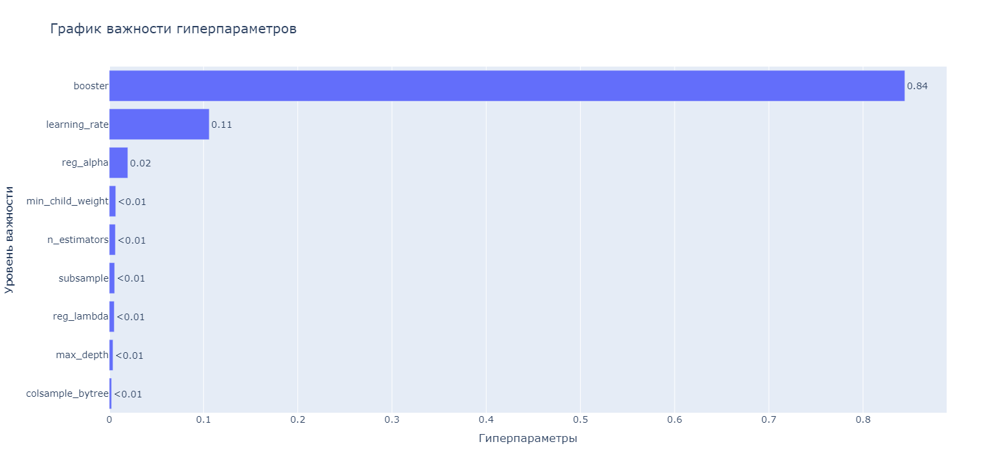

------------------------------------------------------------------------------------------------------------------------------------------------------




График сходимости по параметрам "n_estimators" и "min_child_weight":
------------------------------------------------------------------------------------------------------------------------------------------------------



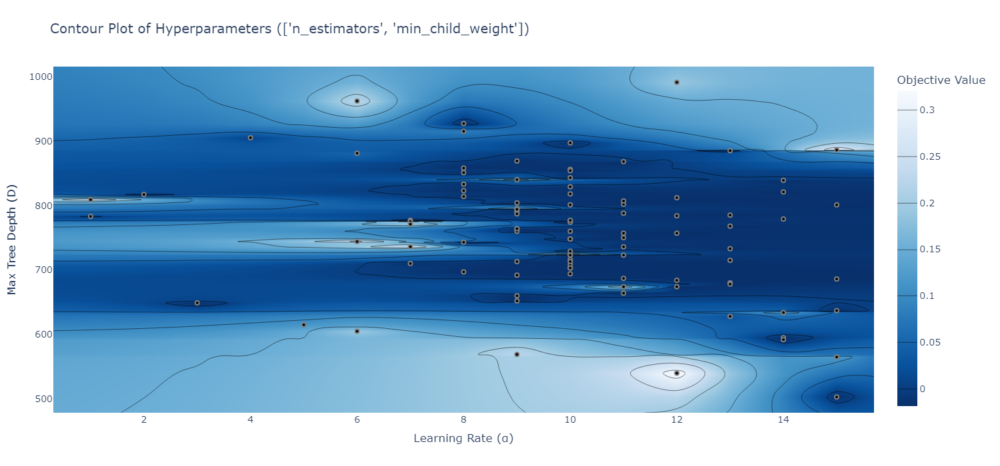

------------------------------------------------------------------------------------------------------------------------------------------------------




График сходимости по параметрам "n_estimators" и "learning_rate":
------------------------------------------------------------------------------------------------------------------------------------------------------



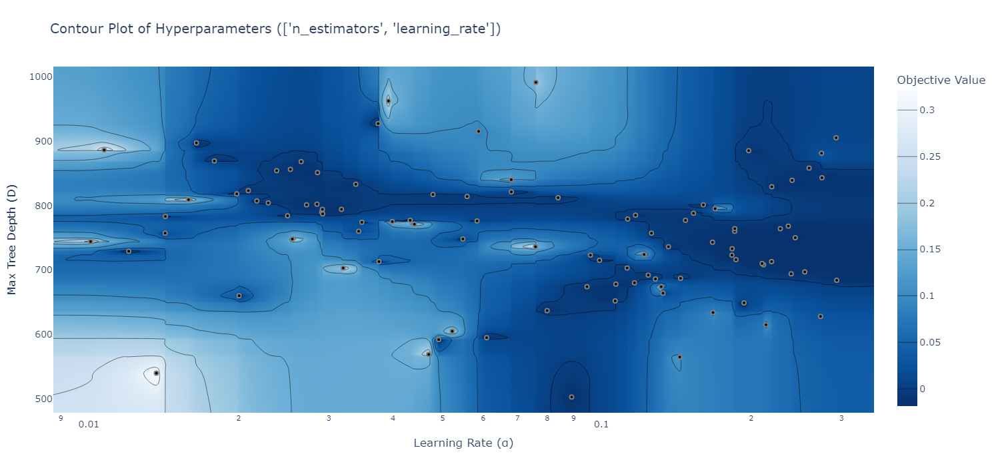

------------------------------------------------------------------------------------------------------------------------------------------------------




График сходимости по параметрам "n_estimators" и "reg_lambda":
------------------------------------------------------------------------------------------------------------------------------------------------------



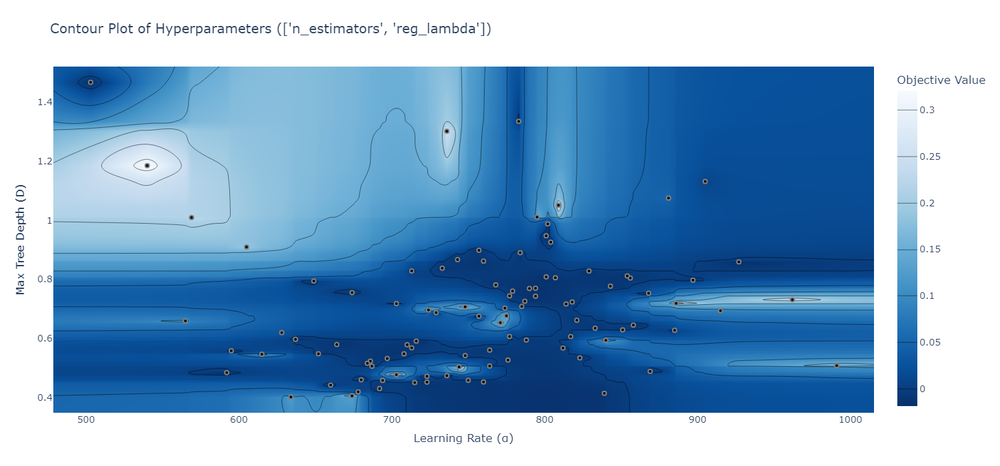

------------------------------------------------------------------------------------------------------------------------------------------------------




График сходимости по параметрам "max_depth" и "learning_rate":
------------------------------------------------------------------------------------------------------------------------------------------------------



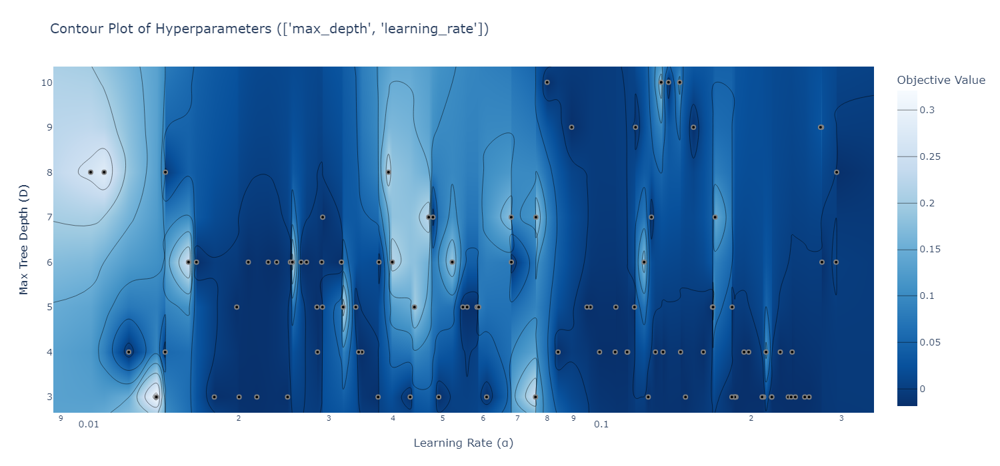

------------------------------------------------------------------------------------------------------------------------------------------------------




График вклада гиперпараметров "max_depth", "learning_rate" и "n_estimators" в целевую метрику на плоскости:
------------------------------------------------------------------------------------------------------------------------------------------------------



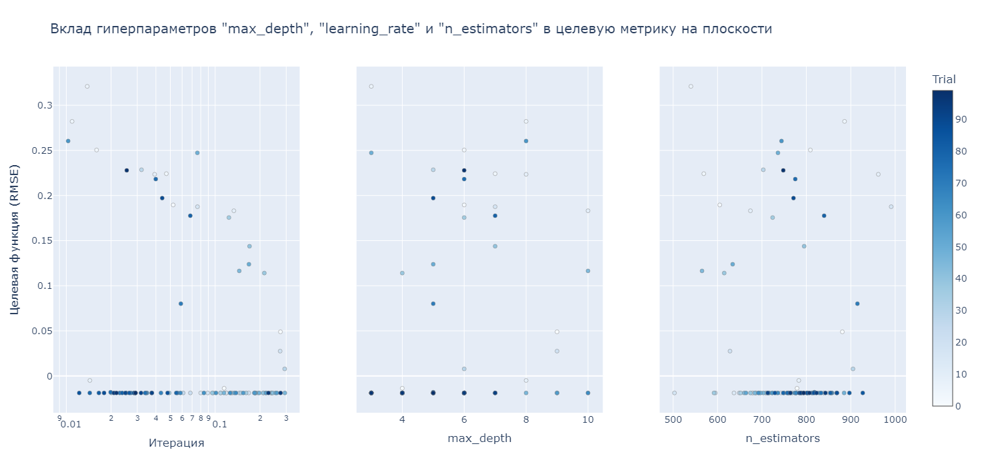

------------------------------------------------------------------------------------------------------------------------------------------------------




График вклада всех гиперпараметров в целевую метрику на плоскости:
------------------------------------------------------------------------------------------------------------------------------------------------------



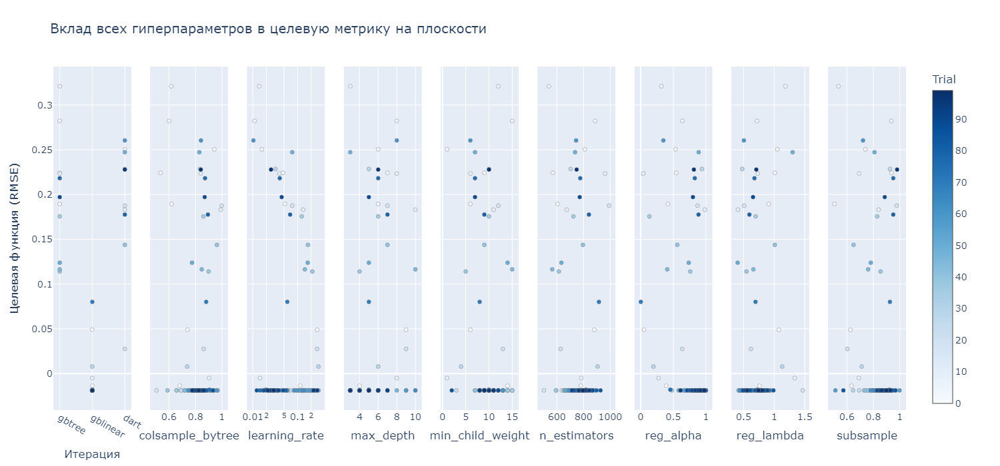

------------------------------------------------------------------------------------------------------------------------------------------------------




Контурный график взаимодействия гиперпараметров:
------------------------------------------------------------------------------------------------------------------------------------------------------



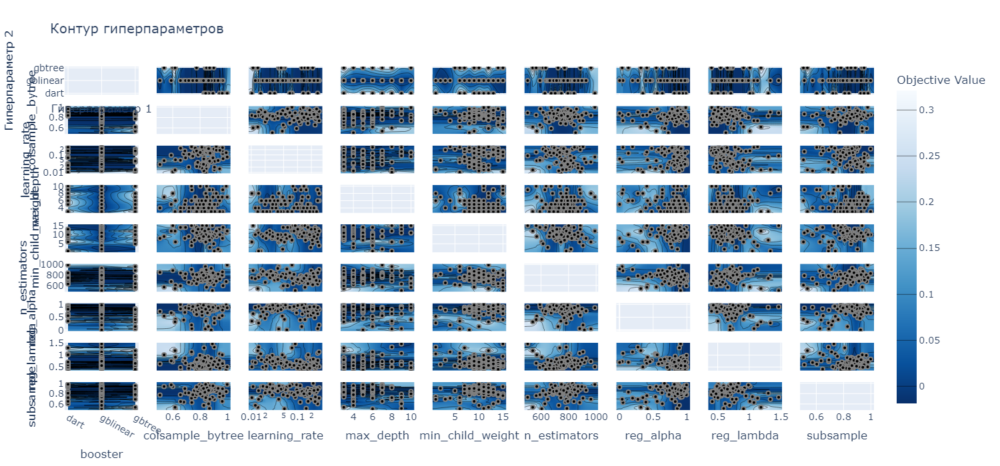

------------------------------------------------------------------------------------------------------------------------------------------------------





In [41]:
# График зависимости целевой функции от итераций
optuna_visualization(
    fig = optuna.visualization.plot_optimization_history(study),
    title1 = 'Точечная диаграмма зависимости целевой функции от итераций:',
    title2 = 'График зависимости целевой функции от итераций',
    x_title = 'Итерация',
    y_title = 'Целевая функция (RMSE)'
)


# График важности признаков
optuna_visualization(
    fig = optuna.visualization.plot_param_importances(study),
    title1 = 'Столбчатая диаграмма важности гиперпараметров:',
    title2 = 'График важности гиперпараметров',
    x_title = 'Гиперпараметры',
    y_title = 'Уровень важности'
)



# Список параметров
params_list = [
    ["n_estimators", "min_child_weight"],
    ["n_estimators", "learning_rate"],
    ["n_estimators", "reg_lambda"],
    ["max_depth", "learning_rate"]
]

# Список параметров для заголовка
params_title = [
    '"n_estimators" и "min_child_weight"',
    '"n_estimators" и "learning_rate"',
    '"n_estimators" и "reg_lambda"',
    '"max_depth" и "learning_rate"'
]

# Проходимся циклом for по спискам
for lists, title in zip(params_list, params_title):
    
    # Графики сходимости признаков
    optuna_visualization(
        fig = optuna.visualization.plot_contour(study, params = lists),
        title1 = f'График сходимости по параметрам {title}:',
        title2 = f'Contour Plot of Hyperparameters ({lists})',
        x_title = 'Learning Rate (α)',
        y_title = 'Max Tree Depth (D)'
    )
    
    
    
# Графики вклада гиперпараметров в целевую метрику на плоскости
optuna_visualization(
    fig = optuna.visualization.plot_slice(study, params = ['max_depth', 'learning_rate', 'n_estimators']),
    title1 = 'График вклада гиперпараметров "max_depth", "learning_rate" и "n_estimators" в целевую метрику на плоскости:',
    title2 = 'Вклад гиперпараметров "max_depth", "learning_rate" и "n_estimators" в целевую метрику на плоскости',
    x_title = 'Итерация',
    y_title = 'Целевая функция (RMSE)'
)
optuna_visualization(
    fig = optuna.visualization.plot_slice(study),
    title1 = 'График вклада всех гиперпараметров в целевую метрику на плоскости:',
    title2 = 'Вклад всех гиперпараметров в целевую метрику на плоскости',
    x_title = 'Итерация',
    y_title = 'Целевая функция (RMSE)'
)


# Контурный график взаимодействия гиперпараметров
optuna_visualization(
    fig = optuna.visualization.plot_contour(study),
    title1 = 'Контурный график взаимодействия гиперпараметров:',
    title2 = 'Контур гиперпараметров',
    x_title = 'Гиперпараметр 1',
    y_title = 'Гиперпараметр 2'
)

Теперь попробуем обучить модель подбирая наилучшие гиперпараметры при помощи **GridSearchCV()**:

In [42]:
# Создаем объект класса XGBRegressor()
XGB_model = XGBRegressor(random_stat = 42)



# Определяем параметры для поиска
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.3],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'subsample': [0.6, 0.8, 1.0],
    'min_child_weight': [1, 3, 5]
}



# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = XGB_model,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)



# Обучаем модель
grid_search.fit(X_train_final, y_train)

# Сохраняем лучшие параметры
best_xgb_model = grid_search.best_estimator_

# Делаем предсказание для тестовой выборки
y_xgb_predict = best_xgb_model.predict(X_test_final)



# Сохраним полученные гиперпараметры в переменной
best_xgb_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров:\n\n{best_xgb_parameters}')

Fitting 3 folds for each of 729 candidates, totalling 2187 fits
Наилучшие значения гиперпараметров:

{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6}


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning:

[12:16:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "random_stat" } are not used.




Считаем метрики:

In [43]:
# Применяем функцию 'print_metrics'            
print_metrics(y_test, y_xgb_predict, 'XGBoost')


XGBoost (значения метрик):

Mean Squared Error: 2.082
-----------------------------------
Root Mean Squared Error: 1.443
-----------------------------------
Mean Absolute Error: 1.160
-----------------------------------
R²: 0.286
-----------------------------------
Mean Absolute Percentage Error: 47.767%
----------------------------------------


Рассчитаем **SHAP**-значения:

In [44]:
# Создаём интерпретатор для XGBoost
explainer = shap.TreeExplainer(best_xgb_model)

# Вычисляем SHAP-значения (вклад признаков) для всех наблюдений из X_train_final
shap_values = explainer.shap_values(X_train_final)

Строим график **Summary plot**:


График важности признаков "summary_plot" (XGBoost):
------------------------------------------------------------------------------------------------------------------------------------------------------



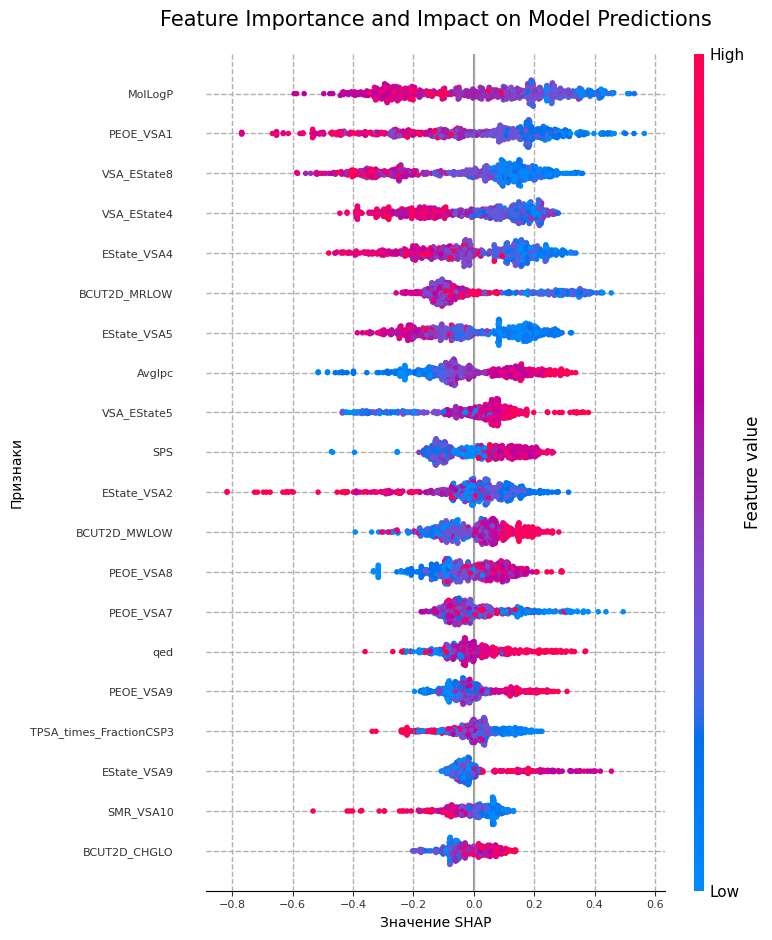

------------------------------------------------------------------------------------------------------------------------------------------------------


In [72]:
# Создаём заголовок для графика
print('\nГрафик важности признаков "summary_plot" (XGBoost):')
print('-' * 150)
print()



# Устанавливаем размер графика
plt.figure(figsize = (10, 30))  

# Строим график важности признаков
shap.summary_plot(
    shap_values, 
    X_train_final, 
    max_display = 20,
    show = False
)

# Настраиваем график
plt.title('Feature Importance and Impact on Model Predictions', fontsize = 15, pad = 20)
plt.xlabel('Значение SHAP', fontsize = 10)
plt.ylabel('Признаки', fontsize = 10)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.grid(True, linestyle = '--', linewidth = 1)
plt.tight_layout()



# Отображаем график
plt.show()
print('-' * 150)

Визуализирует, какие признаки внесли вклад в конкретный прогноз при помощи `force_plot`:

In [73]:
# Выводим SHAP-значения для 3-го наблюдения
print('\nSHAP-значения для 3-го наблюдения:')
shap.initjs()
print('Correct answer: {}'.format(y_test.iloc[2]))
print('Predicted answer: {}'.format(y_xgb_predict[0]))


# Строим график 'force_plot'
shap.force_plot(
    explainer.expected_value,
    shap_values[2,:],
    X_train_final.iloc[2,:]
)


SHAP-значения для 3-го наблюдения:


Correct answer: 4.630628655106912
Predicted answer: 5.782550811767578


Теперь построим график важности признаков при помощи `waterfall_legacy`:


График важности признаков "waterfall_legacy" (XGBoost):
------------------------------------------------------------------------------------------------------------------------------------------------------



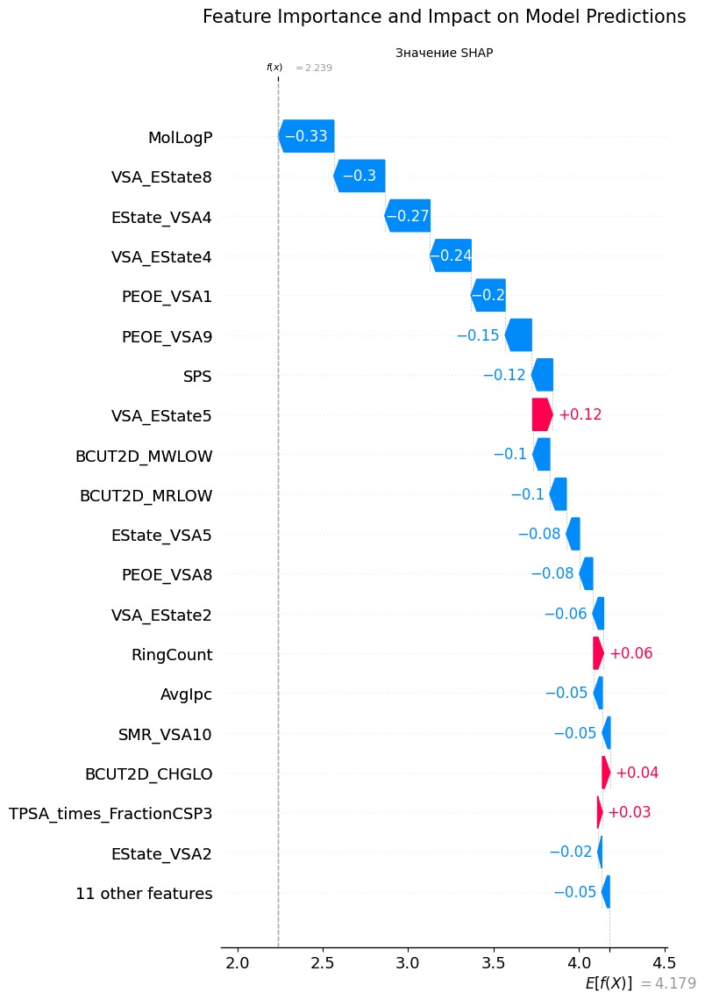

------------------------------------------------------------------------------------------------------------------------------------------------------


In [74]:
# Строим график 'waterfall_legacy'
print('\nГрафик важности признаков "waterfall_legacy" (XGBoost):')
print('-' * 150)
print()



# Устанавливаем размер графика
plt.figure(figsize = (30, 35))

# Строим график важности признаков
shap.initjs()

# Строим график 'waterfall_legacy'
shap.plots._waterfall.waterfall_legacy(
    explainer.expected_value, 
    shap_values[0], 
    feature_names = X_train_final.columns,
    max_display = 20,
    show = False
)

# Настраиваем график
plt.title('Feature Importance and Impact on Model Predictions', fontsize = 15, pad = 20)
plt.xlabel('Значение SHAP', fontsize = 10)
plt.ylabel('Признаки', fontsize = 10)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.grid(True, linestyle = '--', linewidth = 1)
plt.tight_layout()

# Отображаем график
plt.show()
print('-' * 150)

Создадим функцию для построения графика зависимости `SHAP`-значений от конкретного признака:

In [81]:
# Создаём функцию 'shap_dependence_plot()' для построения графика зависимости SHAP-значений
def shap_dependence_plot(shap_values, feature_name, X_data, title = None):
    
    """
    Функция для построения графика зависимости SHAP-значений от признака.
    
    Параметры:
    - shap_values: массив SHAP-значений.
    - feature_name: имя признака для оси X.
    - X_data: DataFrame с данными.
    - title: заголовок графика.
    
    """
    
    # Создаём заголовок для графика
    print(f'\nГрафик зависимости SHAP-значений от признака "{feature_name}":')
    print('-' * 150)
    
    
    # Задаём размер графика
    plt.rcParams['figure.figsize'] = (30, 17)
    
    # Строим график зависимости SHAP-значений от признака
    shap.dependence_plot(
        feature_name, 
        shap_values, 
        X_data,
        show = False
    )
    
    # Настраиваем график
    plt.title(title, fontsize = 15, pad = 20)
    plt.xlabel('Значение признака', fontsize = 10)
    plt.ylabel('SHAP-значения', fontsize = 10)
    plt.xticks(fontsize = 8)
    plt.yticks(fontsize = 8)
    plt.grid(True, linestyle = '--', linewidth = 1)
    plt.tight_layout()
    
    
    
    # Отображаем график
    plt.show()  
    print('-' * 150)
    print('\n\n')   

Выведем графики для следующих признаков:

- `MolLogP`, 

- `PEOE_VSA1`, 

- `VSA_EState8`, 

- `VSA_EState4`, 

- `EState_VSA4`.


График зависимости SHAP-значений от признака "MolLogP":
------------------------------------------------------------------------------------------------------------------------------------------------------


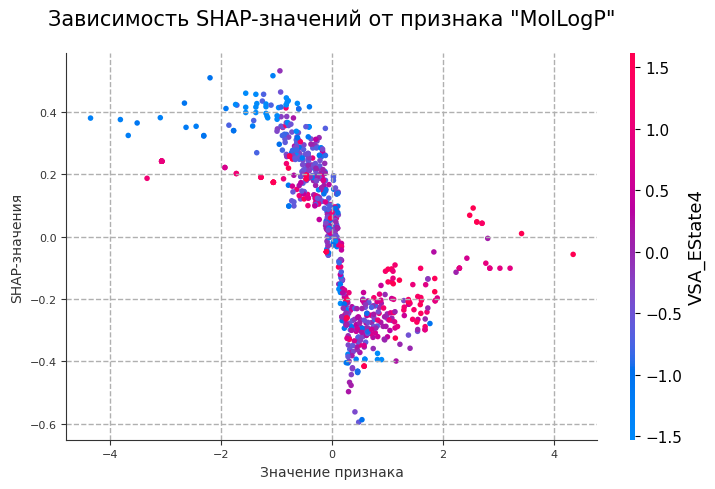

------------------------------------------------------------------------------------------------------------------------------------------------------




График зависимости SHAP-значений от признака "PEOE_VSA1":
------------------------------------------------------------------------------------------------------------------------------------------------------


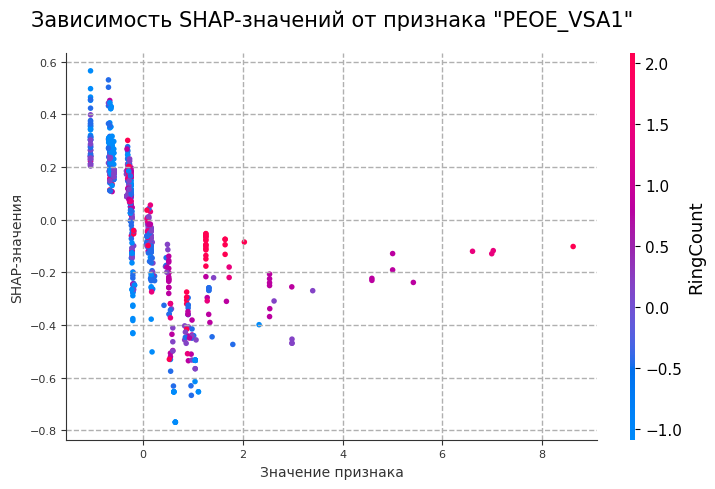

------------------------------------------------------------------------------------------------------------------------------------------------------




График зависимости SHAP-значений от признака "VSA_EState8":
------------------------------------------------------------------------------------------------------------------------------------------------------


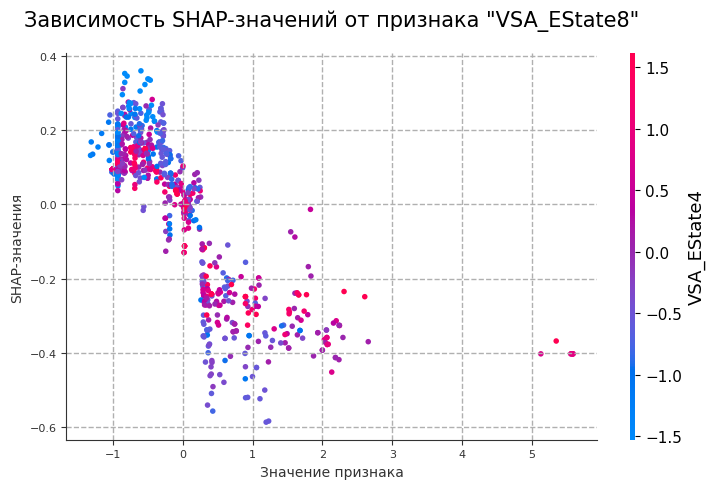

------------------------------------------------------------------------------------------------------------------------------------------------------




График зависимости SHAP-значений от признака "VSA_EState4":
------------------------------------------------------------------------------------------------------------------------------------------------------


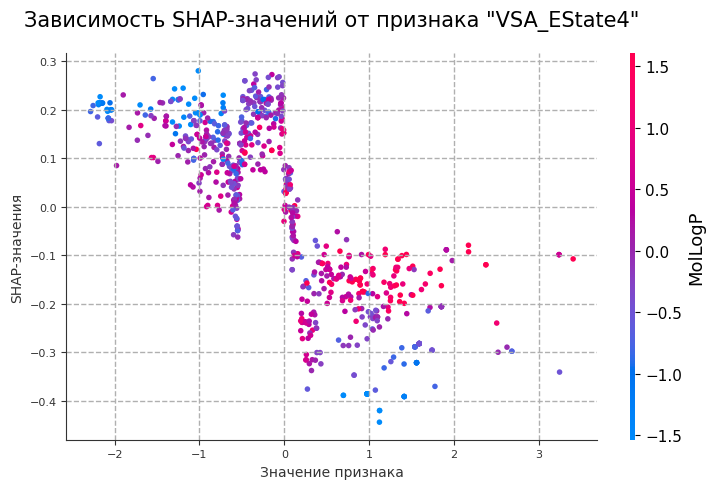

------------------------------------------------------------------------------------------------------------------------------------------------------




График зависимости SHAP-значений от признака "EState_VSA4":
------------------------------------------------------------------------------------------------------------------------------------------------------


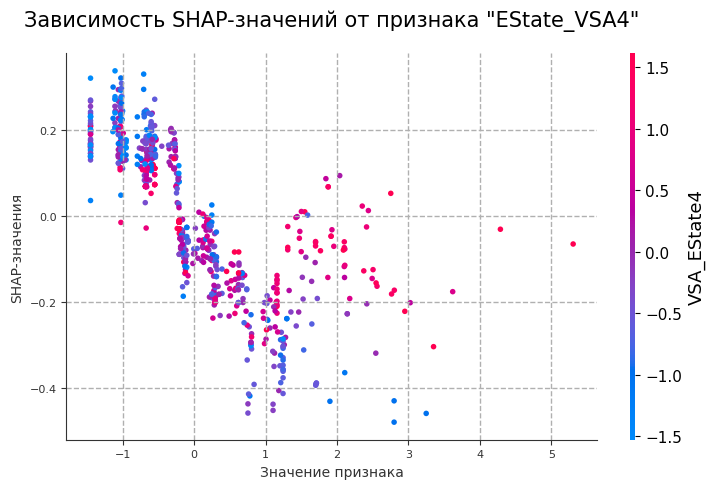

------------------------------------------------------------------------------------------------------------------------------------------------------





In [84]:
# Создаём список 5 лучших признаков для построения графиков зависимости 'SHAP'-значений
top_features = [
    'MolLogP', 
    'PEOE_VSA1', 
    'VSA_EState8', 
    'VSA_EState4', 
    'EState_VSA4'
]


# Проходимся циклом for по списку 'top_features' и строим графики зависимости 'SHAP'-значений
for feature in top_features:
    shap_dependence_plot(
        shap_values = shap_values, 
        feature_name = feature, 
        X_data = X_train_final, 
        title = f'Зависимость SHAP-значений от признака "{feature}"'
    )

Построим **scatter**-график, чтобы сравнить предсказанные значения с истинными:


График сравнения предсказанных и фактических значений "scatter" (XGBoost):
------------------------------------------------------------------------------------------------------------------------------------------------------


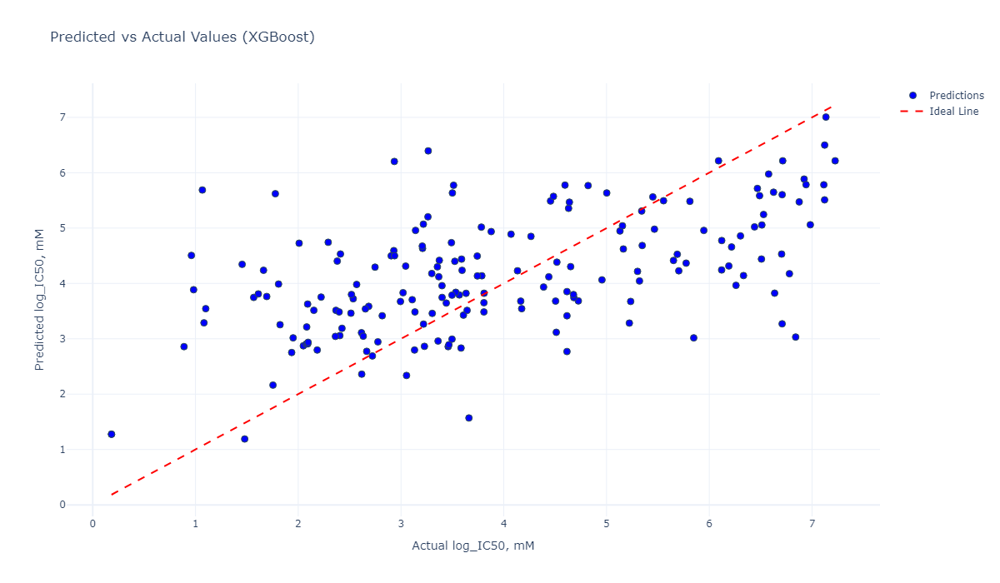

------------------------------------------------------------------------------------------------------------------------------------------------------


In [56]:
# Строим график 'scatter' для сравнения предсказанных и фактических значений
print('\nГрафик сравнения предсказанных и фактических значений "scatter" (XGBoost):')
print('-' * 150)




# Задаём фигуру для графика
fig_scatter = go.Figure()

# Добавляем точки предсказанных и фактических значений
fig_scatter.add_trace(go.Scatter(
    x = y_test,
    y = y_xgb_predict,
    mode = 'markers',
    marker = dict(color='blue', size=8),
    name = 'Predictions'
))

# Добавляем линию идеального совпадения
fig_scatter.add_trace(go.Scatter(
    x = [y_test.min(), y_test.max()],
    y = [y_test.min(), y_test.max()],
    mode = 'lines',
    line = dict(color = 'red', dash = 'dash'),
    name = 'Ideal Line'
))

# Настраиваем оформление графика
fig_scatter.update_traces(
    marker = dict(
        line = dict(width = 1, color = 'DarkSlateGrey')
    )
)

# Настраиваем макет графика
fig_scatter.update_layout(
    height = 700,
    width = 1200,
    title = 'Predicted vs Actual Values (XGBoost)',
    xaxis_title = 'Actual log_IC50, mM',
    yaxis_title = 'Predicted log_IC50, mM',
    showlegend = True,
    template = 'plotly_white'
)

# Отображаем график
fig_scatter.show('png')
print('-' * 150)

**Вывод:**

Модель **XGBoost** демонстрирует высокую точность в предсказании `log(IC50)`, с хорошей корреляцией между предсказанными и фактическими значениями. Однако для улучшения точности на краях диапазона может потребоваться дополнительная настройка модели или учет выбросов.

#### $1.8$

#### **MLPRegressor (Многослойный перцептрон)**

Данная модель реализует многослойный перцептрон для регрессии. Это нейронная сеть с полностью связанными слоями.

Обучим модель `MLPRegressor` пока с базовой настройкой:

In [48]:
# Создаем объект класса 'MLPRegressor()'
MLP_model = neural_network.MLPRegressor(random_state = 42)


# Определение сетки гиперпараметров для поиска
param_grid = {
    'hidden_layer_sizes': [(64, 32), (128, 64), (32, 16)],   # Разные конфигурации скрытых слоев
    'activation': ['relu', 'tanh'],                          # Типы активации
    'learning_rate_init': [0.001, 0.01],                     # Скорость обучения
    'alpha': [0.0001, 0.001],                                # L2-регуляризация
    'max_iter': [500, 1000]                                  # Максимальное число итераций    
}


# Настройка GridSearchCV
grid_search = model_selection.GridSearchCV(
    estimator = MLP_model,
    param_grid = param_grid,
    cv = 5,
    scoring = 'neg_mean_squared_error',
    n_jobs = -1,
    verbose = 1
)


# Обучение GridSearchCV на тренировочной выборке
grid_search.fit(X_train_final, y_train)

# Сохраняем лучшие параметры
best_model = grid_search.best_estimator_

# Делаем предсказание для тестовой выборки
y_mlp_predict = best_model.predict(X_test_final)



# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Наилучшие значения гиперпараметров: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (32, 16), 'learning_rate_init': 0.001, 'max_iter': 500}


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



Считаем метрики:

In [49]:
# Применяем функцию 'print_metrics'            
print_metrics(y_test, y_mlp_predict, 'MLPRegressor')


MLPRegressor (значения метрик):

Mean Squared Error: 2.697
-----------------------------------
Root Mean Squared Error: 1.642
-----------------------------------
Mean Absolute Error: 1.251
-----------------------------------
R²: 0.075
-----------------------------------
Mean Absolute Percentage Error: 49.805%
----------------------------------------


#### $1.9$

#### **Определяем лучшую модель.**

Составим таблицу (**DataFrame**) со следующими столбцами:

Наименование модели:

* `model_name`,

Метрики и их значения:

* `Mean Squared Error`,

* `Root Mean Squared Error`,

* `Mean Absolute Error`,

* `Mean Absolute Percentage Error`,

* `R²`.

In [60]:
# Создаём словарь из моделей и рассчитанных метрик
metrics_data = {
    'Model': ['Ridge', 'SVR', 'RandomForest', 'XGBoost', 'MLPRegressor'],
    'MSE': [2.433, 2.310, 1.995, 1.986, 2.979],
    'RMSE': [1.560, 1.520, 1.412, 1.409, 1.726],
    'MAE': [1.207, 1.204, 1.151, 1.154, 1.268],
    'MAPE': [49.805, 51.730, 44.749, 45.722, 49.805],
    'R²': [0.166, 0.208, 0.316, 0.319, -0.021]    
}

# Создаём 'DataFrame'      
metrics_df = pd.DataFrame(metrics_data)



# Выводим результат
check_data_inf(
    data = metrics_df,
    data_name = 'metrics_df',
    length1 = 35,
    length2 = 50
)


Данные таблицы "metrics_df" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 6.
-----------------------------------


,Model,MSE,RMSE,MAE,MAPE,R²
0,Ridge,2.433,1.560,1.207,49.805,0.166
1,SVR,2.310,1.520,1.204,51.730,0.208
2,RandomForest,1.995,1.412,1.151,44.749,0.316
3,XGBoost,1.986,1.409,1.154,45.722,0.319
4,MLPRegressor,2.979,1.726,1.268,49.805,-0.021


--------------------------------------------------


In [ ]:
# Создаём DataFrame
model_metrics = {
    'LinearRegression (Poly)'   : {'Mean Squared Error': 53.244, 'Root Mean Squared Error': 7.297, 'Mean Absolute Error': 3.929, 'Mean Absolute Percentage Error': 137.502, 'R²': -17.254},
    'Ridge'                     : {'Mean Squared Error': 2.433, 'Root Mean Squared Error': 1.560, 'Mean Absolute Error': 1.207, 'Mean Absolute Percentage Error': 49.805, 'R²': 0.075},
    'SupportVectorRegression'   : {'Mean Squared Error': 2.310, 'Root Mean Squared Error': 1.520, 'Mean Absolute Error': 1.204, 'Mean Absolute Percentage Error': 51.730, 'R²': 0.256},
    'RandomForestRegressor'     : {'Mean Squared Error': 1.995, 'Root Mean Squared Error': 1.412, 'Mean Absolute Error': 1.151, 'Mean Absolute Percentage Error': 44.749, 'R²': 0.316},
    'XGBoost'                   : {'Mean Squared Error': 1.981, 'Root Mean Squared Error': 1.407, 'Mean Absolute Error': 1.153, 'Mean Absolute Percentage Error': 45.722, 'R²': 0.321},
    'MLPRegressor'              : {'Mean Squared Error': 2.697, 'Root Mean Squared Error': 1.642, 'Mean Absolute Error': 1.251, 'Mean Absolute Percentage Error': 49.805, 'R²': 0.075}
}

metrics_df = pd.DataFrame(model_metrics).T
metrics_df = metrics_df.reset_index().rename(columns = {'index': 'model_name'})



# Выводим результат
check_data_inf(
    data = metrics_df,
    data_name = 'metrics_df',
    length1 = 35,
    length2 = 125
)


Данные таблицы "metrics_df" имеют следующую размерность:

Количество строк: 6;
Количество признаков (столбцов): 5.
-----------------------------------


,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,Mean Absolute Percentage Error,R²
LinearRegression (Poly),53.244,7.297,3.929,137.502,-17.254
Ridge,2.433,1.560,1.207,49.805,0.075
SupportVectorRegression,2.310,1.520,1.204,51.730,0.256
RandomForestRegressor,1.995,1.412,1.151,44.749,0.316
XGBoost,1.981,1.407,1.153,45.722,0.321


-----------------------------------------------------------------------------------------------------------------------------


**Визуализация метрик.**

Теперь построим графики по каждой метрике, чтобы сравнить их друг с другом визуально.

Создадим функцию для построения визуализаций метрик:

In [61]:
# Создаём функцию для отображения метрик
def metrics_bar(x, y, main_title = None, title = None, y_title = None):
    
    
    # Задаём заглавие для графика
    print()
    print(main_title)
    print('-' * 150)
    
    
    # Создаём фигуру для графика
    fig = go.Figure()
    
    # Создаём график
    fig.add_trace(
        go.Bar(
            x = x,
            y = y,
            marker_color = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEEAD'],
            text = y.round(3),
            textposition = 'auto'
        )
    )
    
    # Настраиваем оформление
    fig.update_layout(
        height = 700,
        width = 1500,
        title = title,
        xaxis_title = 'Model',
        yaxis_title = y_title,
        template = 'plotly_white',
        showlegend = True
    )
    
    
    # Отображаем график
    fig.show('png')

Строим графики:


Столбчатая диаграмма сравнения моделей по метрикам (MSE)
------------------------------------------------------------------------------------------------------------------------------------------------------


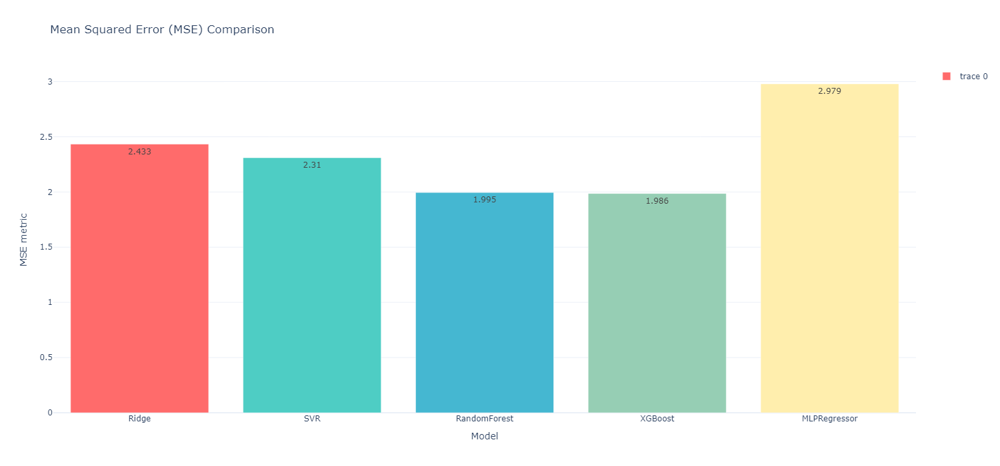


Столбчатая диаграмма сравнения моделей по метрикам (RMSE)
------------------------------------------------------------------------------------------------------------------------------------------------------


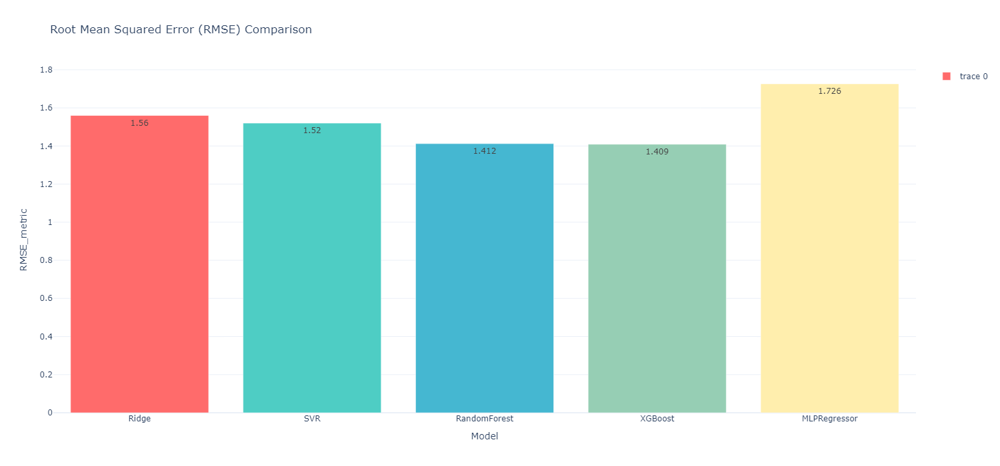


Столбчатая диаграмма сравнения моделей по метрикам (MAE)
------------------------------------------------------------------------------------------------------------------------------------------------------


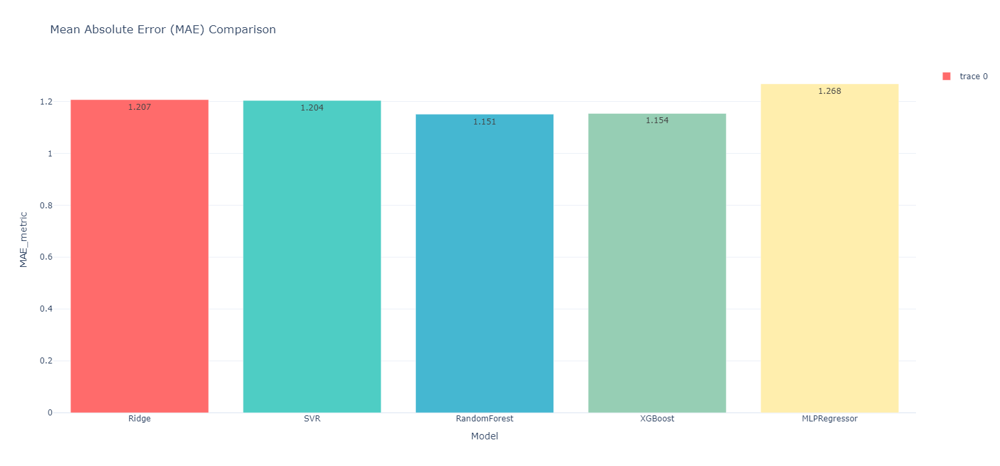


Столбчатая диаграмма сравнения моделей по метрикам (MAPE)
------------------------------------------------------------------------------------------------------------------------------------------------------


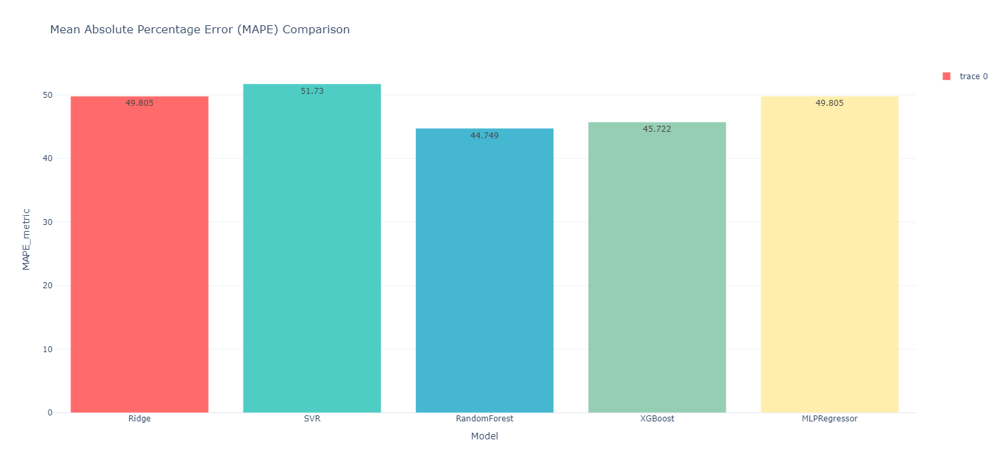


Столбчатая диаграмма сравнения моделей по метрикам (R²)
------------------------------------------------------------------------------------------------------------------------------------------------------


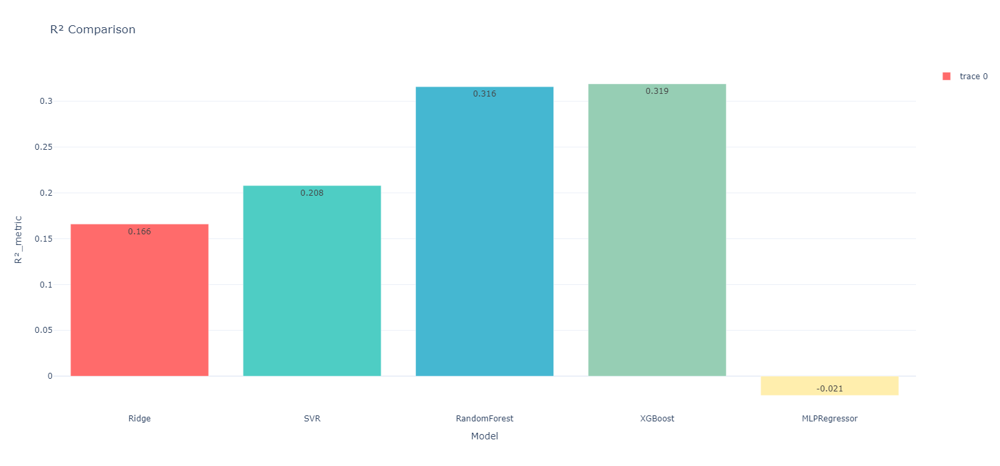

------------------------------------------------------------------------------------------------------------------------------------------------------


In [64]:
# Создаём список метрик
metrics_list = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R²']


# Создаём список основных заглавий 
main_title_list = [
    'Столбчатая диаграмма сравнения моделей по метрикам (MSE)',
    'Столбчатая диаграмма сравнения моделей по метрикам (RMSE)',
    'Столбчатая диаграмма сравнения моделей по метрикам (MAE)',
    'Столбчатая диаграмма сравнения моделей по метрикам (MAPE)',
    'Столбчатая диаграмма сравнения моделей по метрикам (R²)'
]


# Создаём список заглавий для графиков
metrics_title_list = [
    'Mean Squared Error (MSE) Comparison',
    'Root Mean Squared Error (RMSE) Comparison',
    'Mean Absolute Error (MAE) Comparison',
    'Mean Absolute Percentage Error (MAPE) Comparison',
    'R² Comparison'
]


# Создаём список заглавий для оси 'y'        
y_title_list = ['MSE metric', 'RMSE_metric', 'MAE_metric', 'MAPE_metric', 'R²_metric']



# Создаём цикл 'for' по спискам
for metric, main_title, metric_title, y_title in zip(metrics_list, main_title_list, metrics_title_list, y_title_list):
    
    # Строим столбчатые диаграммы
    metrics_bar(
        x = metrics_df['Model'],
        y = metrics_df[metric],
        main_title = main_title,
        title = metric_title,
        y_title = y_title     
    )
    
print('-' * 150)

#### $1.10$

#### **Вывод.**

На данном этапе сделаем вывод итоговым метрикам и моделям, обученным для предсказания целевой переменной `IC50, mM`.

Среди всех моделей `XGBoost` показывает наилучшее качество регрессии соединений по `IC50`, так как модель хорошо сбалансирована.

Тем не менее, результаты несовсем удовлетворительны, необходима дополнительная обработка данных или добавить дополнительные гиперпараметры. 

=============================================================================================================================================

## <CENTER> **`2.` Machine Learning (Регрессия для CC50)**

На данном этапе мы построим несколько подходящих моделей регрессии для **CC50** и выберем наилучшую.

#### $2.1$

#### **Предобработка данных.**

Как и раньше, предобработаем данные при помощи созданного ранее пайплайна, только все этапы по предобработке, созданию и удалению признаков включим в отдельный класс.

Повторно загружаем пайплайн:

In [85]:
# Загружаем пайплайн при помощи joblib
preprocessing_pipeline = joblib.load('data/preprocessing_pipeline.joblib')
print("Пайплайн загружен из 'preprocessing_pipeline.joblib'")

Пайплайн загружен из 'preprocessing_pipeline.joblib'


**Создание класса.**

Создадим класс, в котором реализуем все этапы по созданию новых признаков, удалению нерелевантных признаков и предобработки данных:

In [86]:
# Создаём класс 'DataPreprocessor'       
class DataPreprocessor:
    
    
    
    # Задаём необходимые параметры
    def __init__(self, preprocessing_pipeline, random_state = 42):
        
        """
        Инициализация класса.
        preprocessing_pipeline: пайплайн с шагами feature_union, feature_selector, S_scaler.
        random_state: для воспроизводимости разбиения.
        
        """
        
        self.preprocessing_pipeline = preprocessing_pipeline
        self.random_state = random_state
        
        self.feature_names = (
            ['MolWt_TPSA', 'MolWt_per_Heteroatoms', 'TPSA_per_MolLogP'] +
    
            ['total_functional_groups', 'fr_amide_plus_ester', 'fr_benzene_times_nitro', 
             'fr_Al_OH_per_benzene', 'fr_amide_presence', 'fr_aldehyde_presence', 
             'fr_aniline_presence', 'fr_amidine_presence'] +
    
            ['PEOE_VSA_total', 'SMR_VSA_ratio', 'Chi0_times_Kappa1', 'TPSA_times_FractionCSP3'] +
            ['log_MolWt', 'MolLogP_squared', 'NumRotatableBonds_squared']
        )
        
        self.duplicated_features = ['Unnamed: 0', 'Unnamed: 0.1']
        self.X_train_full = None
        self.X_test_full = None
        self.X_train_processed_df = None
        self.X_test_processed_df = None
        self.y_train = None
        self.y_test = None
        self.partial_pipeline = None
        self.remaining_features = None
        
        
        
    # Удаляем признаки типов 'object' и 'category'          
    def remove_non_numeric_columns(self, data):
        
         """
         Удаление нечисловых столбцов.
         
         """
         
         return data.select_dtypes(include = [np.number])
     
     
     
    # Создаём новые признаки, удаляем нерелевантные и преобразовываем данные
    def fit_transform(self, X, y):
        
        """
        Разбиение данных, обучение пайплайнов и трансформация.
        X: исходные данные (без целевой переменной).
        y: целевая переменная 'CC50'.
        
        """
        
        # Разбиение на тренировочную и тестовую выборки
        X_train, X_test, self.y_train, self.y_test = model_selection.train_test_split(
            X, y,
            test_size = 0.2,
            random_state = self.random_state
        )
        
        # Удаляем дублирующиеся столбцы
        X_train = X_train.drop(columns=self.duplicated_features, axis=1, errors='ignore')
        X_test = X_test.drop(columns=self.duplicated_features, axis=1, errors='ignore')
        
        # Восстанавливаем индексы
        X_train = X_train.reset_index(drop = True)
        X_test = X_test.reset_index(drop = True)
        
        # Создаём новые признаки
        # для этого извлекаем 'FeatureUnion' из пайплайна и обучаем его
        feature_union_step = self.preprocessing_pipeline.named_steps['feature_union']
        feature_union_step.fit(X_train, self.y_train)
        
        # Применяем пайплайн к тренировочным и тестовым данным
        X_train_transformed = feature_union_step.transform(X_train)
        X_test_transformed = feature_union_step.transform(X_test)
        
        # Преобразуем результат обратно в DataFrame
        X_train_transformed_df = pd.DataFrame(
            X_train_transformed,
            columns = self.feature_names,
            index = X_train.index
        )
        X_test_transformed_df = pd.DataFrame(
            X_test_transformed,
            columns = self.feature_names,
            index = X_test.index
        )
        
        # Объединяем признаки
        self.X_train_full = pd.concat([X_train, X_train_transformed_df], axis=1)
        self.X_test_full = pd.concat([X_test, X_test_transformed_df], axis=1)

        # Удаляем нечисловые столбцы
        self.X_train_full = self.remove_non_numeric_columns(self.X_train_full)
        self.X_test_full = self.remove_non_numeric_columns(self.X_test_full)
        
        # Удалим нерелевантные признаки и стандартизируем данные
        # для начала извлечём шаги из пайплайна
        feature_selector = self.preprocessing_pipeline.named_steps['feature_selector']
        S_scaler = self.preprocessing_pipeline.named_steps['S_scaler']
        
        # Создание нового пайплайна с 'feature_selector' и 'S_scaler'
        self.partial_pipeline = pipeline.Pipeline([
            ('feature_selector', feature_selector),
            ('S_scaler', S_scaler)
        ])  
        
        # Обучаем созданный пайплайн на тренировочной выборке
        self.partial_pipeline.fit(self.X_train_full, self.y_train)

        # Применяем пайплайн к тренировочным и тестовым данным
        X_train_processed_full = self.partial_pipeline.transform(self.X_train_full)
        X_test_processed_full = self.partial_pipeline.transform(self.X_test_full)

        # Получаем список оставшихся признаков
        fs_step = self.partial_pipeline.named_steps['feature_selector']
        self.remaining_features = self.X_train_full.columns.difference(
            fs_step.to_drop_corr + fs_step.to_drop_var, sort=False
        )
        
        # Преобразуем результат обратно в DataFrame
        self.X_train_processed_df = pd.DataFrame(
            X_train_processed_full,
            columns = self.remaining_features,
            index = self.X_train_full.index
        )
        self.X_test_processed_df = pd.DataFrame(
            X_test_processed_full,
            columns = self.remaining_features,
            index = self.X_test_full.index
        )
        
        
        
    # Выводим результат
    def get_processed_data(self):
        
        """
        Возвращает обработанные данные.
        
        """
        
        processed_data = (
            self.X_train_processed_df,
            self.X_test_processed_df,
            self.y_train,
            self.y_test,
            self.remaining_features
        )
        
        return processed_data

Разделим данные:

In [73]:
# Разделяем данные на матрицу наблюдений и вектор правильных ответов
X = molecule_df.drop(columns = ['IC50, mM', 'CC50, mM', 'SI', 'log_IC50, mM', 'log_CC50, mM', 'log_SI'])
y = molecule_df['log_CC50, mM']

Применим созданный класс к данным:

In [74]:
# Создаём экземпляра класса 'DataPreprocessor'
DP_processor = DataPreprocessor(preprocessing_pipeline)

# Обработка данных
DP_processor.fit_transform(X, y)

# Получение обработанных данных
X_train_processed_df, X_test_processed_df, y_train, y_test, remaining_features = DP_processor.get_processed_data()


Данные таблицы "Molecular properties features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
------------------------------------------------------------




Данные таблицы "Functional groups features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 8.
----------------------------------------
------------------------------------------------------------------------------------------




Данные таблицы "Topological descriptors features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 4.
----------------------------------------
--------------------------------------------------------------------------------




Данные таблицы "Transformations features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
---------------------------------------------------

Выводим результат:

In [75]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_processed_df,
    data_name = 'X_train_processed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_processed_df,
    data_name = 'X_test_processed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по оставшимся признакам
print(f'Оставшиеся признаки:\n\n{remaining_features.tolist()}')
print('-' * 150)


Данные таблицы "X_train_processed_df" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,-1.496602,0.422613,0.771519,0.579771,-0.081941,-0.172284,-0.720975,-0.482466,-0.231601,0.709602,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064531,-0.017568,-0.338656,-0.806000,-0.332149
1,0.527403,0.904784,-0.394927,0.514586,-0.554818,-0.694608,-0.970049,-0.465835,0.425592,0.670103,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064565,0.133615,-0.338656,-0.806000,-0.857136
2,0.252959,-0.894628,0.392277,0.397569,0.511590,-0.034503,1.347721,0.555049,-0.313054,0.077316,...,-0.174679,-0.210093,-0.266667,3.294307,-0.177731,-0.064578,0.146636,-0.338656,0.736551,1.215385
3,-1.210453,0.216033,0.750903,0.746949,1.699045,-1.145565,-0.554926,-0.589790,-0.967502,0.838770,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064458,-0.019390,-0.338656,-0.806000,-0.065901
4,0.694610,-0.824197,0.472459,1.392750,-0.120265,-0.264281,0.954612,0.555048,-0.403346,-0.483621,...,-0.174679,-0.210093,3.750000,-0.303554,-0.177731,-0.064567,0.009951,-0.338656,0.207477,-0.043975


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_processed_df" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,0.160756,-0.510352,-0.302029,-0.353559,-1.315644,-0.863532,1.780140,0.559264,2.296748,-1.732256,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064599,-1.198955,-0.338656,0.168554,-0.016665
1,0.552605,-0.468304,-2.184035,-1.056662,-1.369489,-0.089109,0.528003,0.552297,1.154219,-0.893501,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064590,0.128426,-0.338656,1.068112,-0.717143
2,-0.045459,-1.061101,0.108325,0.426638,0.811860,-0.471906,1.224172,-0.471246,-0.265352,0.017607,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064578,0.213022,1.475033,1.241226,1.433804
3,0.464136,0.524951,-1.212053,-1.368374,-0.291834,0.854706,0.353155,0.492597,-0.231089,0.701536,...,-0.174679,-0.210093,-0.266667,-0.303554,0.788429,-0.064576,0.094904,-0.338656,1.152177,1.983047
4,-1.720945,1.330435,0.862116,-1.065667,0.899075,0.426860,-2.215418,-0.592477,-0.231368,0.760929,...,-0.174679,-0.210093,-0.266667,-0.303554,4.653068,-0.064459,-0.076881,-0.338656,-0.806000,-0.190647


------------------------------------------------------------------------------------------------------------------------------------------------------




Оставшиеся признаки:

['MaxAbsEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'FpDensityMorgan1', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'Ipc', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA12', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA7', 'SlogP_VSA8', 'EState_VSA11', 'EState_VSA2', 'EState_VSA3', 'EState_VSA4', 'EState_VSA5', 'EState_VSA6', 'EState_VSA7', 'EState_VSA8', 'EState_VSA9', 'VSA_EState1', 'VSA_EState2', 'VSA_EState4', 'VSA_EState5', 'VSA_EState7', 'VSA_EState8', 'VSA_EState9', 'NumAliphatic

По результатам видно, что данные, после применения класса, имеют схожую структуру, что и при прошлой предобработки.

Проверим распределение признаков при помощи визуализации:


График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


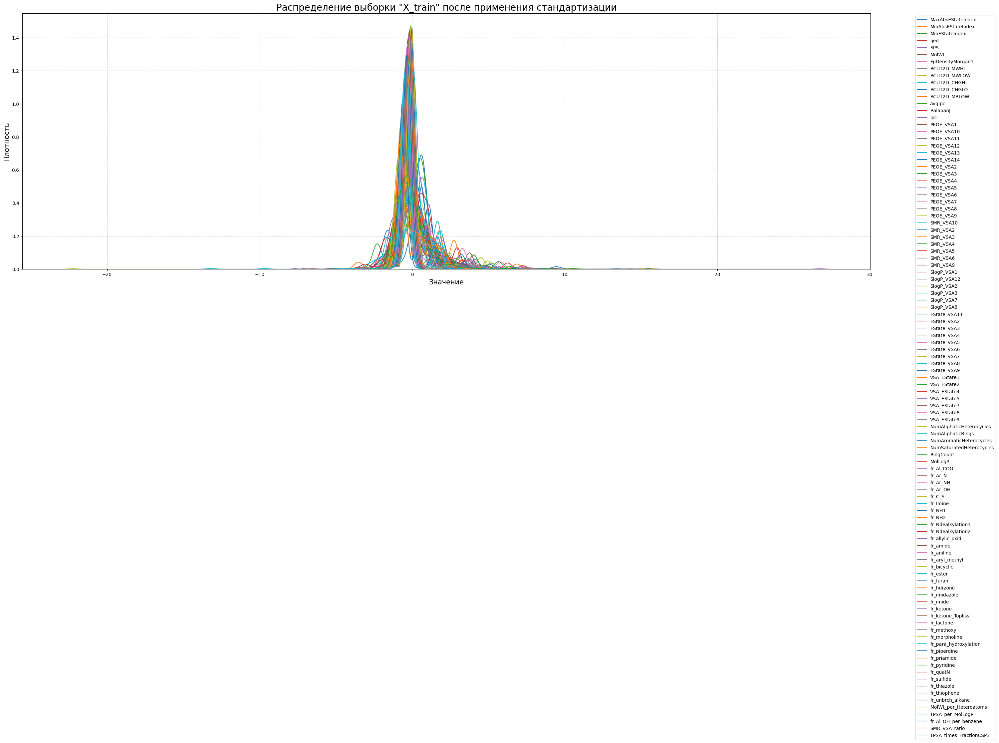

------------------------------------------------------------------------------------------------------------------------------------------------------



График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


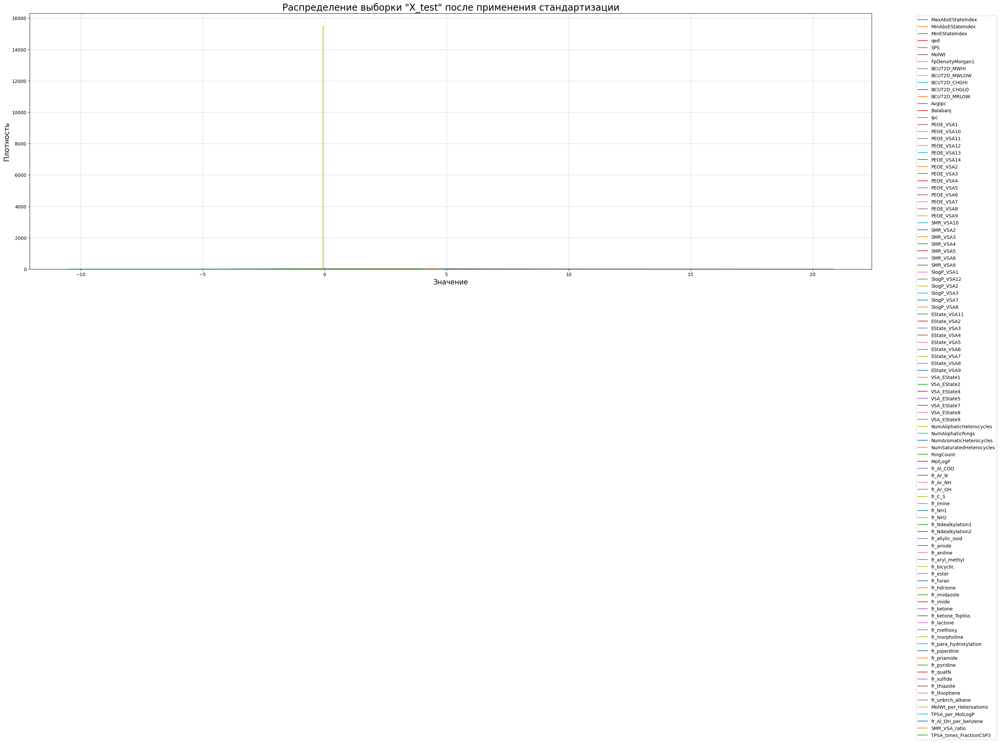

------------------------------------------------------------------------------------------------------------------------------------------------------


In [76]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_train
print()
features_distribution_plot(
    data = X_train_processed_df,
    title = 'Распределение выборки "X_train" после применения стандартизации',
    figsize = (30, 17)
)

# Добавляем отступ
print('\n\n')



# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_test
features_distribution_plot(
    data = X_test_processed_df,
    title = 'Распределение выборки "X_test" после применения стандартизации',
    figsize = (30, 17)
)

**Вывод:**

Распределение признаков также нормализовалось.

#### $2.2$

#### **Отбор самых информативных признаков.**

На данном этапе отберём только самые информативные признаки для дальнейшего решения задачи регрессии.

Производить отбор признаков будем так же, как и для `IC50`, в $4$ этапа:

1. Отберём $50$ признаков с помощью алгоритма **Mutual Information**,
2. Отберём $50$ признаков с помощью алгоритма **F-test**,
3. Отберём $50$ признаков из отобранных обоими алгоритмами,
4. Из оставшихся отберём $30$ признаков с помощью алгоритма **Lasso**.

Только сейчас, все этапы обернём в класс, чтобы использовать его в будущем.

**Создание класса.**

Создадим класс `FeatureSelector`, в котором реализуем все $4$ этапа по отбору самых информативных признаков.

В данный класс включим алгоритмы **Mutual Information**, **F-test** и **Lasso**:

In [94]:
# Создаём класс 'FeatureSelector'          
class FeatureSelector:
    
    
    
    # Задаём необходимые параметры
    def __init__(self, mi_k=50, f_k=50, lasso_max_features=30, lasso_alpha=0.01, random_state=42):
        
        """
        Инициализация класса.
        mi_k: количество признаков для Mutual Information.
        f_k: количество признаков для F-теста.
        lasso_max_features: максимальное число признаков для LASSO.
        lasso_alpha: параметр регуляризации для LASSO.
        random_state: для воспроизводимости.
        
        """
        
        self.mi_k = mi_k
        self.f_k = f_k
        self.lasso_max_features = lasso_max_features
        self.lasso_alpha = lasso_alpha
        self.random_state = random_state
        self.mi_selector = None
        self.f_selector = None
        self.lasso = None
        self.mi_scores = None
        self.f_scores = None
        self.lasso_scores = None
        self.mi_selected_features = None
        self.f_selected_features = None
        self.common_features = None
        self.final_features = None
        self.X_train_final = None
        self.X_test_final = None
        
        
        
    # Отбор 50 признаков (Mutual Information)
    def fit_mi(self, X, y):
        
        """
        Фильтрация с помощью Mutual Information.
        
        """
        
        self.mi_selector = feature_selection.SelectKBest(score_func=feature_selection.mutual_info_regression, k=self.mi_k)
        self.mi_selector.fit(X, y)
        self.mi_scores = pd.Series(self.mi_selector.scores_, index = X.columns).sort_values(ascending = False)
        self.mi_selected_features = X.columns[self.mi_selector.get_support()].tolist()
        
        
        
    # Отбор 50 признаков (F-test)
    def fit_f_test(self, X, y):
        
        """
        Фильтрация с помощью F-теста.
        
        """
        
        self.f_selector = feature_selection.SelectKBest(score_func = feature_selection.f_regression, k = self.f_k)
        self.f_selector.fit(X, y)
        self.f_scores = pd.Series(self.f_selector.scores_, index = X.columns).sort_values(ascending = False)
        self.f_selected_features = X.columns[self.f_selector.get_support()].tolist()
        
        
        
    # Из отобранных признаков обоими алгоритмами отберём те, которые попали в оба списка
    def select_common_features(self):
        
        """
        Отбор лучших 50 признаков из пересечения MI и F-теста.
        
        """
        
        self.common_features = list(set(self.mi_selected_features) & set(self.f_selected_features))
        
        if len(self.common_features) < self.mi_k:
            additional_features = [feature for feature in self.mi_selected_features if feature not in self.common_features]
            self.common_features.extend(additional_features[:self.mi_k - len(self.common_features)]) 
            
            
            
    # Отбираем 30 признаков (Lasso)
    def fit_lasso(self, X, y):
        
        """
        Применение LASSO для выбора 30 признаков.
        
        """
        
        self.lasso = linear_model.Lasso(alpha = self.lasso_alpha, random_state = self.random_state)
        self.lasso.fit(X, y)
        self.lasso_scores = pd.Series(self.lasso.coef_, index = X.columns).abs().sort_values(ascending = False)
        lasso_selector = feature_selection.SelectFromModel(self.lasso, prefit = True, max_features = self.lasso_max_features)
        self.final_features = X.columns[lasso_selector.get_support()].tolist() 
        
        
        
    # Преобразовываем данные
    def transform(self, X_train, X_test):
        
        """
        Трансформация данных с учетом отобранных признаков.
        
        """
        
        # Фильтрация до 50 признаков
        X_train_filtered = X_train[self.common_features]
        X_test_filtered = X_test[self.common_features]

        # Применение LASSO и создание финального DataFrame
        X_train_final_transformed = lasso_selector.transform(X_train_filtered)
        self.X_train_final = pd.DataFrame(
            X_train_final_transformed,
            columns = self.final_features,
            index = X_train.index
        )
        
        self.X_test_final = X_test_filtered[self.final_features]
        
        
    
    # Применяем отбор признаков к тренировочной и тестовой выборке    
    def fit_transform(self, X_train, X_test, y_train):
        
        """
        Полный процесс отбора признаков.
        X_train, X_test: исходные данные.
        y_train: целевая переменная.
        
        """
        
        self.fit_mi(X_train, y_train)
        self.fit_f_test(X_train, y_train)
        self.select_common_features()
        self.fit_lasso(X_train.loc[:, self.common_features], y_train)
        self.transform(X_train, X_test)
        
        
        
    # Вывод преобразованных данных
    def get_final_data(self):
        
        """
        Возвращает отфильтрованные данные.
        
        """
        
        return self.X_train_final, self.X_test_final, self.final_features



    # Выводим отобранные признаки
    def print_results(self):
        
        """ 
        Вывод результатов отбора признаков.
        
        """
        
        print(f'\nТоп-30 финальных признаков после "LASSO"\n\n{self.lasso_scores.head(50)}')
        print('-' * 40)

Применим созданный класс к данным:

In [78]:
# Инициализируем класс 'FeatureSelector'         
feature_selector = FeatureSelector(
    mi_k = 50,
    f_k = 50,
    lasso_max_features = 30,
    lasso_alpha = 0.01
)

# Обучаем класс на данных
feature_selector.fit_transform(X_train_processed_df, X_test_processed_df, y_train)

# Получение обработанных данных
X_train_final, X_test_final, final_features = feature_selector.get_final_data()

# Выводим результат
feature_selector.print_results()


Топ-30 финальных признаков после "LASSO"

BCUT2D_CHGLO               0.408326
SPS                        0.384736
PEOE_VSA1                  0.336648
PEOE_VSA12                 0.332766
AvgIpc                     0.300760
NumAliphaticRings          0.231495
SMR_VSA10                  0.222399
VSA_EState5                0.210683
EState_VSA9                0.199482
PEOE_VSA8                  0.178145
VSA_EState4                0.175500
EState_VSA2                0.174377
SlogP_VSA3                 0.161474
BCUT2D_MRLOW               0.160948
EState_VSA4                0.152407
SlogP_VSA1                 0.142449
PEOE_VSA6                  0.129855
PEOE_VSA3                  0.112861
fr_bicyclic                0.099854
FpDensityMorgan1           0.098903
VSA_EState1                0.088198
EState_VSA3                0.087985
PEOE_VSA11                 0.087045
RingCount                  0.081537
EState_VSA8                0.080721
VSA_EState8                0.078764
MolLogP              

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:486: UserWarning:

X has feature names, but SelectFromModel was fitted without feature names



Выведем информацию итоговых выборок:

In [79]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_final,
    data_name = 'X_train_final',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_final,
    data_name = 'X_test_final',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_final" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 30.
----------------------------------------


,qed,PEOE_VSA6,FpDensityMorgan1,NumAliphaticRings,MolLogP,BCUT2D_CHGLO,SMR_VSA10,EState_VSA2,RingCount,VSA_EState8,...,AvgIpc,BalabanJ,PEOE_VSA1,PEOE_VSA11,PEOE_VSA12,PEOE_VSA3,PEOE_VSA8,EState_VSA3,VSA_EState5,fr_bicyclic
0,-0.283280,-0.720975,-0.123882,-0.231601,1.146289,0.106999,0.809641,-1.133018,-0.642902,0.180211,...,1.094114,0.164660,-0.654310,-0.577540,-0.638151,-0.820987,-0.501151,-0.791905,0.875327,-0.332149
1,-0.116601,-0.970049,-0.123882,0.425592,-0.438833,-0.287725,-0.927114,-0.889025,-0.612792,0.180211,...,-0.132690,0.122907,0.358409,-0.577540,-0.638151,-0.820987,-0.852100,0.381094,-0.723162,-0.857136
2,-0.096764,1.347721,-0.123882,-0.313054,0.134020,0.488749,0.018407,-0.456006,1.659867,-0.452278,...,-1.317070,0.230686,0.156603,-0.577540,0.389551,-0.012449,-0.852100,0.092873,0.320846,1.215385
3,-0.613549,-0.554926,1.344428,-0.967502,-0.093992,-1.157446,1.381794,-1.139996,-0.632769,0.180211,...,-0.265867,-1.556033,0.473720,-0.577540,-0.638151,-0.820987,-0.852100,-0.791905,1.075515,-0.065901
4,0.257495,0.954612,-0.858037,-0.403346,0.418298,0.817315,-0.061945,-0.445268,0.774582,-0.452278,...,0.266289,-0.219276,-0.202214,-0.022849,-0.638151,-0.063061,-0.126073,-1.164993,-0.077143,-0.043975


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_final" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 30.
----------------------------------------


,qed,PEOE_VSA6,FpDensityMorgan1,NumAliphaticRings,MolLogP,BCUT2D_CHGLO,SMR_VSA10,EState_VSA2,RingCount,VSA_EState8,...,AvgIpc,BalabanJ,PEOE_VSA1,PEOE_VSA11,PEOE_VSA12,PEOE_VSA3,PEOE_VSA8,EState_VSA3,VSA_EState5,fr_bicyclic
0,-0.353559,-1.274086,1.780140,-1.592192,-2.374582,2.808560,0.499853,-0.191636,-1.084768,-0.936206,...,-0.523923,2.235256,-0.234096,-0.577540,0.258940,-0.601189,-0.958198,-0.853886,-0.355714,-0.354869
1,-1.056662,-1.274086,0.528003,-1.592192,-0.118334,1.717081,0.968608,0.740576,-1.084768,-0.673554,...,0.279302,0.360574,-0.624909,0.590564,-0.638151,0.275292,-1.008634,-0.773137,-0.134131,-1.039057
2,0.426638,-0.637539,1.224172,-0.123882,-0.152599,-0.808107,-0.722000,0.378423,-0.452278,-0.224349,...,0.033512,0.018830,0.103660,-0.577540,-0.638151,-0.601189,-0.418413,0.082011,0.318123,-0.354869
3,-1.368374,-0.034597,0.353155,-0.123882,0.747654,0.061560,-0.172658,-0.642902,-0.452278,1.559249,...,1.105525,-1.083867,0.064870,-0.577540,-0.638151,-0.601189,0.054797,2.355336,0.292743,0.329319
4,-1.065667,1.932642,-2.215418,1.344428,2.045792,0.059434,-0.312085,-1.085657,0.180211,2.072285,...,0.816310,-1.655280,-1.058021,-0.577540,-0.638151,-0.601189,1.622910,0.327360,0.653392,1.697695


------------------------------------------------------------------------------------------------------------------------------------------------------


**Построение визуализаций.**

Создадим функцию, для построения скрипичных графиков отобранных признаков:

In [80]:
# Создаём функцию 'violin_features' для построения скрипичного графика
def violin_features(data, features, title1=None, title2=None, y_title=None, color_type=None):
    
    
    
    # Задаём количество признаков для визуализации
    top_features = features
    
    # Настраиваем градиент для визуализации
    N = len(top_features)
    cmap = cm.get_cmap(color_type, N)
    colors = [mcolors.to_hex(cmap(i)) for i in range(N)]
    
    # Задаём заголовок для графика
    print(title1)
    print('-' * 150)
    
    
    
    # Создаём фигуру
    fig_violin = go.Figure()
    
    # Строим график
    for i, feature in enumerate(top_features):
        fig_violin.add_trace(
            go.Violin(
                y = data[feature],
                name = feature,
                box_visible = True,
                meanline_visible = True,
                line_color = colors[i],
                fillcolor = colors[i],
                opacity = 0.6
            )
        )
        
        
    # Настраиваем оформление всей фигуры
    fig_violin.update_layout(
        title = title2,
        yaxis_title = y_title,
        height = 700,
        width = 1200,
        template = 'plotly_white'
    )
    
    
    # Выводим график
    fig_violin.show('png')
    print('-' * 150)

Выводим $50$ признаков, отобранных методом `Mutual Information`:


Топ-50 признаков по "Mutual Information":

MolWt                      1.037971
BCUT2D_CHGLO               0.480838
BCUT2D_MRLOW               0.467479
BalabanJ                   0.465292
SPS                        0.458216
BCUT2D_MWLOW               0.436240
BCUT2D_CHGHI               0.434921
MaxAbsEStateIndex          0.434165
VSA_EState2                0.431434
MinEStateIndex             0.429610
AvgIpc                     0.420132
SlogP_VSA2                 0.414063
VSA_EState8                0.410269
SlogP_VSA1                 0.399647
VSA_EState7                0.382843
EState_VSA9                0.378347
SMR_VSA4                   0.368866
SMR_VSA10                  0.368293
PEOE_VSA8                  0.363743
SMR_VSA5                   0.363662
PEOE_VSA1                  0.337151
SMR_VSA6                   0.331343
PEOE_VSA7                  0.330492
FpDensityMorgan1           0.323214
EState_VSA8                0.321838
qed                        0.320490
VSA_EState5         

C:\Users\User\AppData\Local\Temp\ipykernel_10128\717927959.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



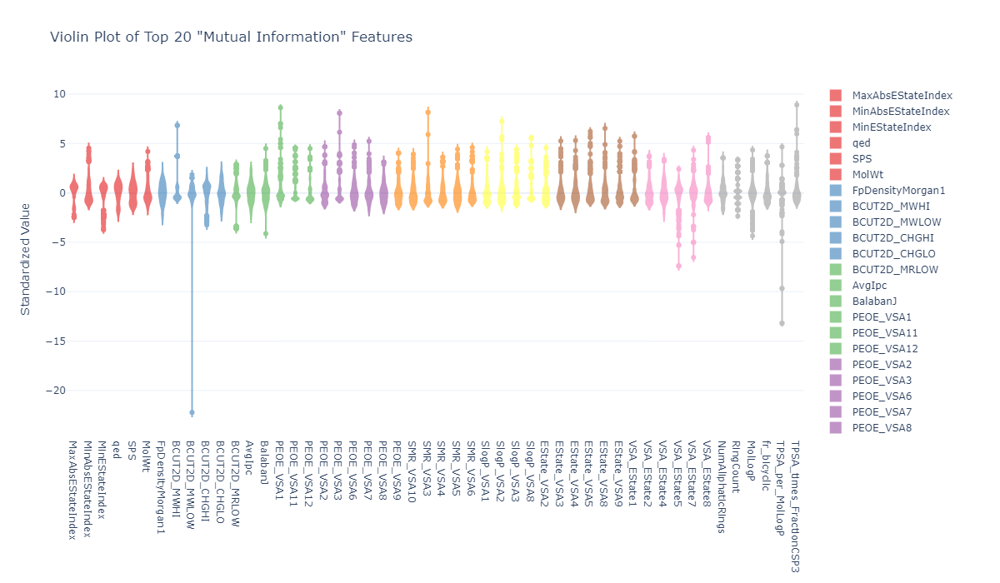

------------------------------------------------------------------------------------------------------------------------------------------------------


In [81]:
# Выбираем первые 50 признаков
mi_features = feature_selector.mi_selected_features


# Выводим результат
print(f'\nТоп-50 признаков по "Mutual Information":\n\n{feature_selector.mi_scores.head(50)}')
print('-' * 40)
print('\n\n')


# Посторим график оценки важности первых 20 признаков при помощи функции 'violin_features'
violin_features(
    data = X_train_processed_df,
    features = mi_features,
    title1 = 'Скрипичный график отобранных признаков при помощи "Mutual Information"',
    title2 = 'Violin Plot of Top 20 "Mutual Information" Features',
    y_title = 'Standardized Value',
    color_type = 'Set1'
)

Выводим $50$ признаков, отобранных методом `F-test`:


Топ-50 признаков по "F-test":

fr_allylic_oxid             56.490719
PEOE_VSA7                   53.072117
NumSaturatedHeterocycles    37.833408
PEOE_VSA6                   37.678494
fr_ketone                   33.324991
MolLogP                     30.944306
fr_ketone_Topliss           30.255420
FpDensityMorgan1            30.066894
EState_VSA2                 26.088684
BCUT2D_CHGLO                23.933636
NumAliphaticHeterocycles    23.296562
VSA_EState4                 22.449139
SlogP_VSA3                  21.582203
MolWt                       18.591198
EState_VSA8                 18.359189
EState_VSA4                 18.316672
fr_NH2                      16.525368
SMR_VSA5                    15.404732
SMR_VSA4                    14.328620
qed                         14.157945
fr_Al_OH_per_benzene        14.076857
fr_ester                    13.912983
fr_Imine                    12.741556
BCUT2D_MWLOW                12.349037
VSA_EState7                 12.257082
NumAromaticHeteroc

C:\Users\User\AppData\Local\Temp\ipykernel_10128\717927959.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



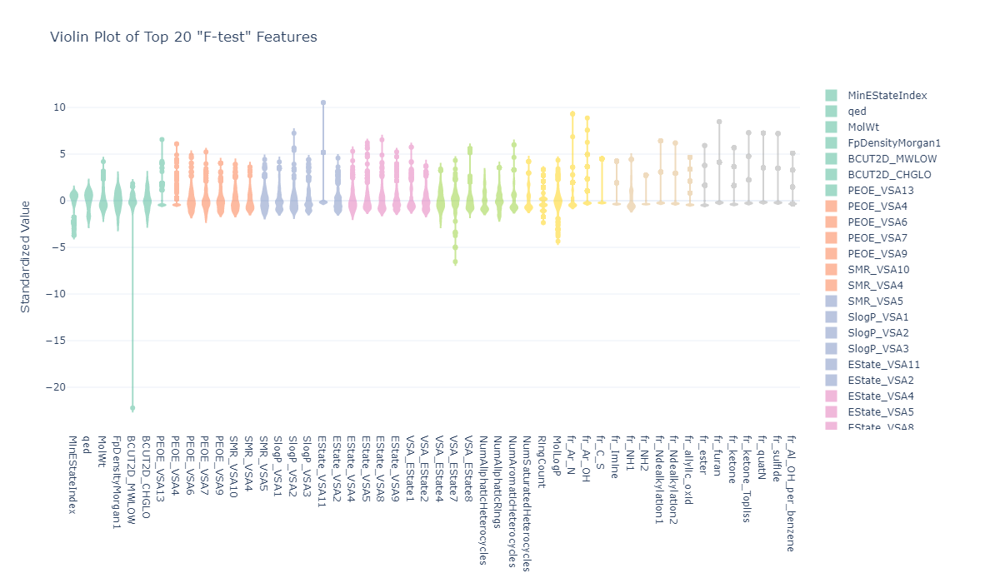

------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
# Выбираем первые 50 признаков
f_features = feature_selector.f_selected_features


# Выводим результат
print(f'\nТоп-50 признаков по "F-test":\n\n{feature_selector.f_scores.head(50)}')
print('-' * 40)
print('\n\n')


# Посторим график оценки важности первых 20 признаков при помощи функции 'violin_features'
violin_features(
    data = X_train_processed_df,
    features = f_features,
    title1 = 'Скрипичный график отобранных признаков при помощи "F-test"',
    title2 = 'Violin Plot of Top 20 "F-test" Features',
    y_title = 'Standardized Value',
    color_type = 'Set2'
)

Выводим финальные $30$ признаков, отобранных методом `LASSO`:


Топ-30 признаков по "LASSO":

fr_allylic_oxid             56.490719
PEOE_VSA7                   53.072117
NumSaturatedHeterocycles    37.833408
PEOE_VSA6                   37.678494
fr_ketone                   33.324991
MolLogP                     30.944306
fr_ketone_Topliss           30.255420
FpDensityMorgan1            30.066894
EState_VSA2                 26.088684
BCUT2D_CHGLO                23.933636
NumAliphaticHeterocycles    23.296562
VSA_EState4                 22.449139
SlogP_VSA3                  21.582203
MolWt                       18.591198
EState_VSA8                 18.359189
EState_VSA4                 18.316672
fr_NH2                      16.525368
SMR_VSA5                    15.404732
SMR_VSA4                    14.328620
qed                         14.157945
fr_Al_OH_per_benzene        14.076857
fr_ester                    13.912983
fr_Imine                    12.741556
BCUT2D_MWLOW                12.349037
VSA_EState7                 12.257082
NumAromaticHeterocy

C:\Users\User\AppData\Local\Temp\ipykernel_10128\717927959.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



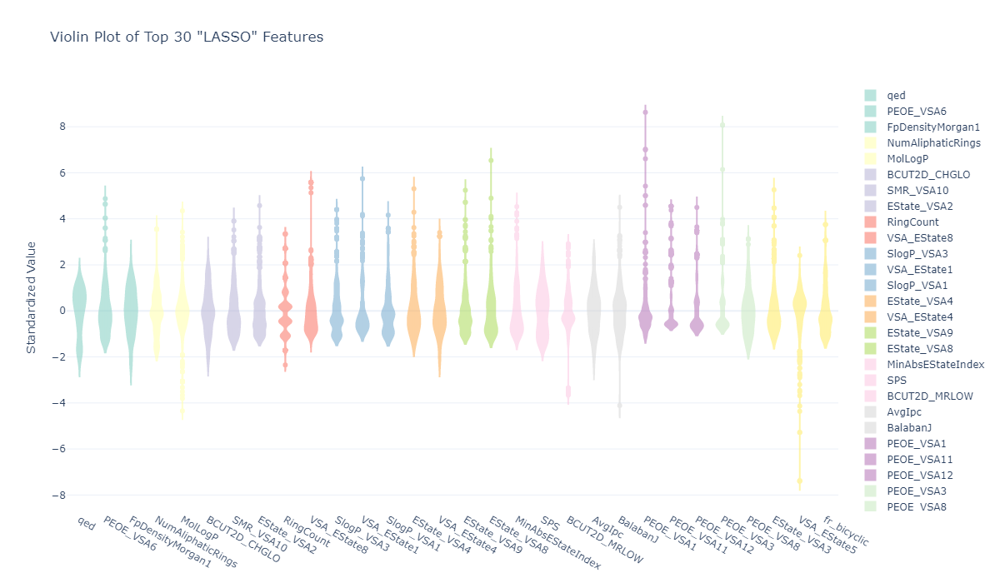

------------------------------------------------------------------------------------------------------------------------------------------------------


In [83]:
# Выбираем первые 30 признаков
lasso_features = feature_selector.final_features


# Выводим результат
print(f'\nТоп-30 признаков по "LASSO":\n\n{feature_selector.f_scores.head(30)}')
print('-' * 40)
print('\n\n')


# Посторим график оценки важности первых 30 признаков при помощи функции 'violin_features'
violin_features(
    data = X_train_processed_df,
    features = lasso_features,
    title1 = 'Скрипичный график отобранных признаков при помощи "LASSO"',
    title2 = 'Violin Plot of Top 30 "LASSO" Features',
    y_title = 'Standardized Value',
    color_type = 'Set3'
)

Построим график **Stacked Bar Chart** для сравнения значений признаков между `X_train_final` и `X_test_final`:

In [ ]:
# Финальные 30 признаков
final_features = feature_selector.final_features

# Средние значения для X_train_final и X_test_final
train_means = X_train_final[final_features].mean()
test_means = X_test_final[final_features].mean()

# Stacked Bar Chart
fig_stacked = go.Figure(data=[
    go.Bar(name='Train Mean', x=final_features, y=train_means, marker_color='rgb(158, 202, 225)'),
    go.Bar(name='Test Mean', x=final_features, y=test_means, marker_color='rgb(94, 158, 217)')
])

# Настройка графика
fig_stacked.update_layout(
    title="Stacked Bar Chart of Mean Values for Final 30 Features (CC50)",
    xaxis_title="Features",
    yaxis_title="Mean Value",
    barmode='stack',  # Стековый режим
    height=600,
    width=1200,
    template="plotly_white",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)
fig_stacked.show()

Проверим корреляцию отобранных признаков:


Тепловая карта корреляции отобранных признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


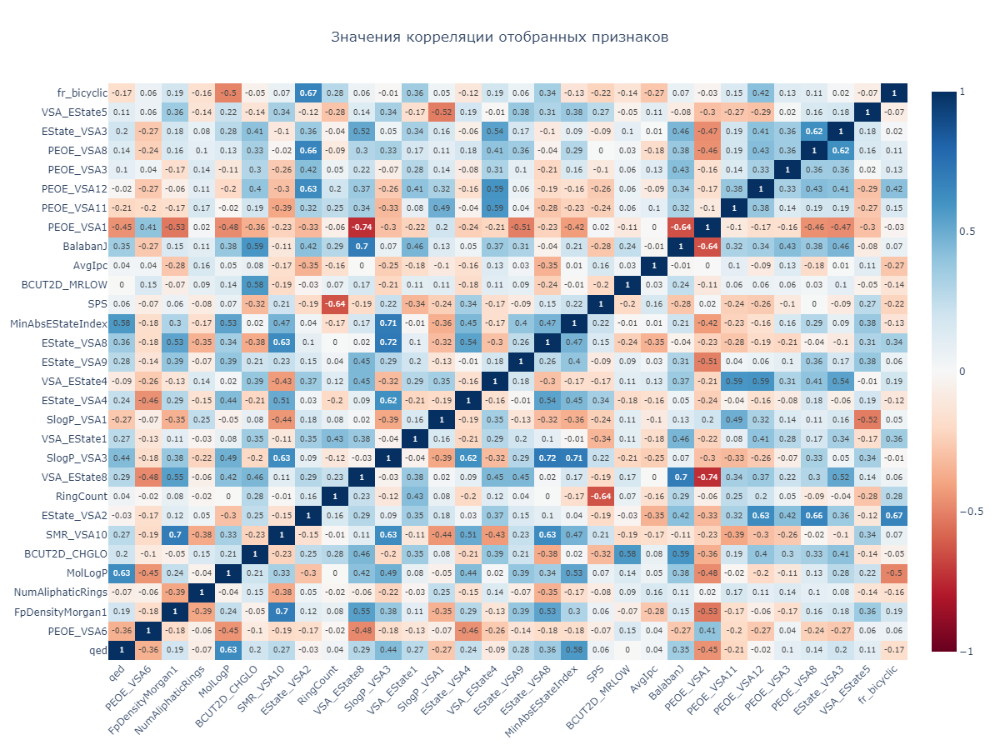

------------------------------------------------------------------------------------------------------------------------------------------------------


In [86]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(data = X_train_final)

**Вывод:**

По тепловой карте видно, что, как и ранее, значения корреляций признаков не выходят за пределы $+-0.79$, а следовательно высококоррелированные связи отсутствуют.

#### $2.3$

#### **Machine Learning.**

Используем всё те же модели, что и для предсказания `IC50`: 

* **LinearRegression**, 
* **Ridge**, 
* **SVR**, 
* **RandomForest**, 
* **XGBoost**, 
* **MLPRegressor**.

Для начала, сгенерируем полиномиальные признаки для моделей **LinearRegression**, **Ridge**:

In [87]:
# Создаём генератор полиномиальных признаков
poly_features = preprocessing.PolynomialFeatures(
    degree = 2,
    include_bias = False
)

# Обучаем на тренировочной выборке
poly_features.fit(X_train_final)



# Генерируем полиномиальные признаки
X_train_poly = poly_features.transform(X_train_final)
X_test_poly = poly_features.transform(X_test_final)

Создаём словарь, в котором ключами будут названия моделей, а значениями - словари с гиперпараметрами для подбора:

In [95]:
# Определяем модели и их гиперпараметры
ML_models = {
    
    # Определяем модель линейной регрессии
    'LinearRegression': {
        'model': linear_model.LinearRegression(),
        'param_grid': {},  
        'use_poly': True
    },
    
    
    
    # Определяем модель Ridge
    'Ridge': {
        'model': linear_model.Ridge(),
        
        'param_grid': {
            'alpha': [0.1, 1.0, 10.0, 100.0]
        },
        
        'use_poly': True
    },
    
    
    
    # Определяем модель опорных векторов
    'SVR': {
        'model': svm.SVR(),
        
        'param_grid': {
            'C': [0.1, 1, 10],
            'epsilon': [0.01, 0.1, 0.5],
            'kernel': ['rbf', 'linear']
        },
        
        'use_poly': False  
    },
    
    
    
    # Определяем модель случайного леса
    'RandomForest': {
        'model': ensemble.RandomForestRegressor(random_state = 42),
        
        'param_grid': {
            'n_estimators': [100, 200, 300],
            'max_depth': [None, 10, 20],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt', 'log2']
        },
        
        'use_poly': False  
    },
    
    
    
    # Определяем модель градиентного бустинга
    'XGBoost': {
        'model': XGBRegressor(random_state = 42),
        
        'param_grid': {
            'n_estimators': [100, 200, 300],
            'max_depth': [3, 6, 9],
            'learning_rate': [0.01, 0.1, 0.3],
            'colsample_bytree': [0.6, 0.8, 1.0],
            'subsample': [0.6, 0.8, 1.0],
            'min_child_weight': [1, 3, 5]
        },
        
        'use_poly': False  
    },
    
    
    
    # Определяем модель регрессионной нейронной сети
    'MLPRegressor': {
        'model': neural_network.MLPRegressor(random_state = 42),
        
        'param_grid': {
            'hidden_layer_sizes': [(64, 32), (128, 64)],
            'activation': ['relu', 'tanh'],
            'learning_rate_init': [0.001, 0.01],
            'alpha': [0.0001, 0.001],
            'max_iter': [500, 1000]
        },
        
        'use_poly': False 
    }
    
}

Теперь создадим функцию, которая будет использоваться для обучения и оценки моделей:

In [96]:
# Создаём функцию 'train_model' для обучения и оценки модели
def train_model(model_name, config, X_train, X_test, y_train, y_test):
    
    # Выводим обучаемую модель
    print(f'\n\n\nОбучение модели: {model_name}')
    
    # Выбираем данные в зависимости от использования полиномиальных признаков
    X_train_data = X_train_poly if config['use_poly'] else X_train
    X_test_data = X_test_poly if config['use_poly'] else X_test
    
    
    
    # Перебор гиперпараметров с использованием алгоритма 'GridSearchCV'
    # если гиперпараметры заданы
    if config['param_grid']:
        
        # Инициализируем класс 'GridSearchCV' с заданными гиперпараметрами
        grid_search = model_selection.GridSearchCV(
            estimator = config['model'],
            param_grid = config['param_grid'],
            cv = 3,
            verbose = 2,
            n_jobs = -1
        )
        
        # Обучаем наш класс
        grid_search.fit(X_train_data, y_train)
        
        # Сохраняем лучшие гиперпараметры
        best_model = grid_search.best_estimator_
        
        # Выводим результат
        print(f'Лучшие параметры для {model_name}: {grid_search.best_params_}')
        print('-' * 80)
        print('\n\n')
    
    
    # если гиперпараметры не заданы    
    else:
        
        # Оставляем стандартные параметры
        best_model = config['model']
        best_model.fit(X_train_data, y_train)
        
        
        
    # Делаем предсказание
    y_predict = best_model.predict(X_test_data)
    
    # Вызываем 'print_metrics' для вывода и получения метрик
    metrics_result = print_metrics(
        y_test,
        y_predict = y_predict,
        model_name = model_name,
        decimal_places = 3
    )
    
    
    
    # Возвращаем результат
    return metrics_result

Обучаем модели и строим предсказания:

In [57]:
# Создаём словарь, в котором будем хранить наши предсказания
results = {}


# Создём цикл по созданному ранее словарю с моделями
# и обучаем их при помощи функции 'train_model'
for name, config in ML_models.items():
    
    # Заносим в словарь 'results' модели и метрики
    results[name] = train_model(
        name,
        config = config,
        X_train = X_train_final,
        X_test = X_test_final,
        y_train = y_train,
        y_test = y_test
    )




Обучение модели: LinearRegression

LinearRegression (значения метрик):

Mean Squared Error: 547.052
-----------------------------------
Root Mean Squared Error: 23.389
-----------------------------------
Mean Absolute Error: 15.153
-----------------------------------
R²: -255.172
-----------------------------------
Mean Absolute Percentage Error: 322.508%
----------------------------------------



Обучение модели: Ridge
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Лучшие параметры для Ridge: {'alpha': 100.0}
--------------------------------------------------------------------------------

Ridge (значения метрик):

Mean Squared Error: 2.976
-----------------------------------
Root Mean Squared Error: 1.725
-----------------------------------
Mean Absolute Error: 1.327
-----------------------------------
R²: -0.394
-----------------------------------
Mean Absolute Percentage Error: 31.402%
----------------------------------------



Обучение модели: SVR
Fitting 3 folds

#### $2.5$

#### **Вывод.**

На данном этапе сделаем вывод итоговым метрикам и моделям, обученным для предсказания целевой переменной `CC50, mM`.

На данном этапе все модели показали плохие результаты, необходимо провести повторную предобработку данных и переобучить модели с другими гиперпараметрами.

=============================================================================================================================================

## <CENTER> **`3.` Machine Learning (SI)**

На данном этапе мы построим несколько подходящих моделей регрессии для **SI** и выберем наилучшую.

#### $3.1$

#### **Предобработка данных.**

Как и раньше, предобработаем данные при помощи созданного ранее пайплайна, только все этапы по предобработке, созданию и удалению признаков включим в отдельный класс.

Повторно загружаем пайплайн:

In [88]:
# Загружаем пайплайн при помощи joblib
preprocessing_pipeline = joblib.load('data/preprocessing_pipeline.joblib')
print("Пайплайн загружен из 'preprocessing_pipeline.joblib'")

Пайплайн загружен из 'preprocessing_pipeline.joblib'


Разделим данные:

In [87]:
# Разделяем данные на матрицу наблюдений и вектор правильных ответов
X = molecule_df.drop(columns = ['IC50, mM', 'CC50, mM', 'SI', 'log_IC50, mM', 'log_CC50, mM', 'log_SI'])
y = molecule_df['log_SI']

Применим пайплайн к данным:

In [89]:
# Создаём экземпляра класса 'DataPreprocessor'
DP_processor = DataPreprocessor(preprocessing_pipeline)

# Обработка данных
DP_processor.fit_transform(X, y)

# Получение обработанных данных
X_train_processed_df, X_test_processed_df, y_train, y_test, remaining_features = DP_processor.get_processed_data()


Данные таблицы "Molecular properties features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
------------------------------------------------------------




Данные таблицы "Functional groups features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 8.
----------------------------------------
------------------------------------------------------------------------------------------




Данные таблицы "Topological descriptors features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 4.
----------------------------------------
--------------------------------------------------------------------------------




Данные таблицы "Transformations features" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 3.
----------------------------------------
---------------------------------------------------

Выводим результат:

In [90]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_processed_df,
    data_name = 'X_train_processed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_processed_df,
    data_name = 'X_test_processed_df',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по оставшимся признакам
print(f'Оставшиеся признаки:\n\n{remaining_features.tolist()}')
print('-' * 150)


Данные таблицы "X_train_processed_df" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,-1.496602,0.422613,0.771519,0.579771,-0.081941,-0.172284,-0.720975,-0.482466,-0.231601,0.709602,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064531,-0.017568,-0.338656,-0.806000,-0.332149
1,0.527403,0.904784,-0.394927,0.514586,-0.554818,-0.694608,-0.970049,-0.465835,0.425592,0.670103,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064565,0.133615,-0.338656,-0.806000,-0.857136
2,0.252959,-0.894628,0.392277,0.397569,0.511590,-0.034503,1.347721,0.555049,-0.313054,0.077316,...,-0.174679,-0.210093,-0.266667,3.294307,-0.177731,-0.064578,0.146636,-0.338656,0.736551,1.215385
3,-1.210453,0.216033,0.750903,0.746949,1.699045,-1.145565,-0.554926,-0.589790,-0.967502,0.838770,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064458,-0.019390,-0.338656,-0.806000,-0.065901
4,0.694610,-0.824197,0.472459,1.392750,-0.120265,-0.264281,0.954612,0.555048,-0.403346,-0.483621,...,-0.174679,-0.210093,3.750000,-0.303554,-0.177731,-0.064567,0.009951,-0.338656,0.207477,-0.043975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,0.251380,0.324610,0.428609,-0.563375,-0.001549,-0.241286,0.655849,-0.479027,-0.231089,0.700544,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064533,-0.010548,-0.338656,0.211154,-0.300668
719,-1.577604,1.146384,0.843749,0.769183,0.451116,-0.010688,0.083725,-0.482669,-0.749877,0.230117,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064481,-0.085575,-0.338656,-0.300500,-0.744117
720,0.439661,-0.198519,0.198692,0.502574,-0.661393,0.463493,-0.416552,0.557248,0.434471,-0.335264,...,-0.174679,3.494726,-0.266667,-0.303554,-0.177731,-0.064571,0.086950,-0.338656,-0.806000,-0.622234
721,0.980138,-0.326590,-0.499596,-0.363831,-1.475648,0.285924,-0.703184,-0.304289,0.607120,-1.303146,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064583,0.134657,-0.338656,-0.806000,-0.643005


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_processed_df" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 103.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,0.160756,-0.510352,-0.302029,-0.353559,-1.315644,-0.863532,1.780140,0.559264,2.296748,-1.732256,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064599,-1.198955,-0.338656,0.168554,-0.016665
1,0.552605,-0.468304,-2.184035,-1.056662,-1.369489,-0.089109,0.528003,0.552297,1.154219,-0.893501,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064590,0.128426,-0.338656,1.068112,-0.717143
2,-0.045459,-1.061101,0.108325,0.426638,0.811860,-0.471906,1.224172,-0.471246,-0.265352,0.017607,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064578,0.213022,1.475033,1.241226,1.433804
3,0.464136,0.524951,-1.212053,-1.368374,-0.291834,0.854706,0.353155,0.492597,-0.231089,0.701536,...,-0.174679,-0.210093,-0.266667,-0.303554,0.788429,-0.064576,0.094904,-0.338656,1.152177,1.983047
4,-1.720945,1.330435,0.862116,-1.065667,0.899075,0.426860,-2.215418,-0.592477,-0.231368,0.760929,...,-0.174679,-0.210093,-0.266667,-0.303554,4.653068,-0.064459,-0.076881,-0.338656,-0.806000,-0.190647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,-1.488398,1.708016,0.899797,0.058433,1.462212,-1.667184,0.690443,-0.603011,0.127272,-0.483112,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064510,0.065149,-0.338656,-0.806000,-0.065901
177,0.562094,0.446785,0.434776,0.703003,-1.149026,-0.103926,-0.554926,-0.504065,0.884829,-1.319795,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064572,0.100585,-0.338656,-0.806000,-0.833169
178,0.417928,0.379878,0.409685,-0.011909,-1.476949,-0.073419,-0.395263,-0.482662,1.260989,-2.026415,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064572,0.099420,-0.338656,-0.806000,-0.842731
179,0.044589,-0.244271,0.028994,1.031010,0.347881,0.057249,-0.075938,-0.478956,-0.226828,0.099772,...,-0.174679,-0.210093,-0.266667,-0.303554,-0.177731,-0.064570,0.247098,-0.338656,-0.806000,0.764520


------------------------------------------------------------------------------------------------------------------------------------------------------




Оставшиеся признаки:

['MaxAbsEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'FpDensityMorgan1', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'Ipc', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA12', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA7', 'SlogP_VSA8', 'EState_VSA11', 'EState_VSA2', 'EState_VSA3', 'EState_VSA4', 'EState_VSA5', 'EState_VSA6', 'EState_VSA7', 'EState_VSA8', 'EState_VSA9', 'VSA_EState1', 'VSA_EState2', 'VSA_EState4', 'VSA_EState5', 'VSA_EState7', 'VSA_EState8', 'VSA_EState9', 'NumAliphatic

По результатам видно, что данные, после применения класса, имеют схожую структуру, что и при прошлой предобработки.

Проверим распределение признаков при помощи визуализации:


График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


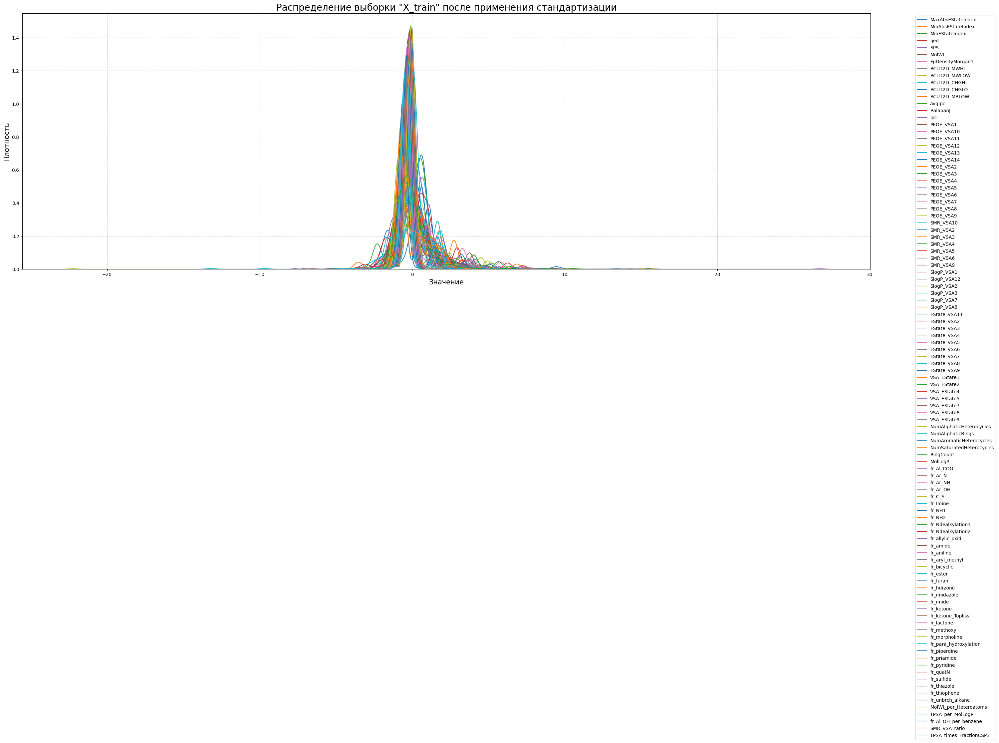

------------------------------------------------------------------------------------------------------------------------------------------------------



График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


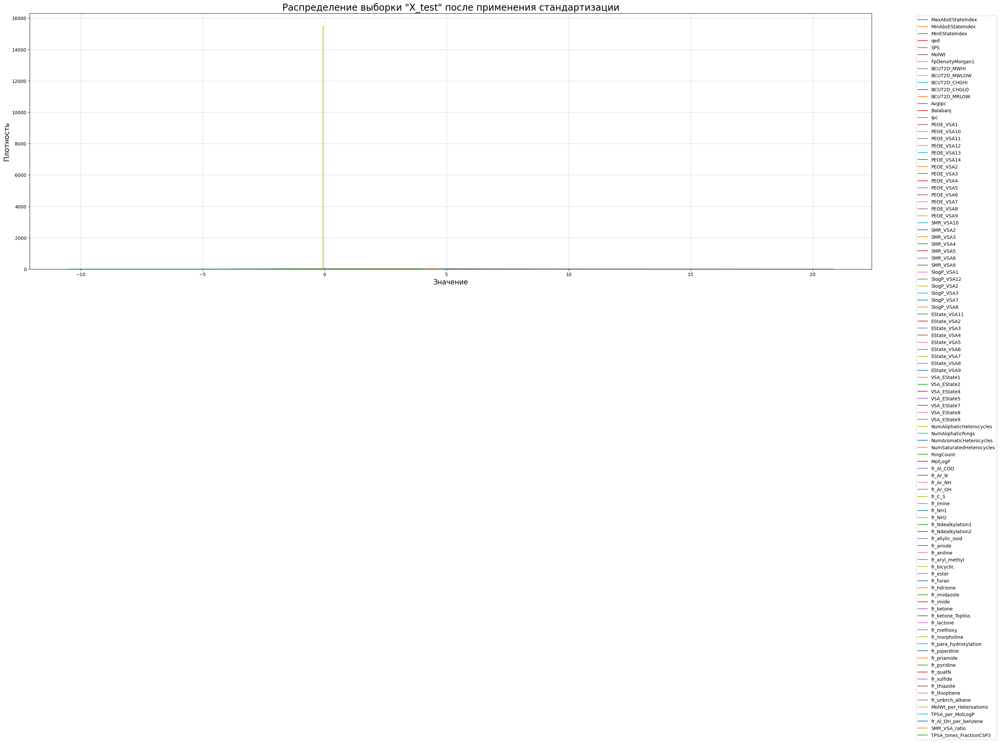

------------------------------------------------------------------------------------------------------------------------------------------------------


In [92]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_train
print()
features_distribution_plot(
    data = X_train_processed_df,
    title = 'Распределение выборки "X_train" после применения стандартизации',
    figsize = (30, 17)
)

# Добавляем отступ
print('\n\n')



# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков X_test
features_distribution_plot(
    data = X_test_processed_df,
    title = 'Распределение выборки "X_test" после применения стандартизации',
    figsize = (30, 17)
)

Данные стандартизированы, можно приступать к следующему шагу.

#### $3.2$

#### **Отбор самых информативных признаков.**

На данном этапе отберём только самые информативные признаки для дальнейшего решения задачи регрессии.

Производить отбор признаков будем так же, как и для `IC50`, в $4$ этапа:

1. Отберём $50$ признаков с помощью алгоритма **Mutual Information**,
2. Отберём $50$ признаков с помощью алгоритма **F-test**,
3. Отберём $50$ признаков из отобранных обоими алгоритмами,
4. Из оставшихся отберём $30$ признаков с помощью алгоритма **Lasso**.

Воспользуемся созданным ранне классом.

Применим класс `FeatureSelector` к данным:

In [97]:
# Инициализируем класс 'FeatureSelector'         
feature_selector = FeatureSelector(
    mi_k = 50,
    f_k = 50,
    lasso_max_features = 30,
    lasso_alpha = 0.01
)

# Обучаем класс на данных
feature_selector.fit_transform(X_train_processed_df, X_test_processed_df, y_train)

# Получение обработанных данных
X_train_final, X_test_final, final_features = feature_selector.get_final_data()

# Выводим результат
feature_selector.print_results()


Топ-30 финальных признаков после "LASSO"

NumSaturatedHeterocycles    0.187000
NumAliphaticRings           0.174419
fr_Imine                    0.168264
SPS                         0.155286
SlogP_VSA2                  0.153634
VSA_EState1                 0.107496
EState_VSA7                 0.099795
SlogP_VSA1                  0.099507
VSA_EState4                 0.096304
EState_VSA8                 0.088845
PEOE_VSA6                   0.081172
PEOE_VSA2                   0.074085
BCUT2D_CHGLO                0.069727
FpDensityMorgan1            0.061750
VSA_EState8                 0.061426
BCUT2D_MWLOW                0.060607
PEOE_VSA8                   0.057350
SlogP_VSA8                  0.052570
BCUT2D_MWHI                 0.050358
PEOE_VSA7                   0.048608
VSA_EState2                 0.044560
PEOE_VSA12                  0.039179
fr_Al_OH_per_benzene        0.035461
MolWt                       0.030294
VSA_EState7                 0.028067
MinEStateIndex              0.02

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:486: UserWarning:

X has feature names, but SelectFromModel was fitted without feature names



Выведем информацию итоговых выборок:

In [98]:
# Информация по тренеровочной выборке
check_data_inf(
    data = X_train_final,
    data_name = 'X_train_final',
    length1 = 40,
    length2 = 150
)
print('\n\n\n')


# Информация по тестовой выборке
check_data_inf(
    data = X_test_final,
    data_name = 'X_test_final',
    length1 = 40,
    length2 = 150
)


Данные таблицы "X_train_final" имеют следующую размерность:

Количество строк: 723;
Количество признаков (столбцов): 30.
----------------------------------------


,VSA_EState4,MinEStateIndex,SPS,fr_Imine,EState_VSA6,VSA_EState1,VSA_EState2,TPSA_per_MolLogP,fr_Al_OH_per_benzene,MolWt,...,BCUT2D_CHGLO,AvgIpc,PEOE_VSA12,PEOE_VSA2,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SlogP_VSA1,SlogP_VSA2,NumAliphaticRings
0,2.503470,-0.081941,-0.054649,-0.642902,-0.510177,-0.172284,-0.332149,-0.725093,0.105850,-0.571672,...,-0.577540,-0.638151,-0.283280,-0.021284,-1.133018,-0.791905,0.703425,-0.123882,-0.729421,-0.806000
1,0.014302,-0.554818,-0.966737,-0.612792,-0.228040,-0.694608,-0.857136,-0.725093,-0.570074,-0.571672,...,-0.577540,-0.638151,-0.116601,-1.513317,-0.889025,0.381094,0.042850,-0.123882,-0.729421,-0.806000
2,-0.834664,0.511590,0.752115,1.659867,-0.483553,-0.034503,1.215385,0.508418,0.096607,-0.571672,...,-0.577540,0.389551,-0.096764,1.658586,-0.456006,0.092873,-0.479599,-0.123882,0.615914,0.736551
3,1.851472,1.699045,0.756481,-0.632769,-0.823985,-1.145565,-0.065901,-0.725093,1.190440,-0.571672,...,-0.577540,-0.638151,-0.613549,-1.021808,-1.139996,-0.791905,-0.369657,1.344428,-0.729421,-0.806000
4,-0.370231,-0.120265,0.149113,0.774582,-0.068435,-0.264281,-0.043975,-0.725093,-0.118455,0.820604,...,-0.022849,-0.638151,0.257495,-0.932554,-0.445268,-1.164993,-1.002048,-0.858037,0.615914,0.207477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,0.271046,-0.001549,-0.054649,-0.154825,-0.542370,-0.241286,-0.300668,-0.725093,0.676182,0.256341,...,-0.577540,-0.638151,1.163576,0.013202,-0.360715,0.114232,0.071034,-0.123882,-0.729421,0.211154
719,1.202870,0.451116,0.983472,-1.085657,-0.524807,-0.010688,-0.744117,0.508418,0.648684,-0.571672,...,-0.577540,-0.638151,1.221381,0.228973,0.160940,-0.011078,-0.479599,0.610273,-0.729421,-0.300500
720,0.280488,-0.661393,-0.795632,0.319731,-0.541832,0.463493,-0.622234,0.508418,-0.454525,0.896349,...,0.003343,-0.638151,1.040884,-0.943551,0.023722,-0.722604,0.083057,-0.123882,-0.729421,-0.806000
721,-1.533837,-1.475648,-1.391050,-0.160658,2.477075,0.285924,-0.643005,-0.725093,-0.570074,2.466311,...,3.750566,1.318374,-1.274086,-1.019632,-0.261109,-0.350889,0.530036,-1.592192,0.615914,-0.806000


------------------------------------------------------------------------------------------------------------------------------------------------------





Данные таблицы "X_test_final" имеют следующую размерность:

Количество строк: 181;
Количество признаков (столбцов): 30.
----------------------------------------


,VSA_EState4,MinEStateIndex,SPS,fr_Imine,EState_VSA6,VSA_EState1,VSA_EState2,TPSA_per_MolLogP,fr_Al_OH_per_benzene,MolWt,...,BCUT2D_CHGLO,AvgIpc,PEOE_VSA12,PEOE_VSA2,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SlogP_VSA1,SlogP_VSA2,NumAliphaticRings
0,-1.070186,-0.302029,-1.315644,-0.358602,-0.864386,-0.196948,0.680807,-1.198955,-0.338656,-0.863532,...,2.808560,-0.523923,0.258940,0.478616,-1.274086,-1.638111,-0.958198,-0.097606,0.259309,-1.592192
1,0.072302,-2.184035,-1.369489,-0.358602,-0.864386,1.861870,-1.092745,0.128426,-0.338656,-0.089109,...,1.717081,0.279302,-0.638151,0.731763,-1.274086,0.323003,-1.008634,0.702317,-0.514649,-1.592192
2,-1.001606,0.108325,0.811860,-0.358602,-0.421934,-0.215910,-0.360243,0.213022,1.475033,-0.471906,...,-0.808107,0.033512,-0.638151,0.663501,-0.637539,-0.457205,-0.418413,-0.955548,-0.485835,-0.123882
3,0.251347,-1.212053,-0.291834,1.935815,-0.864386,0.821808,-0.738469,0.094904,-0.338656,0.854706,...,0.061560,1.105525,-0.638151,1.350016,-0.034597,0.666848,0.054797,-0.955548,0.786383,-0.123882
4,0.932722,0.862116,0.899075,4.230233,-0.031220,-0.823985,-0.357125,-0.076881,-0.338656,0.426860,...,0.059434,0.816310,-0.638151,0.641946,1.932642,1.404096,1.622910,-0.955548,-0.373630,1.344428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,1.288017,0.899797,1.462212,-0.358602,-0.864386,-0.823985,-1.092745,0.065149,-0.338656,-1.667184,...,0.675382,-0.925508,-0.638151,-1.019830,-0.967807,0.079415,-0.977181,-0.070691,-1.119683,-0.123882
177,1.781502,0.434776,-1.149026,1.935815,0.083050,-0.754509,0.152801,0.100585,-0.338656,-0.103926,...,1.409520,0.523212,-0.638151,0.681144,1.016894,-0.711178,-0.481319,-0.118205,-0.268689,-0.858037
178,-0.127502,0.409685,-1.476949,-0.358602,0.020518,-0.135080,0.121094,0.099420,-0.338656,-0.073419,...,1.493611,1.059089,0.396712,0.663003,0.172770,-0.252574,-1.513317,0.595997,-0.472495,-1.592192
179,-0.465348,0.028994,0.347881,-0.358602,0.691279,0.380878,-1.092745,0.247098,-0.338656,0.057249,...,-0.836497,-0.510611,0.362121,-1.019830,-0.984255,0.061704,-0.418413,1.237523,0.629610,-0.123882


------------------------------------------------------------------------------------------------------------------------------------------------------


**Построение визуализаций.**

Для начала создадим функцию, для построения пузырьковых графиков отобранных признаков:

In [99]:
# Создаём функцию 'bubble_features' для построения скрипичного графика
def bubble_features(data, metric, title1, title2, value1, key2, value2, color):
    
    
    # Задаём заголовок для графика
    print()
    print(title1)
    print('-' * 150)
    
    
    # Строим график
    fig_bubble = px.scatter(
        data,
        x = metric,
        y = 'Mean_Value_Normalized',
        size = 'Std_Value',
        color = color,
        hover_data = ['Feature'],
        text = 'Feature',  
        title = title2,
        
        labels = {
            metric: value1,
            'Mean_Value_Normalized': 'Normalized Mean Value of Feature',
            'Std_Value': 'Standard Deviation',
            key2: value2
        },
        
        height = 700,
        width = 1200,
        template = 'plotly_white'
    )


    # Настраиваем текст и масштаб
    fig_bubble.update_traces(
        textposition = 'top center',  
        textfont = dict(size = 8),  
        
        marker = dict(
            opacity = 0.7,
            sizemin = 10
        )
    )
    
    
    # Настраиваем оформление всей фигуры
    fig_bubble.update_layout(
        showlegend = True,
        xaxis_title = value1,
        yaxis_title = 'Normalized Mean Value of Feature',
        coloraxis_colorbar_title = value2,
        coloraxis_colorscale = 'RdBu',
        legend_title = 'Features',
        
        legend = dict(
            orientation = 'v',  
            yanchor = 'top',
            y = 1,
            xanchor = 'left',
            x = 1.05
        )
    )


    # Выводим график
    fig_bubble.show('png')
    print('-' * 150)

Теперь создадим **DataFrame** отобранных признаков (`Mutual Information`) и строим визуализацию:


Данные таблицы "mi_bubble_data" имеют следующую размерность:

Количество строк: 15;
Количество признаков (столбцов): 6.
-----------------------------------


,Feature,Mutual_Score,Mean_Value,Std_Value,Correlation_with_SI,Mean_Value_Normalized
MaxAbsEStateIndex,MaxAbsEStateIndex,23.442387,2.530633e-16,1.000692,-0.059225,0.708364
MinAbsEStateIndex,MinAbsEStateIndex,5.712233,-1.572432e-16,1.000692,0.033246,0.584752
MinEStateIndex,MinEStateIndex,19.997473,-2.702618e-17,1.000692,0.020246,0.623982
qed,qed,0.255527,-3.562541e-16,1.000692,0.043668,0.524796
SPS,SPS,3.209461,-3.685388e-17,1.000692,0.018415,0.621021
MolWt,MolWt,2.872530,3.292280e-16,1.000692,-0.061104,0.731310
FpDensityMorgan1,FpDensityMorgan1,1.380415,8.648376e-16,1.000692,0.023511,0.892672
BCUT2D_MWHI,BCUT2D_MWHI,1.112223,-1.965540e-16,1.000692,-0.072109,0.572909
BCUT2D_MWLOW,BCUT2D_MWLOW,6.732411,1.221092e-15,1.000692,-0.025021,1.000000
BCUT2D_CHGHI,BCUT2D_CHGHI,0.001156,-2.098214e-15,1.000692,0.008443,0.000000


-------------------------------------------------------------------------------------------------------------------




Пузырьковый график отобранных признаков при помощи "Mutual Information":
------------------------------------------------------------------------------------------------------------------------------------------------------


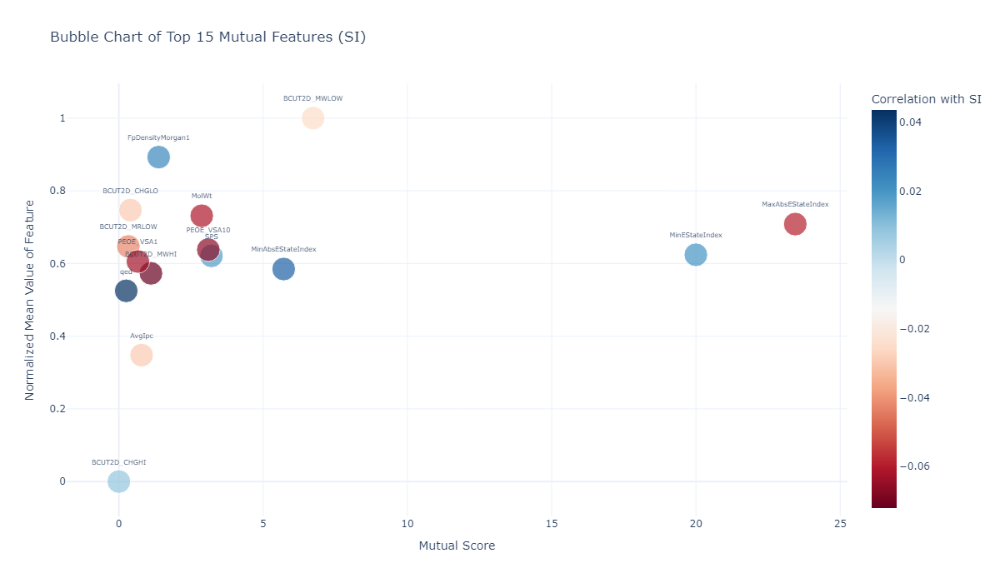

------------------------------------------------------------------------------------------------------------------------------------------------------


In [101]:
# Выделим 15 признаков
mi_features = feature_selector.mi_selected_features[:15]  

# Создаем DataFrame для визуализации
mi_bubble_data = pd.DataFrame({
    'Feature': mi_features,
    'Mutual_Score': feature_selector.f_scores.loc[mi_features],
    'Mean_Value': [X_train_processed_df[feature].mean() for feature in mi_features],
    'Std_Value': [X_train_processed_df[feature].std() for feature in mi_features],
    'Correlation_with_SI': [X_train_processed_df[feature].corr(y_train) for feature in mi_features]
})

# Удаляем строки с NaN
mi_bubble_data = mi_bubble_data.dropna()

# Нормализация Mean_Value
mi_bubble_data['Mean_Value_Normalized'] = (mi_bubble_data['Mean_Value'] - mi_bubble_data['Mean_Value'].min()) / (mi_bubble_data['Mean_Value'].max() - mi_bubble_data['Mean_Value'].min())

# Выводим информацию 
check_data_inf(
    data = mi_bubble_data,
    data_name = 'mi_bubble_data',
    length1 = 35,
    length2 = 115
)
print('\n\n')



# Выводим график
bubble_features(
    mi_bubble_data,
    metric = 'Mutual_Score',
    title1 = 'Пузырьковый график отобранных признаков при помощи "Mutual Information":',
    title2 = 'Bubble Chart of Top 15 Mutual Features (SI)',
    value1 = 'Mutual Score',
    key2 = 'Correlation_with_SI',
    value2 = 'Correlation with SI',
    color = 'Correlation_with_SI'
)

Создадим **DataFrame** отобранных признаков (`F_Score`) и строим визуализацию:


Данные таблицы "f_bubble_data" имеют следующую размерность:

Количество строк: 10;
Количество признаков (столбцов): 6.
-----------------------------------


,Feature,F_Score,Mean_Value,Std_Value,Correlation_with_CC50,Mean_Value_Normalized
MaxAbsEStateIndex,MaxAbsEStateIndex,23.442387,2.530633e-16,1.000692,-0.059225,0.297683
MinAbsEStateIndex,MinAbsEStateIndex,5.712233,-1.572432e-16,1.000692,0.033246,0.000000
MinEStateIndex,MinEStateIndex,19.997473,-2.702618e-17,1.000692,0.020246,0.094474
SPS,SPS,3.209461,-3.685388e-17,1.000692,0.018415,0.087344
MolWt,MolWt,2.872530,3.292280e-16,1.000692,-0.061104,0.352941
BCUT2D_MWLOW,BCUT2D_MWLOW,6.732411,1.221092e-15,1.000692,-0.025021,1.000000
PEOE_VSA10,PEOE_VSA10,3.099729,1.965540e-17,1.000692,-0.066521,0.128342
PEOE_VSA13,PEOE_VSA13,3.770089,5.405235e-17,1.000692,0.048386,0.153298
PEOE_VSA14,PEOE_VSA14,10.384130,-1.965540e-17,1.000692,0.001319,0.099822
PEOE_VSA4,PEOE_VSA4,6.400425,-6.633698e-17,1.000692,-0.005212,0.065954


-------------------------------------------------------------------------------------------------------------------





Пузырьковый график отобранных признаков при помощи "F_score":
------------------------------------------------------------------------------------------------------------------------------------------------------


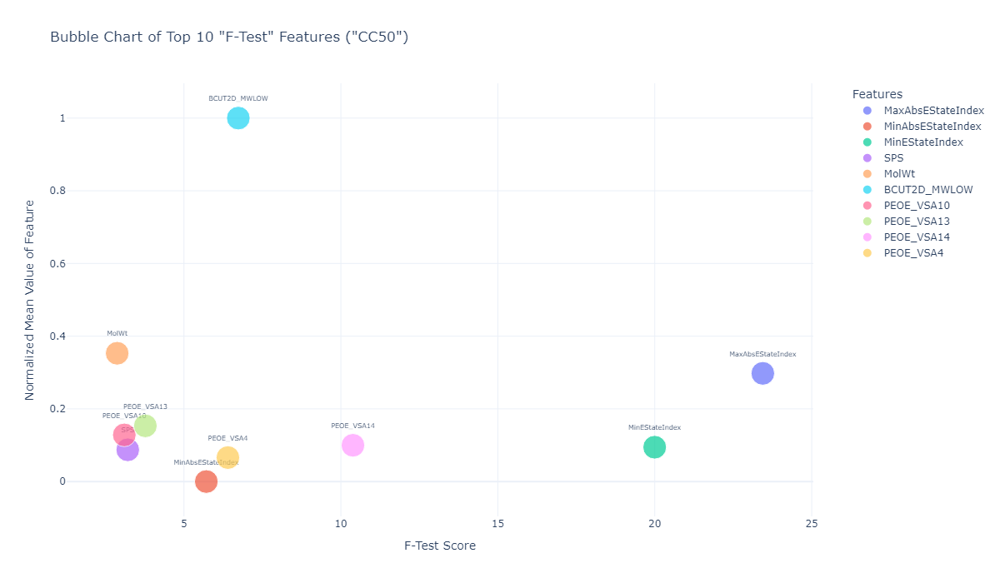

------------------------------------------------------------------------------------------------------------------------------------------------------


In [103]:
# Создаем DataFrame для визуализации (только топ-10 признаков)
f_features = feature_selector.f_selected_features[:10]
f_bubble_data = pd.DataFrame({
    'Feature': f_features,
    'F_Score': feature_selector.f_scores.loc[f_features],
    'Mean_Value': [X_train_processed_df[feature].mean() for feature in f_features],
    'Std_Value': [X_train_processed_df[feature].std() for feature in f_features],
    'Correlation_with_CC50': [X_train_processed_df[feature].corr(y_train) for feature in f_features]
})

# Удаляем строки с NaN
f_bubble_data = f_bubble_data.dropna()

# Нормализация Mean_Value
f_bubble_data['Mean_Value_Normalized'] = (f_bubble_data['Mean_Value'] - f_bubble_data['Mean_Value'].min()) / (f_bubble_data['Mean_Value'].max() - f_bubble_data['Mean_Value'].min())

# Выводим информацию 
check_data_inf(
    data = f_bubble_data,
    data_name = 'f_bubble_data',
    length1 = 35,
    length2 = 115
)
print('\n\n')



# Задаём заголовок для графика
print()
print('\nПузырьковый график отобранных признаков при помощи "F_score":')
print('-' * 150)



# Bubble Chart с цветами по признакам и легендой
fig_bubble = px.scatter(
    f_bubble_data,
    x = 'F_Score',
    y = 'Mean_Value_Normalized',
    size = 'Std_Value',
    color = 'Feature',  # Цвета теперь зависят от Feature
    hover_data = ['Correlation_with_CC50'],  # Корреляция в подсказках
    text = 'Feature',
    title = 'Bubble Chart of Top 10 "F-Test" Features ("CC50")',
    
    labels = {
        'F_Score': 'F-Test Score',
        'Mean_Value_Normalized': 'Normalized Mean Value of Feature',
        'Std_Value': 'Standard Deviation',
        'Correlation_with_CC50': 'Correlation with CC50'
    },
    
    height = 700,
    width = 1200,
    template = 'plotly_white'
)

# Настраиваем текст и масштаб
fig_bubble.update_traces(
    textposition = 'top center',
    textfont = dict(size = 8),
    marker = dict(
        opacity = 0.7,
        sizemin = 10
    )
)

# Настраиваем оформление всей фигуры
fig_bubble.update_layout(
    showlegend = True,
    xaxis_title = 'F-Test Score',
    yaxis_title = 'Normalized Mean Value of Feature',
    legend_title = 'Features',
    
    legend = dict(
        orientation = 'v',  # Вертикальная легенда
        yanchor = 'top',
        y = 1,
        xanchor = 'left',
        x = 1.05
    )
    
)

# Выводим график
fig_bubble.show('png')
print('-' * 150)

Проверим корреляцию отобранных признаков:


Тепловая карта корреляции отобранных признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


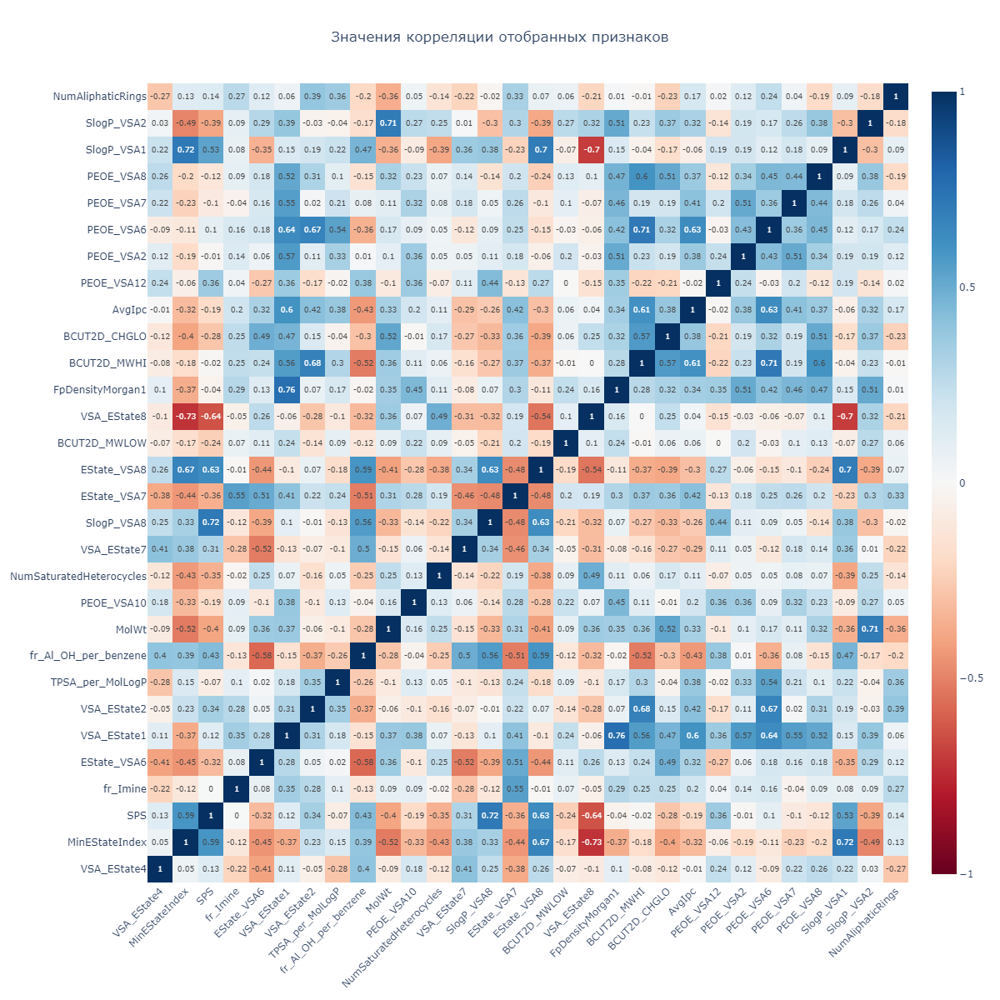

------------------------------------------------------------------------------------------------------------------------------------------------------


In [104]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(data = X_train_final)

**Вывод:**

По тепловой карте видно, что, как и ранее, значения корреляций признаков не выходят за пределы $+-0.79$, а следовательно высококоррелированные связи отсутствуют.

#### $3.3$

#### **Machine Learning.**

Используем всё те же модели, что и для предсказания `IC50` и `CC50`: 

* **LinearRegression**, 
* **Ridge**, 
* **SVR**, 
* **RandomForest**, 
* **XGBoost**, 
* **MLPRegressor**.

Для начала, сгенерируем полиномиальные признаки для моделей **LinearRegression**, **Ridge**:

In [105]:
# Создаём генератор полиномиальных признаков
poly_features = preprocessing.PolynomialFeatures(
    degree = 2,
    include_bias = False
)

# Обучаем на тренировочной выборке
poly_features.fit(X_train_final)



# Генерируем полиномиальные признаки
X_train_poly = poly_features.transform(X_train_final)
X_test_poly = poly_features.transform(X_test_final)

Обучаем модели и строим предсказания:

In [106]:
# Создаём словарь, в котором будем хранить наши предсказания
results = {}


# Создём цикл по созданному ранее словарю с моделями
# и обучаем их при помощи функции 'train_model'
for name, config in ML_models.items():
    
    # Заносим в словарь 'results' модели и метрики
    results[name] = train_model(
        name,
        config = config,
        X_train = X_train_final,
        X_test = X_test_final,
        y_train = y_train,
        y_test = y_test
    )




Обучение модели: LinearRegression

LinearRegression (значения метрик):

Mean Squared Error: 1606.837
-----------------------------------
Root Mean Squared Error: 40.085
-----------------------------------
Mean Absolute Error: 24.322
-----------------------------------
R²: -1241.787
-----------------------------------
Mean Absolute Percentage Error: 1782.834%
----------------------------------------



Обучение модели: Ridge
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Лучшие параметры для Ridge: {'alpha': 100.0}
--------------------------------------------------------------------------------




Ridge (значения метрик):

Mean Squared Error: 1.611
-----------------------------------
Root Mean Squared Error: 1.269
-----------------------------------
Mean Absolute Error: 0.994
-----------------------------------
R²: -0.246
-----------------------------------
Mean Absolute Percentage Error: 70.624%
----------------------------------------



Обучение модели: SVR
Fitting 3

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



#### $3.5$

#### **Вывод.**

На данном этапе сделаем вывод итоговым метрикам и моделям, обученным для предсказания целевой переменной `SI`.

Так же, как и в случае с `CC50`, все модели показали плохие результаты, необходимо провести повторную предобработку данных и переобучить модели с другими гиперпараметрами.